## import necessary libraries

In [1]:
import random
import math
import matplotlib.pyplot as plt
import numpy as np

## implement helper functions

In [2]:
# TODO: Implement the distance function
def distance(city1, city2):
    """Calculate Euclidean distance between two cities."""
    city1 = cities[city1]
    city2 = cities[city2]
    return math.sqrt((city1[0] - city2[0])**2 + (city1[1] - city2[1])**2)

# TODO: Implement the fitness function
def fitness(route):
    """Calculate the total distance of the route. Lower is better."""
    total_distance = 0
    for i in range(len(route)):
        total_distance += distance(route[i], route[i-1])
    return total_distance

# TODO: Initialize the population
def initialize_population(size, num_cities):
    """Generate a population of random permutations of cities."""
    list = []
    for _ in range(size):
        list.append(random.sample(range(num_cities), num_cities))
    return list

# TODO: Implement selection
def select_parents(population, fitness_scores):
    """Select a parent solution based on fitness scores."""
    return random.choices(population, weights=[1 / score for score in fitness_scores], k=2)

# TODO: Implement crossover
def crossover(parent1, parent2):
    """Generate two offspring using ordered crossover (OX)."""
    n = len(parent1)
    a = random.randint(0, n-1)
    b = random.randint(a, n)
    child1 = [-1] * n
    child2 = [-1] * n
    child1[a:b] = parent1[a:b]
    child2[a:b] = parent2[a:b]

    j = b
    for i in range(b, n + b):
        if parent2[i % n] not in child1:
            child1[j % n] = parent2[i % n]
            j += 1
    j = b
    for i in range(b, n + b):
        if parent1[i % n] not in child2:
            child2[j % n] = parent1[i % n]
            j += 1

    return child1, child2

# TODO: Implement mutation
def mutate(route, mutation_rate):
    """Introduce a random mutation in the route."""
    if np.random.random() < mutation_rate:
        i = random.randint(0, len(route) - 1)
        j = random.randint(0, len(route) - 1)
        route[i], route[j] = route[j], route[i]
    return route

# Visualization Function
def visualize_route(route, cities, generation):
    """Plot the current best route."""
    x = [cities[i][0] for i in route] + [cities[route[0]][0]]
    y = [cities[i][1] for i in route] + [cities[route[0]][1]]

    plt.figure(figsize=(6, 6))
    plt.plot(x, y, '-o', label=f'Generation {generation}')
    plt.title(f"Route Visualization (Generation {generation})")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.legend()
    plt.grid(True)
    plt.show()

## implement the GA and main loop

In [7]:
# TODO: Implement the Genetic Algorithm
def genetic_algorithm(cities, population_size=100, generations=300, mutation_rate=0.01, verboze=True):
    """Genetic Algorithm Main Loop"""

    num_cities = len(cities)
    population = initialize_population(population_size, num_cities)
    best_routes = []  # To track the best route per generation

    for generation in range(generations):
        # TODO: Evaluate fitness for the current population
        fitness_list = [fitness(route) for route in population]

        # TODO: Track the best route of the current generation
        best_route = population[np.argmin(fitness_list)]
        best_routes.append(best_route)

        # Log the best fitness
        if verboze:
            print(f"Generation {generation}: Best Fitness = {fitness(best_route)}")

        # TODO: Generate the next generation
        new_population = []
        for _ in range(population_size // 2):   # 50% of the population
            parents = select_parents(population, fitness_list)
            route1, route2 = parents[0], parents[1]
            offspring1, offspring2 = crossover(route1, route2)
            new_population.append(mutate(offspring1, mutation_rate))
            new_population.append(mutate(offspring2, mutation_rate))

        population = new_population

        # Visualize the best route every 25 generations
        if verboze and (generation % 25 == 0 or generation == generations - 1):
            visualize_route(best_route, cities, generation)

    # TODO: Return the best route and its distance
    best_route = best_routes[np.argmin([fitness(route) for route in best_routes])]
    return best_route, fitness(best_route)

## Run and test with different cities

### test 1

Generation 0: Best Fitness = 92.58519307559176


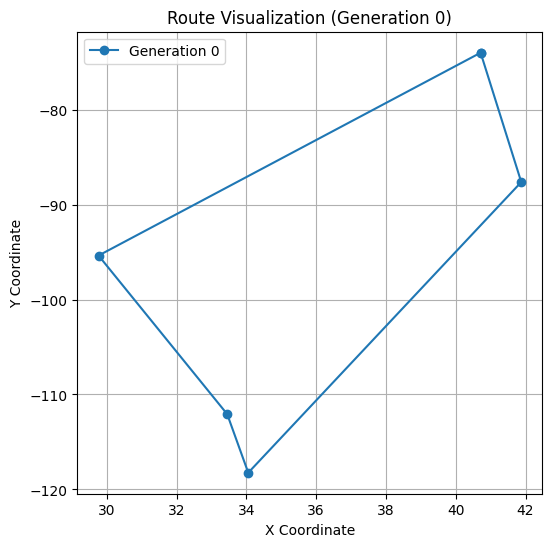

Generation 1: Best Fitness = 92.58519307559176
Generation 2: Best Fitness = 92.58519307559176
Generation 3: Best Fitness = 92.58519307559176
Generation 4: Best Fitness = 92.58519307559176
Generation 5: Best Fitness = 92.58519307559176
Generation 6: Best Fitness = 92.58519307559176
Generation 7: Best Fitness = 92.58519307559176
Generation 8: Best Fitness = 92.58519307559176
Generation 9: Best Fitness = 92.58519307559176
Generation 10: Best Fitness = 92.58519307559176
Generation 11: Best Fitness = 92.58519307559176
Generation 12: Best Fitness = 92.58519307559176
Generation 13: Best Fitness = 92.58519307559176
Generation 14: Best Fitness = 92.58519307559176
Generation 15: Best Fitness = 92.58519307559176
Generation 16: Best Fitness = 92.58519307559176
Generation 17: Best Fitness = 92.58519307559176
Generation 18: Best Fitness = 92.58519307559176
Generation 19: Best Fitness = 92.58519307559176
Generation 20: Best Fitness = 92.58519307559176
Generation 21: Best Fitness = 92.58519307559176
G

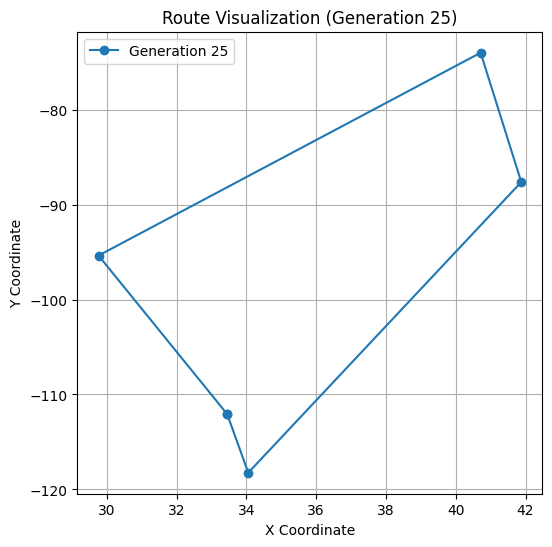

Generation 26: Best Fitness = 92.58519307559176
Generation 27: Best Fitness = 92.58519307559176
Generation 28: Best Fitness = 92.58519307559176
Generation 29: Best Fitness = 92.58519307559176
Generation 30: Best Fitness = 92.58519307559176
Generation 31: Best Fitness = 92.58519307559176
Generation 32: Best Fitness = 92.58519307559176
Generation 33: Best Fitness = 92.58519307559176
Generation 34: Best Fitness = 92.58519307559176
Generation 35: Best Fitness = 92.58519307559176
Generation 36: Best Fitness = 92.58519307559176
Generation 37: Best Fitness = 92.58519307559176
Generation 38: Best Fitness = 92.58519307559176
Generation 39: Best Fitness = 92.58519307559176
Generation 40: Best Fitness = 92.58519307559176
Generation 41: Best Fitness = 92.58519307559176
Generation 42: Best Fitness = 92.58519307559176
Generation 43: Best Fitness = 92.58519307559176
Generation 44: Best Fitness = 92.58519307559176
Generation 45: Best Fitness = 92.58519307559176
Generation 46: Best Fitness = 92.5851930

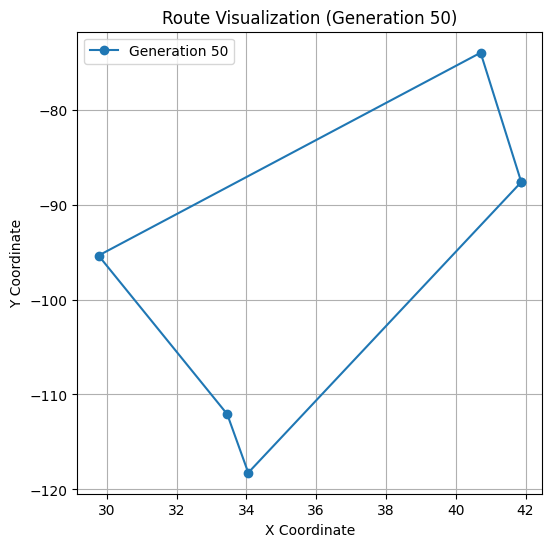

Generation 51: Best Fitness = 92.58519307559176
Generation 52: Best Fitness = 92.58519307559176
Generation 53: Best Fitness = 92.58519307559176
Generation 54: Best Fitness = 92.58519307559176
Generation 55: Best Fitness = 92.58519307559176
Generation 56: Best Fitness = 92.58519307559176
Generation 57: Best Fitness = 92.58519307559176
Generation 58: Best Fitness = 92.58519307559176
Generation 59: Best Fitness = 92.58519307559176
Generation 60: Best Fitness = 92.58519307559176
Generation 61: Best Fitness = 92.58519307559176
Generation 62: Best Fitness = 92.58519307559176
Generation 63: Best Fitness = 92.58519307559176
Generation 64: Best Fitness = 92.58519307559176
Generation 65: Best Fitness = 92.58519307559176
Generation 66: Best Fitness = 92.58519307559176
Generation 67: Best Fitness = 92.58519307559176
Generation 68: Best Fitness = 92.58519307559176
Generation 69: Best Fitness = 92.58519307559176
Generation 70: Best Fitness = 92.58519307559176
Generation 71: Best Fitness = 92.5851930

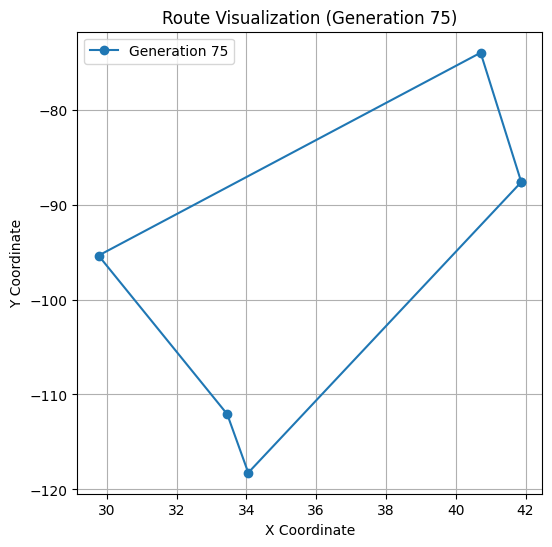

Generation 76: Best Fitness = 92.58519307559176
Generation 77: Best Fitness = 92.58519307559176
Generation 78: Best Fitness = 92.58519307559176
Generation 79: Best Fitness = 92.58519307559176
Generation 80: Best Fitness = 92.58519307559176
Generation 81: Best Fitness = 92.58519307559176
Generation 82: Best Fitness = 92.58519307559176
Generation 83: Best Fitness = 92.58519307559176
Generation 84: Best Fitness = 92.58519307559176
Generation 85: Best Fitness = 92.58519307559176
Generation 86: Best Fitness = 92.58519307559176
Generation 87: Best Fitness = 92.58519307559176
Generation 88: Best Fitness = 92.58519307559176
Generation 89: Best Fitness = 92.58519307559176
Generation 90: Best Fitness = 92.58519307559176
Generation 91: Best Fitness = 92.58519307559176
Generation 92: Best Fitness = 92.58519307559176
Generation 93: Best Fitness = 92.58519307559176
Generation 94: Best Fitness = 92.58519307559176
Generation 95: Best Fitness = 92.58519307559176
Generation 96: Best Fitness = 92.5851930

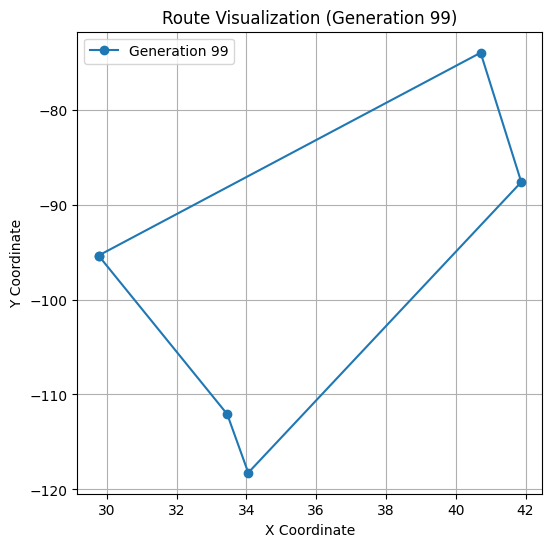

Best Route: [0, 2, 1, 4, 3]
Best Distance: 92.58519307559176


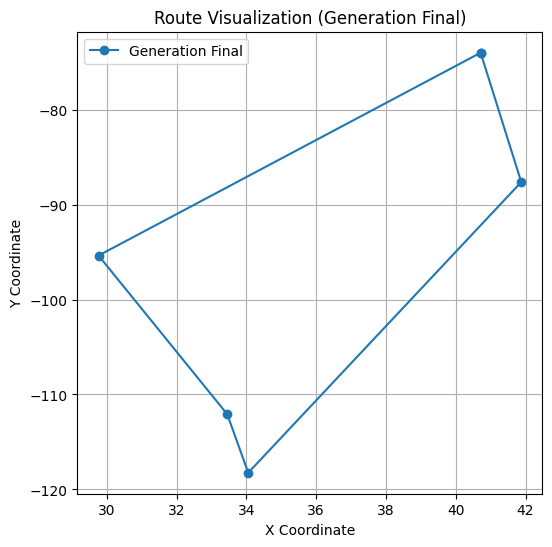

In [62]:
cities = [
    (40.7128, -74.0060),  # New York
    (34.0522, -118.2437),  # Los Angeles
    (41.8781, -87.6298),  # Chicago
    (29.7604, -95.3698),  # Houston
    (33.4484, -112.0740)  # Phoenix
]

# Run the Genetic Algorithm
best_route, best_distance = genetic_algorithm(cities, generations=100)
print("Best Route:", best_route)
print("Best Distance:", best_distance)
visualize_route(best_route, cities, "Final")

### test 2

Generation 0: Best Fitness = 57.442787353382215


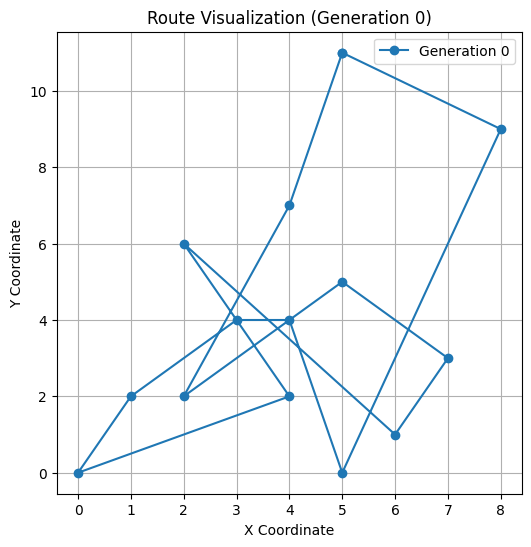

Generation 1: Best Fitness = 54.14268149018352
Generation 2: Best Fitness = 55.505373056472436
Generation 3: Best Fitness = 54.23821568731081
Generation 4: Best Fitness = 54.23821568731081
Generation 5: Best Fitness = 49.082545421172135
Generation 6: Best Fitness = 49.082545421172135
Generation 7: Best Fitness = 52.2423496274116
Generation 8: Best Fitness = 49.74874159472854
Generation 9: Best Fitness = 52.223956932607564
Generation 10: Best Fitness = 54.805229721578385
Generation 11: Best Fitness = 53.009840893701806
Generation 12: Best Fitness = 52.51123935145211
Generation 13: Best Fitness = 52.51123935145211
Generation 14: Best Fitness = 52.653549723955194
Generation 15: Best Fitness = 54.04568441158466
Generation 16: Best Fitness = 53.705650225132615
Generation 17: Best Fitness = 50.51775447168259
Generation 18: Best Fitness = 53.62173905597872
Generation 19: Best Fitness = 52.685600201812946
Generation 20: Best Fitness = 56.42220323798952
Generation 21: Best Fitness = 56.35058711

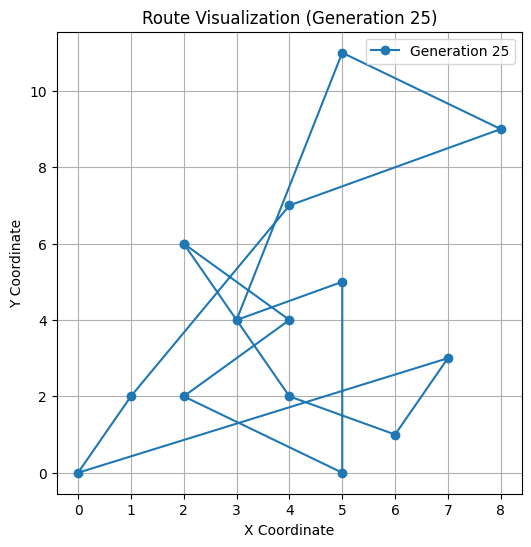

Generation 26: Best Fitness = 56.483335510408395
Generation 27: Best Fitness = 56.196896324645934
Generation 28: Best Fitness = 54.44023646234261
Generation 29: Best Fitness = 56.4478667968679
Generation 30: Best Fitness = 57.46910420251369
Generation 31: Best Fitness = 50.30700755741283
Generation 32: Best Fitness = 53.95020400843123
Generation 33: Best Fitness = 53.95020400843123
Generation 34: Best Fitness = 52.64601632965706
Generation 35: Best Fitness = 51.5367284058239
Generation 36: Best Fitness = 50.715200339713334
Generation 37: Best Fitness = 55.310115571314455
Generation 38: Best Fitness = 55.567428686376445
Generation 39: Best Fitness = 55.60273698373581
Generation 40: Best Fitness = 56.03455808472811
Generation 41: Best Fitness = 48.73634031184795
Generation 42: Best Fitness = 49.702965558451005
Generation 43: Best Fitness = 51.165766203423985
Generation 44: Best Fitness = 46.6570229173446
Generation 45: Best Fitness = 44.72151801959059
Generation 46: Best Fitness = 46.657

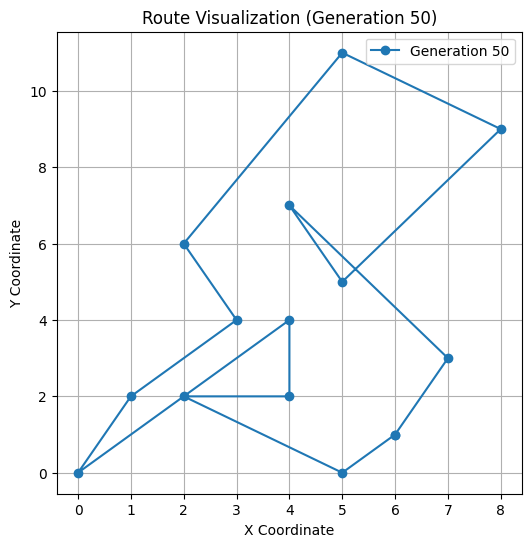

Generation 51: Best Fitness = 48.27864001444971
Generation 52: Best Fitness = 52.43341200645564
Generation 53: Best Fitness = 51.42857344348124
Generation 54: Best Fitness = 46.479594912427956
Generation 55: Best Fitness = 46.479594912427956
Generation 56: Best Fitness = 46.23874833516349
Generation 57: Best Fitness = 47.567585758573834
Generation 58: Best Fitness = 46.3240584096038
Generation 59: Best Fitness = 49.97579062702582
Generation 60: Best Fitness = 53.25624219036218
Generation 61: Best Fitness = 52.622342055237354
Generation 62: Best Fitness = 55.55443868886582
Generation 63: Best Fitness = 55.51932429172368
Generation 64: Best Fitness = 54.54441963343946
Generation 65: Best Fitness = 54.18483175247057
Generation 66: Best Fitness = 54.35058691897915
Generation 67: Best Fitness = 50.58795423047455
Generation 68: Best Fitness = 53.323735407485174
Generation 69: Best Fitness = 47.02356122475969
Generation 70: Best Fitness = 47.02356122475969
Generation 71: Best Fitness = 51.478

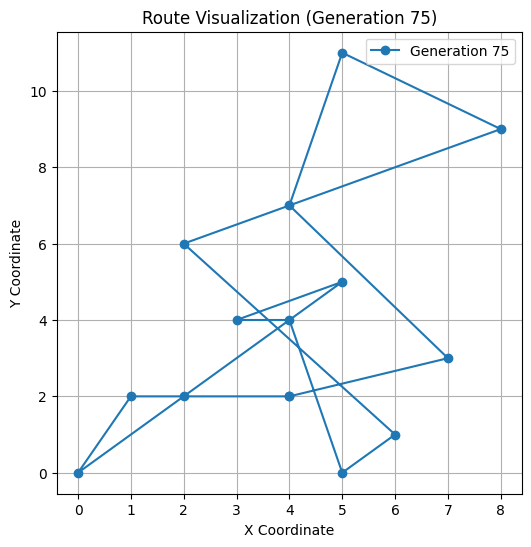

Generation 76: Best Fitness = 51.95477617175564
Generation 77: Best Fitness = 54.94820346213614
Generation 78: Best Fitness = 48.08348673621007
Generation 79: Best Fitness = 48.34085105376966
Generation 80: Best Fitness = 50.370286060540444
Generation 81: Best Fitness = 49.720936286433265
Generation 82: Best Fitness = 49.720936286433265
Generation 83: Best Fitness = 49.78333988308583
Generation 84: Best Fitness = 48.129310060301776
Generation 85: Best Fitness = 49.05727618065989
Generation 86: Best Fitness = 51.560239606029896
Generation 87: Best Fitness = 50.01874096739972
Generation 88: Best Fitness = 50.01874096739972
Generation 89: Best Fitness = 50.605215535771826
Generation 90: Best Fitness = 49.20576030377255
Generation 91: Best Fitness = 50.6620441822669
Generation 92: Best Fitness = 50.6620441822669
Generation 93: Best Fitness = 50.47582847798924
Generation 94: Best Fitness = 50.66204418226688
Generation 95: Best Fitness = 50.60924379845366
Generation 96: Best Fitness = 51.756

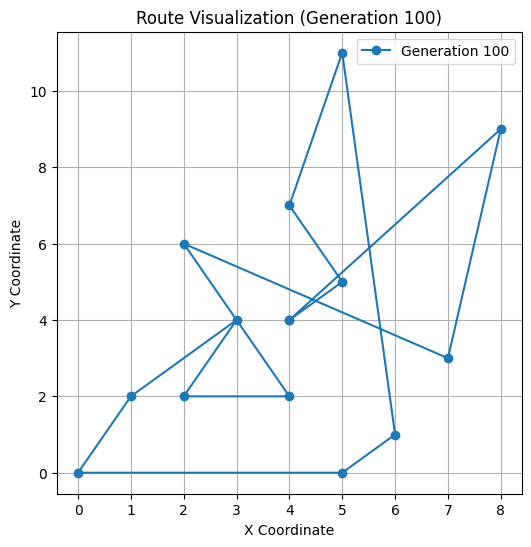

Generation 101: Best Fitness = 53.23756207940647
Generation 102: Best Fitness = 51.10401828471384
Generation 103: Best Fitness = 54.47968638962798
Generation 104: Best Fitness = 54.49409860392916
Generation 105: Best Fitness = 50.49864197057369
Generation 106: Best Fitness = 49.416811643146424
Generation 107: Best Fitness = 47.993058993296835
Generation 108: Best Fitness = 50.98393486437915
Generation 109: Best Fitness = 51.184240309097966
Generation 110: Best Fitness = 56.395541105545306
Generation 111: Best Fitness = 54.17520535523524
Generation 112: Best Fitness = 56.337159527207334
Generation 113: Best Fitness = 56.132899465096585
Generation 114: Best Fitness = 53.45142755384153
Generation 115: Best Fitness = 47.98664585027821
Generation 116: Best Fitness = 47.98664585027821
Generation 117: Best Fitness = 49.283588448344105
Generation 118: Best Fitness = 47.45077994589272
Generation 119: Best Fitness = 52.880621558525114
Generation 120: Best Fitness = 52.880621558525114
Generation 

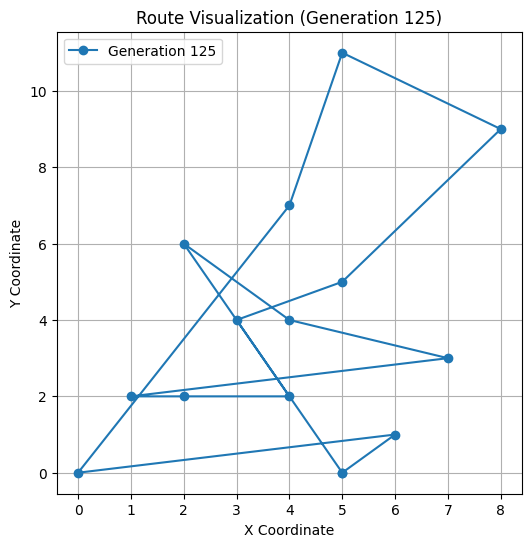

Generation 126: Best Fitness = 48.3376155048786
Generation 127: Best Fitness = 55.01208899141013
Generation 128: Best Fitness = 50.0034148473161
Generation 129: Best Fitness = 55.017336266975185
Generation 130: Best Fitness = 54.54099187812638
Generation 131: Best Fitness = 54.77926522901025
Generation 132: Best Fitness = 55.24352888103462
Generation 133: Best Fitness = 50.53814485605021
Generation 134: Best Fitness = 52.89324208280198
Generation 135: Best Fitness = 52.89324208280198
Generation 136: Best Fitness = 53.45990873986693
Generation 137: Best Fitness = 49.46343686560689
Generation 138: Best Fitness = 51.7113749074244
Generation 139: Best Fitness = 53.67862419480092
Generation 140: Best Fitness = 53.67862419480092
Generation 141: Best Fitness = 51.52118683013509
Generation 142: Best Fitness = 49.25972323526271
Generation 143: Best Fitness = 55.59223636986727
Generation 144: Best Fitness = 53.717298963511176
Generation 145: Best Fitness = 53.25878539416395
Generation 146: Best 

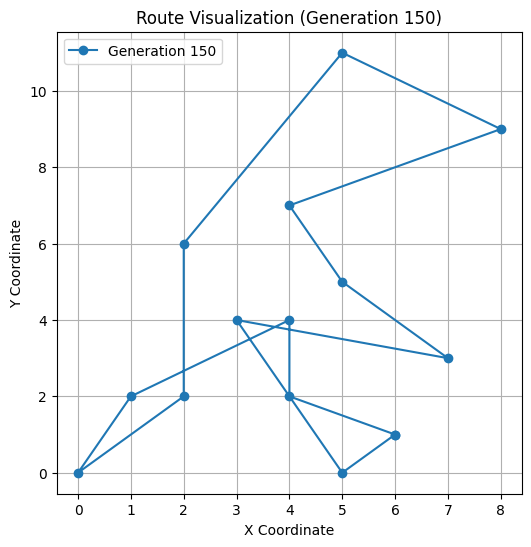

Generation 151: Best Fitness = 45.16394373780544
Generation 152: Best Fitness = 45.268299005347345
Generation 153: Best Fitness = 53.25615267114669
Generation 154: Best Fitness = 53.25615267114669
Generation 155: Best Fitness = 50.472793457509425
Generation 156: Best Fitness = 50.47279345750943
Generation 157: Best Fitness = 50.47279345750943
Generation 158: Best Fitness = 52.89430327154189
Generation 159: Best Fitness = 50.74841524571242
Generation 160: Best Fitness = 49.00222894163046
Generation 161: Best Fitness = 49.88970281079328
Generation 162: Best Fitness = 43.32219919594159
Generation 163: Best Fitness = 46.36289995453277
Generation 164: Best Fitness = 48.006608784786145
Generation 165: Best Fitness = 46.32625271222945
Generation 166: Best Fitness = 46.32625271222945
Generation 167: Best Fitness = 49.697502730356184
Generation 168: Best Fitness = 46.09413699542224
Generation 169: Best Fitness = 48.1510177735113
Generation 170: Best Fitness = 47.391967494958415
Generation 171: 

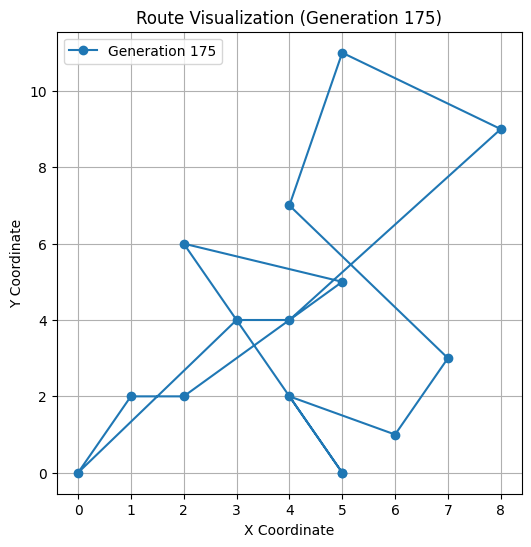

Generation 176: Best Fitness = 49.18917532830069
Generation 177: Best Fitness = 53.088670264912366
Generation 178: Best Fitness = 53.706972320354865
Generation 179: Best Fitness = 53.706972320354865
Generation 180: Best Fitness = 53.706972320354865
Generation 181: Best Fitness = 53.706972320354865
Generation 182: Best Fitness = 53.706972320354865
Generation 183: Best Fitness = 53.806067933561934
Generation 184: Best Fitness = 51.64747396127915
Generation 185: Best Fitness = 46.51633799441991
Generation 186: Best Fitness = 47.58068207027766
Generation 187: Best Fitness = 54.614245068952535
Generation 188: Best Fitness = 54.375548003944
Generation 189: Best Fitness = 54.43609948407922
Generation 190: Best Fitness = 48.504868698057706
Generation 191: Best Fitness = 54.026937099979754
Generation 192: Best Fitness = 53.993797278976416
Generation 193: Best Fitness = 54.10365650298476
Generation 194: Best Fitness = 54.10365650298476
Generation 195: Best Fitness = 54.793798208153554
Generation

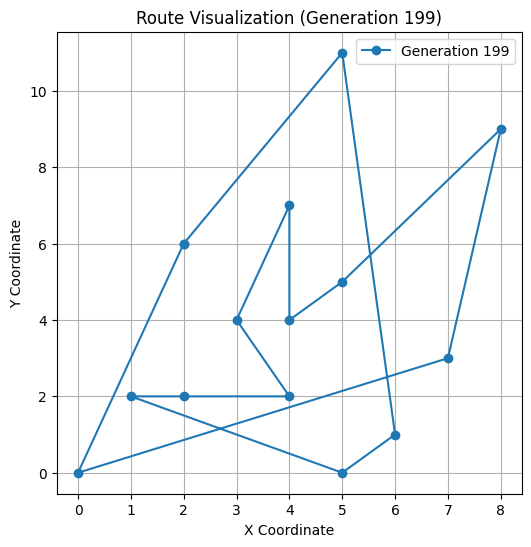

Best Route: [10, 7, 4, 8, 1, 0, 9, 12, 3, 11, 2, 6, 5, 13]
Best Distance: 43.32219919594159


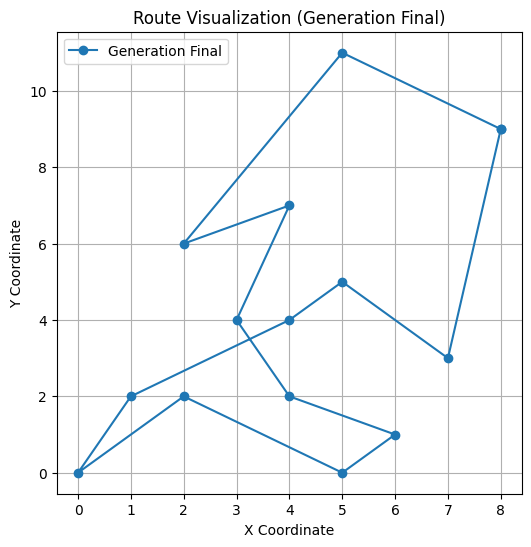

In [63]:
cities = [
    (0, 0), (1, 2), (3, 4), (6, 1), (5, 5), (2, 6), (4, 7), (7, 3), (4, 4), (2, 2), (8, 9), (4, 2), (5, 0), (5, 11),
]

# Run the Genetic Algorithm
best_route, best_distance = genetic_algorithm(cities, generations=200)
print("Best Route:", best_route)
print("Best Distance:", best_distance)
visualize_route(best_route, cities, "Final")

### test 3

Generation 0: Best Fitness = 1039.5561606659896


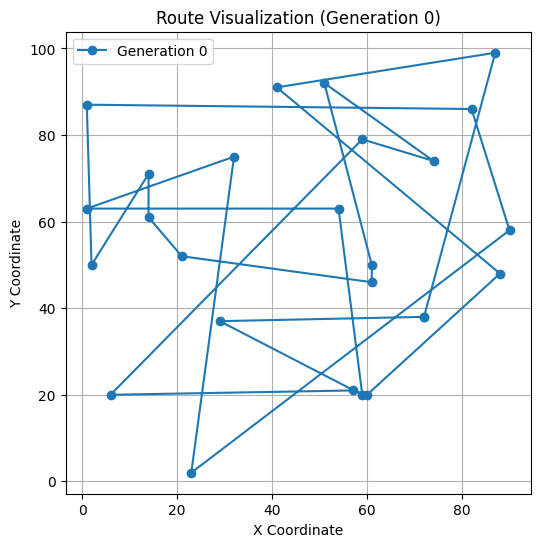

Generation 1: Best Fitness = 917.5844452946499
Generation 2: Best Fitness = 980.9087033726428
Generation 3: Best Fitness = 951.2364156440201
Generation 4: Best Fitness = 967.4941209669383
Generation 5: Best Fitness = 975.7637246266977
Generation 6: Best Fitness = 1002.3734739215811
Generation 7: Best Fitness = 1001.9278311627473
Generation 8: Best Fitness = 966.4475142671695
Generation 9: Best Fitness = 991.3203539768732
Generation 10: Best Fitness = 995.2165940192141
Generation 11: Best Fitness = 978.6562469935725
Generation 12: Best Fitness = 1021.9096740315015
Generation 13: Best Fitness = 1022.4328832413047
Generation 14: Best Fitness = 1090.8198043706739
Generation 15: Best Fitness = 1011.5992401248712
Generation 16: Best Fitness = 1011.5992401248712
Generation 17: Best Fitness = 1011.5992401248712
Generation 18: Best Fitness = 958.044902890339
Generation 19: Best Fitness = 964.373797398636
Generation 20: Best Fitness = 924.0025128342913
Generation 21: Best Fitness = 982.447996555

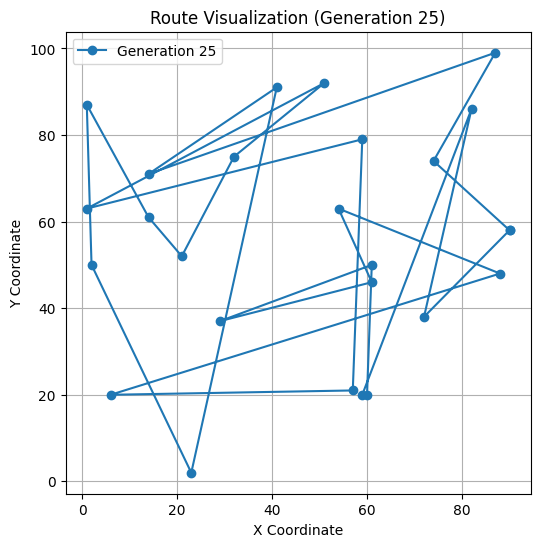

Generation 26: Best Fitness = 1009.2263480100737
Generation 27: Best Fitness = 1026.4008389021958
Generation 28: Best Fitness = 1028.6635163247483
Generation 29: Best Fitness = 1023.0466822998786
Generation 30: Best Fitness = 995.4192539496452
Generation 31: Best Fitness = 966.4694790382713
Generation 32: Best Fitness = 1019.4048464596299
Generation 33: Best Fitness = 931.941703404548
Generation 34: Best Fitness = 936.672928555396
Generation 35: Best Fitness = 936.672928555396
Generation 36: Best Fitness = 1058.3013123065891
Generation 37: Best Fitness = 1075.4266576823884
Generation 38: Best Fitness = 1011.7995305885057
Generation 39: Best Fitness = 1066.8081926378927
Generation 40: Best Fitness = 1007.7734875115007
Generation 41: Best Fitness = 1006.9384250149059
Generation 42: Best Fitness = 1019.6059261069165
Generation 43: Best Fitness = 1009.1182273938697
Generation 44: Best Fitness = 974.8935184781983
Generation 45: Best Fitness = 958.8276796460882
Generation 46: Best Fitness = 

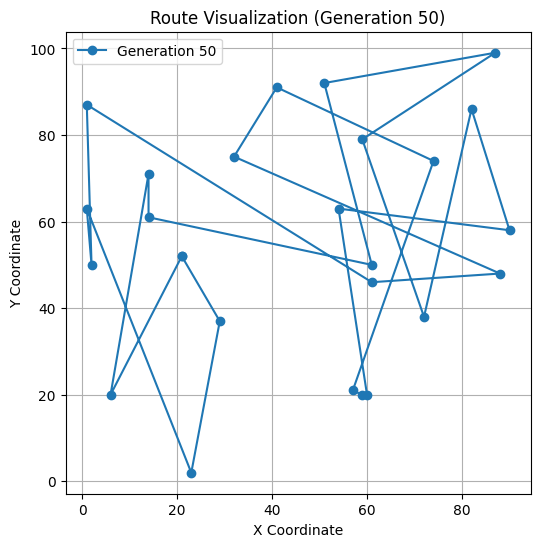

Generation 51: Best Fitness = 904.1140990345515
Generation 52: Best Fitness = 950.4672135078205
Generation 53: Best Fitness = 921.9953344120072
Generation 54: Best Fitness = 824.5155108458209
Generation 55: Best Fitness = 1000.3544614513108
Generation 56: Best Fitness = 921.0016052780314
Generation 57: Best Fitness = 1064.4533653953276
Generation 58: Best Fitness = 1017.6226406476347
Generation 59: Best Fitness = 993.4822439556216
Generation 60: Best Fitness = 1021.7727543649314
Generation 61: Best Fitness = 1050.4003248562935
Generation 62: Best Fitness = 1047.0029437188368
Generation 63: Best Fitness = 1065.8684036599816
Generation 64: Best Fitness = 1042.6969835215868
Generation 65: Best Fitness = 996.4038307648685
Generation 66: Best Fitness = 981.8837143877444
Generation 67: Best Fitness = 944.8420570636266
Generation 68: Best Fitness = 943.3298394014976
Generation 69: Best Fitness = 965.9563352578986
Generation 70: Best Fitness = 943.7210072128335
Generation 71: Best Fitness = 94

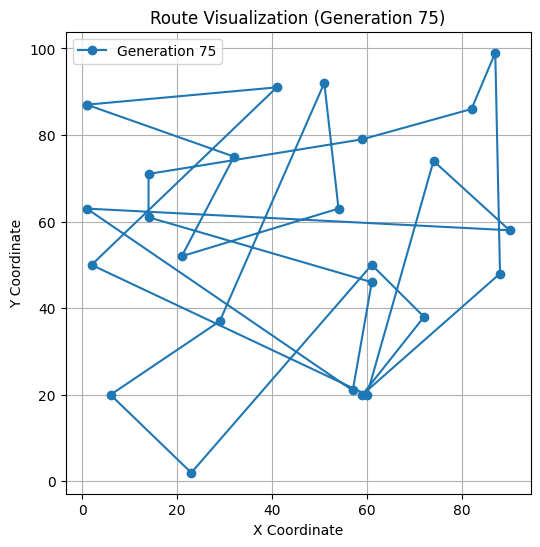

Generation 76: Best Fitness = 908.8463543401683
Generation 77: Best Fitness = 990.1075798523834
Generation 78: Best Fitness = 990.1075798523834
Generation 79: Best Fitness = 980.4062851760702
Generation 80: Best Fitness = 934.9988858936373
Generation 81: Best Fitness = 934.9988858936373
Generation 82: Best Fitness = 927.2086925560436
Generation 83: Best Fitness = 1069.9527512507557
Generation 84: Best Fitness = 1036.4751600996085
Generation 85: Best Fitness = 1019.5379542490161
Generation 86: Best Fitness = 1035.438719139443
Generation 87: Best Fitness = 1005.1697791111956
Generation 88: Best Fitness = 1004.6574186302009
Generation 89: Best Fitness = 1035.438719139443
Generation 90: Best Fitness = 1046.961107668064
Generation 91: Best Fitness = 1015.1188193173812
Generation 92: Best Fitness = 1049.0305562856843
Generation 93: Best Fitness = 1023.4201881691263
Generation 94: Best Fitness = 1015.7285848414757
Generation 95: Best Fitness = 1055.8472395727113
Generation 96: Best Fitness = 

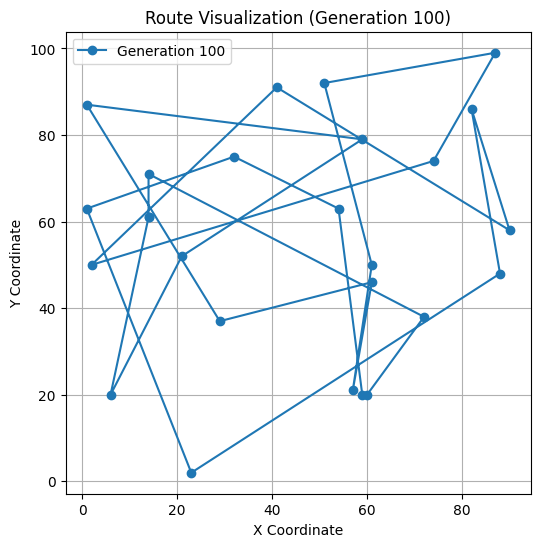

Generation 101: Best Fitness = 1010.0089580008427
Generation 102: Best Fitness = 947.9922521794456
Generation 103: Best Fitness = 1048.8182055800742
Generation 104: Best Fitness = 1048.8182055800742
Generation 105: Best Fitness = 1036.7379451924182
Generation 106: Best Fitness = 1068.2037553012276
Generation 107: Best Fitness = 1034.0391763669431
Generation 108: Best Fitness = 1025.9890831074383
Generation 109: Best Fitness = 997.2237260242249
Generation 110: Best Fitness = 1012.6879621353777
Generation 111: Best Fitness = 994.31864646782
Generation 112: Best Fitness = 965.6049515349943
Generation 113: Best Fitness = 982.3610142047742
Generation 114: Best Fitness = 923.8522400206299
Generation 115: Best Fitness = 1015.2556639340008
Generation 116: Best Fitness = 1037.5332161652332
Generation 117: Best Fitness = 1019.2824643905757
Generation 118: Best Fitness = 960.6164269644645
Generation 119: Best Fitness = 984.7303316027153
Generation 120: Best Fitness = 964.1803703292231
Generation 

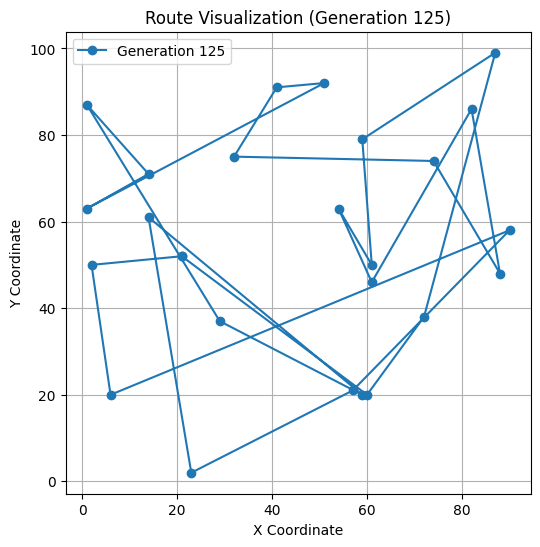

Generation 126: Best Fitness = 973.0979803631922
Generation 127: Best Fitness = 966.442862618492
Generation 128: Best Fitness = 989.7129851760776
Generation 129: Best Fitness = 964.079539755667
Generation 130: Best Fitness = 963.5259195572003
Generation 131: Best Fitness = 962.7657452769474
Generation 132: Best Fitness = 969.2105721663975
Generation 133: Best Fitness = 963.256651302522
Generation 134: Best Fitness = 1023.2377882459288
Generation 135: Best Fitness = 1062.328242870384
Generation 136: Best Fitness = 1086.758674079
Generation 137: Best Fitness = 1098.5278844448378
Generation 138: Best Fitness = 1075.6959444848162
Generation 139: Best Fitness = 1042.9062378540982
Generation 140: Best Fitness = 1018.4145508478299
Generation 141: Best Fitness = 1028.884318889335
Generation 142: Best Fitness = 1009.2148154834821
Generation 143: Best Fitness = 1037.014009134691
Generation 144: Best Fitness = 966.7087380553
Generation 145: Best Fitness = 958.8764273354518
Generation 146: Best Fi

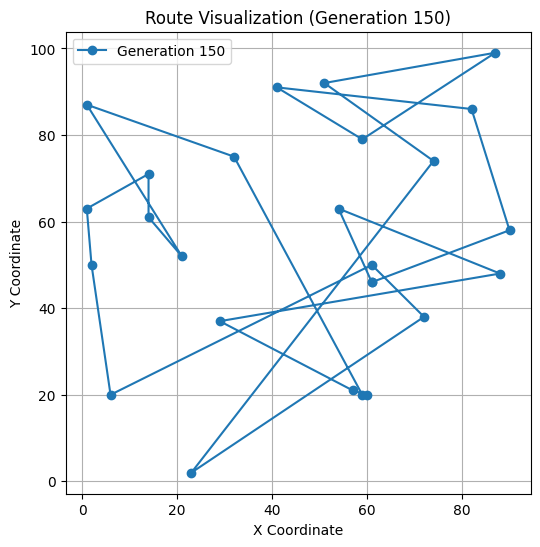

Generation 151: Best Fitness = 830.0373887866841
Generation 152: Best Fitness = 854.7521283026838
Generation 153: Best Fitness = 916.1839859903994
Generation 154: Best Fitness = 916.1839859903994
Generation 155: Best Fitness = 1007.4274742654027
Generation 156: Best Fitness = 1011.9244944333818
Generation 157: Best Fitness = 1031.939594682948
Generation 158: Best Fitness = 1022.5394592952756
Generation 159: Best Fitness = 1016.3322202647093
Generation 160: Best Fitness = 950.734721471318
Generation 161: Best Fitness = 1025.6198783177917
Generation 162: Best Fitness = 929.9878477529503
Generation 163: Best Fitness = 1057.794289979725
Generation 164: Best Fitness = 1047.4755865046022
Generation 165: Best Fitness = 1007.4260270243062
Generation 166: Best Fitness = 989.5567846678722
Generation 167: Best Fitness = 984.678390315622
Generation 168: Best Fitness = 1022.2593182980363
Generation 169: Best Fitness = 1026.4148393922674
Generation 170: Best Fitness = 1031.5379994995035
Generation 1

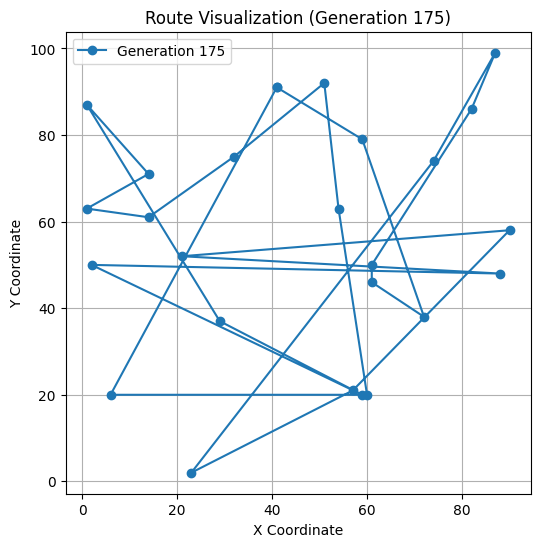

Generation 176: Best Fitness = 982.5539760030234
Generation 177: Best Fitness = 923.1125140073957
Generation 178: Best Fitness = 934.4749898690169
Generation 179: Best Fitness = 1049.910190176244
Generation 180: Best Fitness = 1009.285953042741
Generation 181: Best Fitness = 1006.6874232646906
Generation 182: Best Fitness = 1030.478361057238
Generation 183: Best Fitness = 996.6303710146211
Generation 184: Best Fitness = 1031.09574384838
Generation 185: Best Fitness = 1011.4585260079479
Generation 186: Best Fitness = 1011.4585260079479
Generation 187: Best Fitness = 965.6746563853321
Generation 188: Best Fitness = 1022.3328748560841
Generation 189: Best Fitness = 1003.8514224964672
Generation 190: Best Fitness = 1029.5177961196234
Generation 191: Best Fitness = 999.1086166140474
Generation 192: Best Fitness = 939.084292899511
Generation 193: Best Fitness = 939.084292899511
Generation 194: Best Fitness = 990.9569437130785
Generation 195: Best Fitness = 899.4511612674006
Generation 196: B

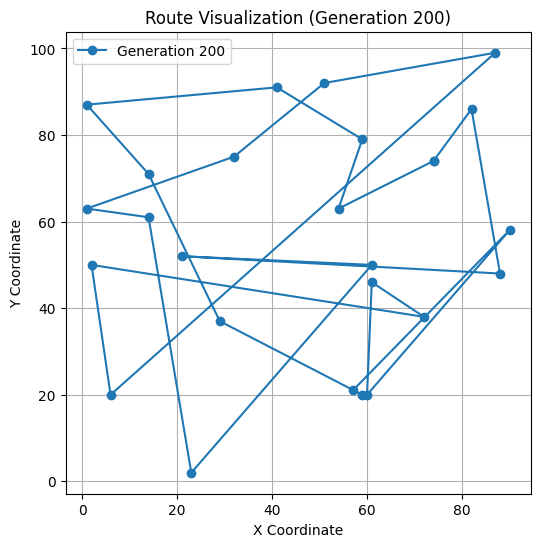

Generation 201: Best Fitness = 921.1462028084835
Generation 202: Best Fitness = 955.9090124214997
Generation 203: Best Fitness = 988.0272711126113
Generation 204: Best Fitness = 988.0272711126113
Generation 205: Best Fitness = 974.4369152480683
Generation 206: Best Fitness = 974.4369152480683
Generation 207: Best Fitness = 909.4008898927111
Generation 208: Best Fitness = 995.1425689624599
Generation 209: Best Fitness = 1047.0369828615756
Generation 210: Best Fitness = 1019.755209961769
Generation 211: Best Fitness = 997.2906058481623
Generation 212: Best Fitness = 997.2906058481623
Generation 213: Best Fitness = 937.4644715631792
Generation 214: Best Fitness = 955.353770240865
Generation 215: Best Fitness = 1039.9503527621407
Generation 216: Best Fitness = 1004.5971303049424
Generation 217: Best Fitness = 965.7890270919601
Generation 218: Best Fitness = 949.9711401105643
Generation 219: Best Fitness = 946.7879001778657
Generation 220: Best Fitness = 967.8187695366208
Generation 221: Be

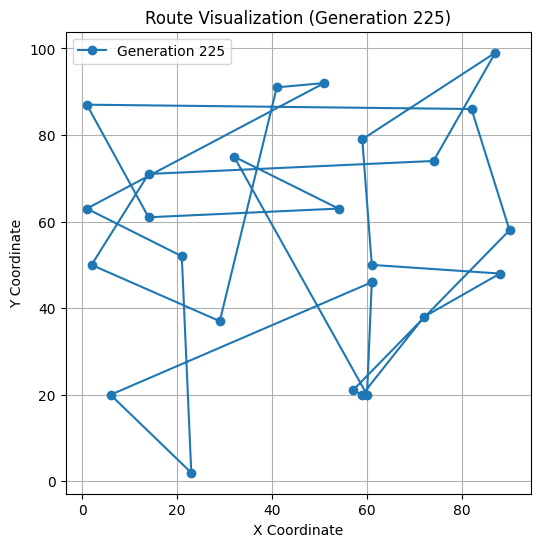

Generation 226: Best Fitness = 899.5147216159695
Generation 227: Best Fitness = 894.8641836474362
Generation 228: Best Fitness = 843.187629910474
Generation 229: Best Fitness = 939.0895596296219
Generation 230: Best Fitness = 978.8648232568299
Generation 231: Best Fitness = 993.7095897153229
Generation 232: Best Fitness = 1040.6679307850338
Generation 233: Best Fitness = 1040.6679307850338
Generation 234: Best Fitness = 1069.6016435562756
Generation 235: Best Fitness = 1051.9022105529834
Generation 236: Best Fitness = 1050.2252712022935
Generation 237: Best Fitness = 956.0196033907861
Generation 238: Best Fitness = 923.929125299147
Generation 239: Best Fitness = 918.1331474511111
Generation 240: Best Fitness = 918.9606812109981
Generation 241: Best Fitness = 899.8378332219172
Generation 242: Best Fitness = 890.9225868654592
Generation 243: Best Fitness = 890.0912531561379
Generation 244: Best Fitness = 916.5368210518094
Generation 245: Best Fitness = 916.5368210518094
Generation 246: B

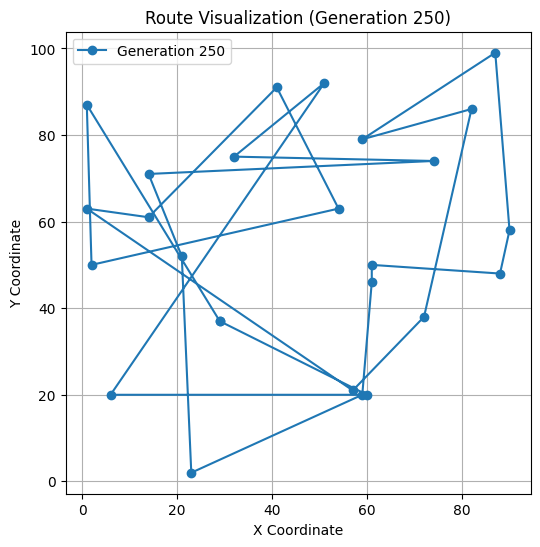

Generation 251: Best Fitness = 938.4609148688211
Generation 252: Best Fitness = 938.4609148688211
Generation 253: Best Fitness = 989.9015265793806
Generation 254: Best Fitness = 1010.8499559892168
Generation 255: Best Fitness = 951.3822054858524
Generation 256: Best Fitness = 912.4377770365654
Generation 257: Best Fitness = 912.4377770365654
Generation 258: Best Fitness = 912.4377770365654
Generation 259: Best Fitness = 1005.7063641889536
Generation 260: Best Fitness = 1052.8849132538182
Generation 261: Best Fitness = 1015.6975141726658
Generation 262: Best Fitness = 1062.1545820563695
Generation 263: Best Fitness = 1076.622977642343
Generation 264: Best Fitness = 1016.8739764767175
Generation 265: Best Fitness = 1057.6502268604527
Generation 266: Best Fitness = 1040.8659842264767
Generation 267: Best Fitness = 1023.827455612742
Generation 268: Best Fitness = 959.7186062732491
Generation 269: Best Fitness = 1027.1464490087055
Generation 270: Best Fitness = 1010.6016478078417
Generation

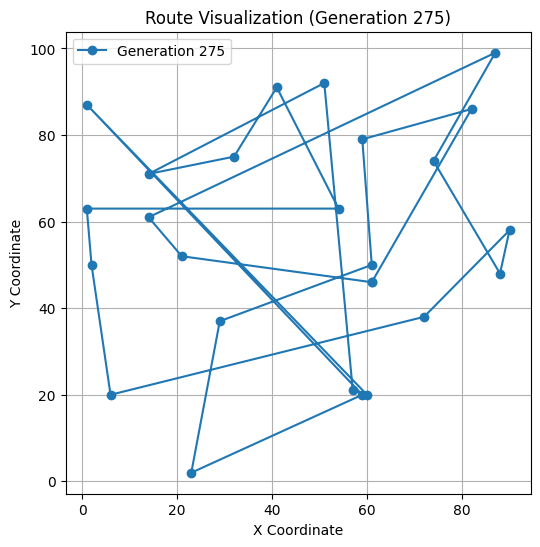

Generation 276: Best Fitness = 989.0418812651108
Generation 277: Best Fitness = 906.9432690296698
Generation 278: Best Fitness = 1054.9369451210862
Generation 279: Best Fitness = 1047.7233299036573
Generation 280: Best Fitness = 974.9897426982061
Generation 281: Best Fitness = 1021.558610127493
Generation 282: Best Fitness = 984.5222089872238
Generation 283: Best Fitness = 1008.4241633430055
Generation 284: Best Fitness = 993.1288407171835
Generation 285: Best Fitness = 993.1288407171835
Generation 286: Best Fitness = 972.0704642614377
Generation 287: Best Fitness = 863.1512244384741
Generation 288: Best Fitness = 925.8914543274811
Generation 289: Best Fitness = 895.9312969685172
Generation 290: Best Fitness = 921.9658508538429
Generation 291: Best Fitness = 959.9392558383713
Generation 292: Best Fitness = 963.814618015032
Generation 293: Best Fitness = 899.366272164452
Generation 294: Best Fitness = 1006.9223244150903
Generation 295: Best Fitness = 999.0813502292616
Generation 296: Be

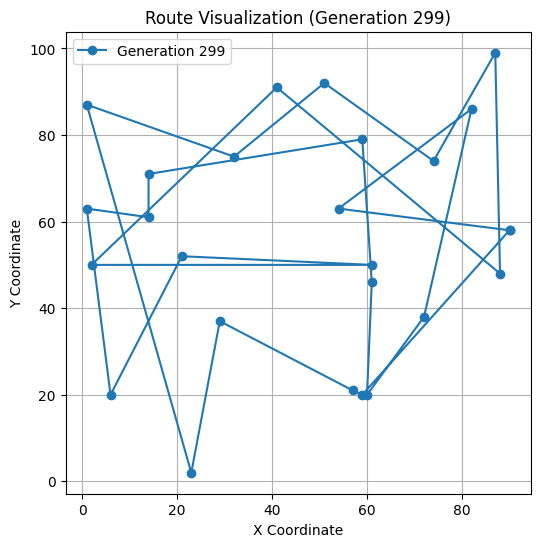

Best Route: [19, 15, 3, 16, 17, 5, 0, 4, 6, 24, 20, 23, 22, 10, 1, 18, 7, 8, 12, 11, 2, 13, 9, 14, 21]
Best Distance: 818.4634345625129


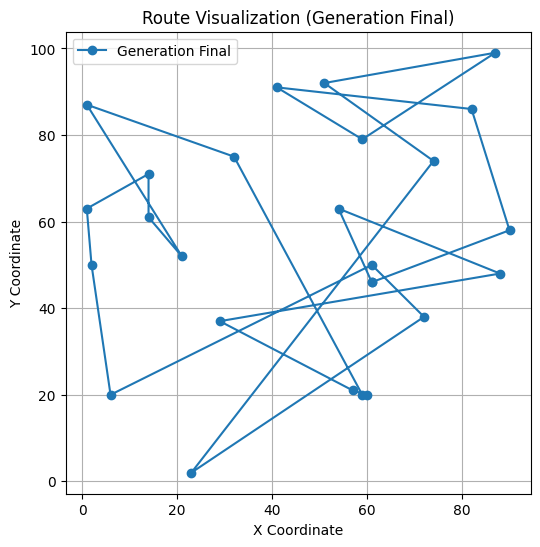

In [67]:
np.random.seed(42)  # For reproducibility
cities = [(np.random.randint(0, 100), np.random.randint(0, 100)) for _ in range(25)]

# Run the Genetic Algorithm
best_route, best_distance = genetic_algorithm(cities, generations=300)
print("Best Route:", best_route)
print("Best Distance:", best_distance)
visualize_route(best_route, cities, "Final")

## Analysis

Test with various mutation rates, population sizes, and generations to analyze the impact on results. Then analyze and express the effect of each parameter.

The codes provided below have tested multiple cases. According to the following case results, in the `first` example where there are only 5 cities and the state space is small, even with less population and generations, the algorithm can find the optimal solution and there is no differnece between the results. In the `second` example not all cases have been able to reach the optimal solution. The `population_size` seems the most important factor as with larger values it can explore the state space better. The `mutation_rate` with small value doesnot seem to be suitable. The `generations` parameter also has an impact on the results where the mutation rate is small, the larger values of it could be helpful to reach a better solution. In the `third` example, generally speaking `population_size` seems to be very affective again, where higher the values, the better the results. Also `mutation_rate` with small values seems to be more effective, however the large values have produced acceptable results but mediums have failed. The `generations` parameter also has an impact on the results where usually the larger the better, however this parameter is not very obviously effective as the other two parameters.

By `optimal solution`, I meant the best found solution accross all the cases. The `optimal solution` is the one with the smallest distance.

In [9]:
generations = [10, 100, 150, 500]
mutation_rates = [0.001, 0.01, 0.1]
population_sizes = [10, 50, 200]

#### First

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


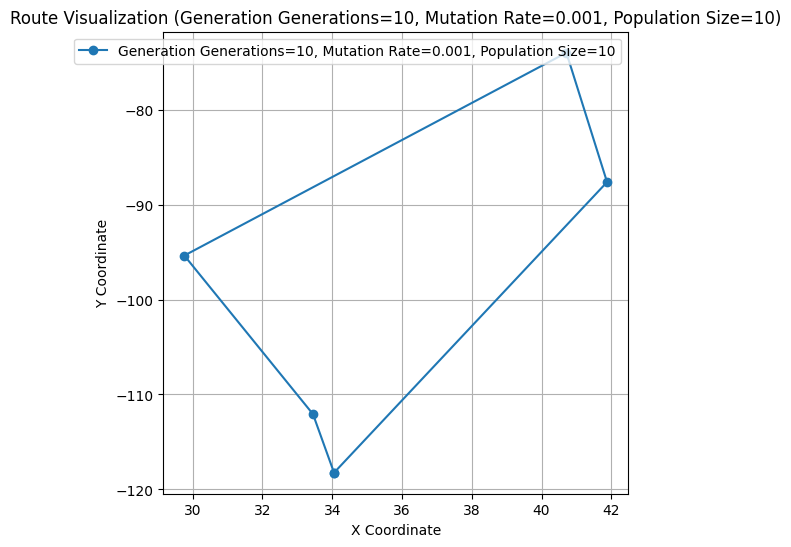

Best Route: [2, 1, 4, 3, 0]
Best Distance: 92.58519307559176


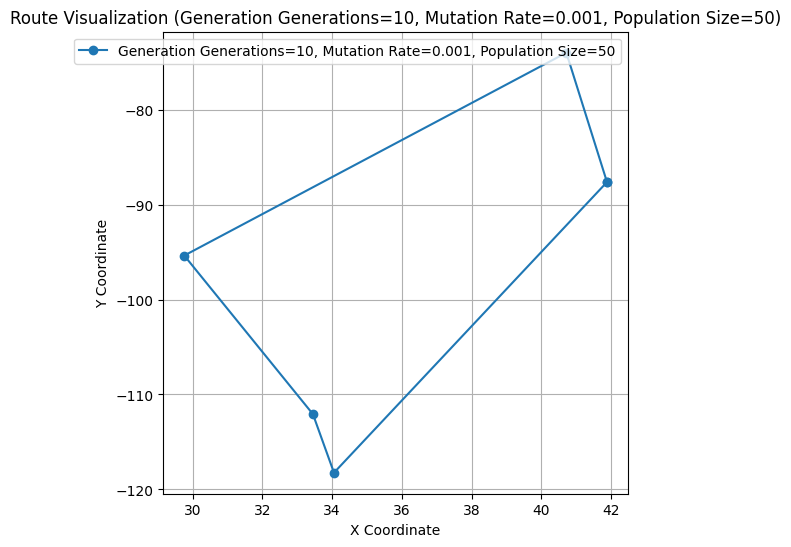

Best Route: [2, 0, 3, 4, 1]
Best Distance: 92.58519307559176


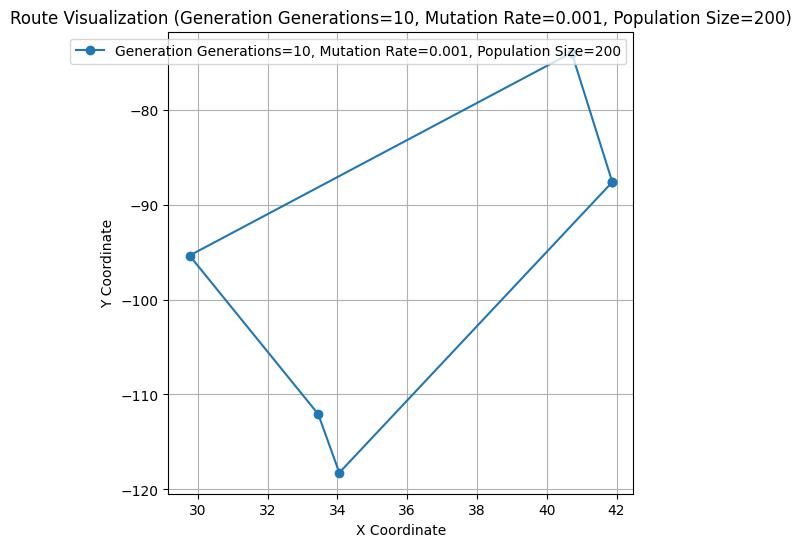

Best Route: [2, 0, 3, 4, 1]
Best Distance: 92.58519307559176


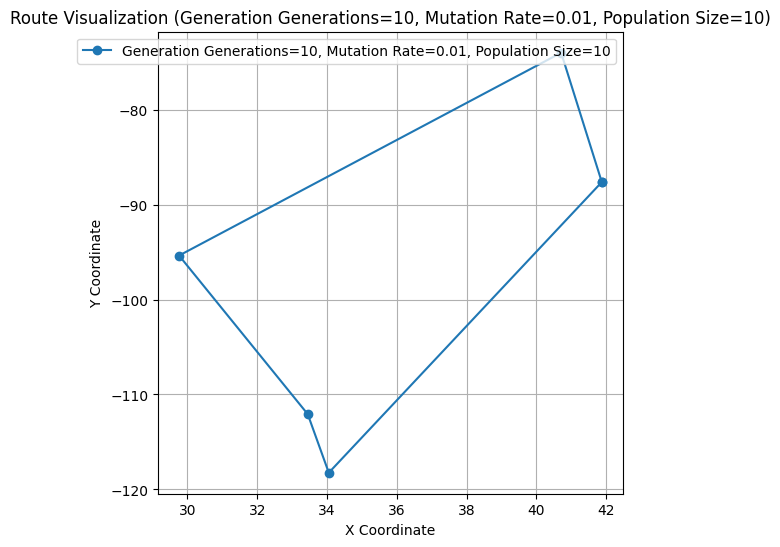

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


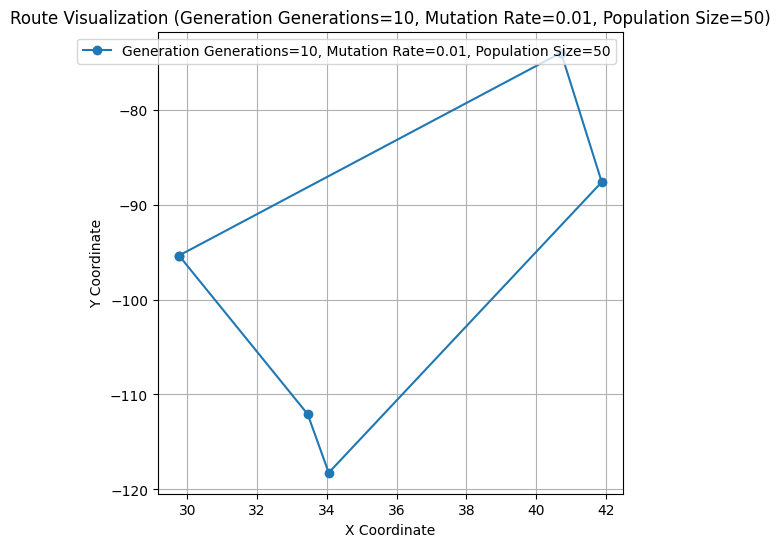

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


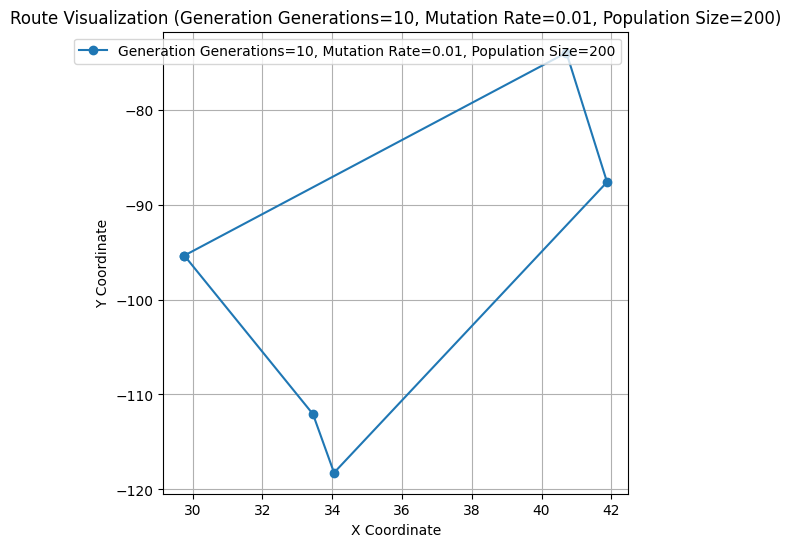

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


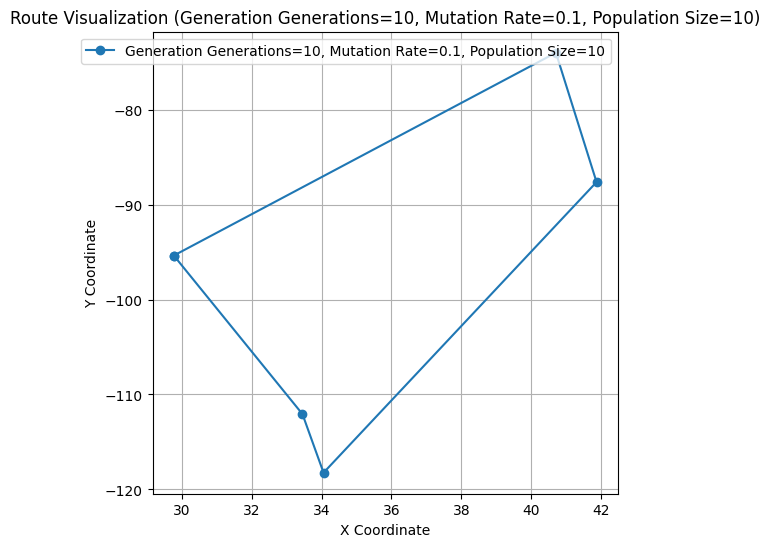

Best Route: [2, 0, 3, 4, 1]
Best Distance: 92.58519307559176


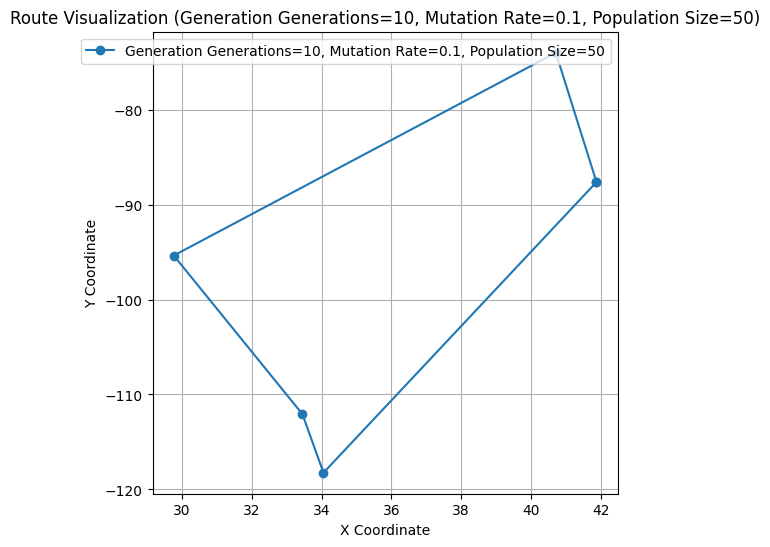

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


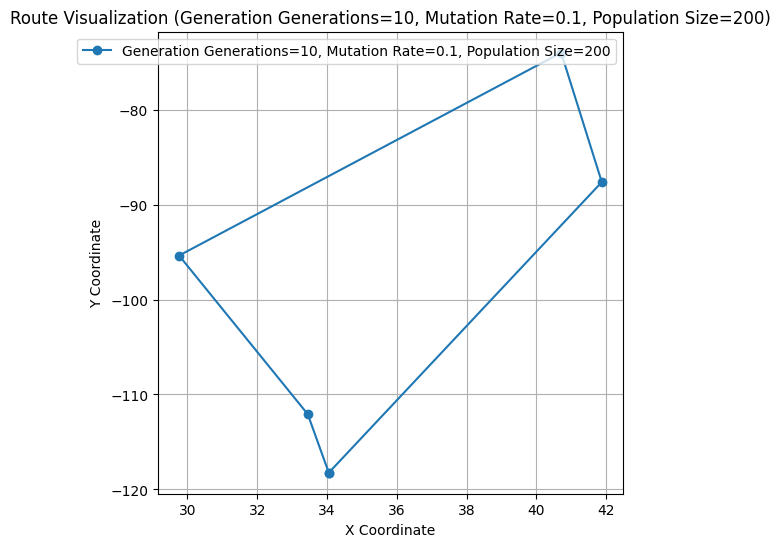

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


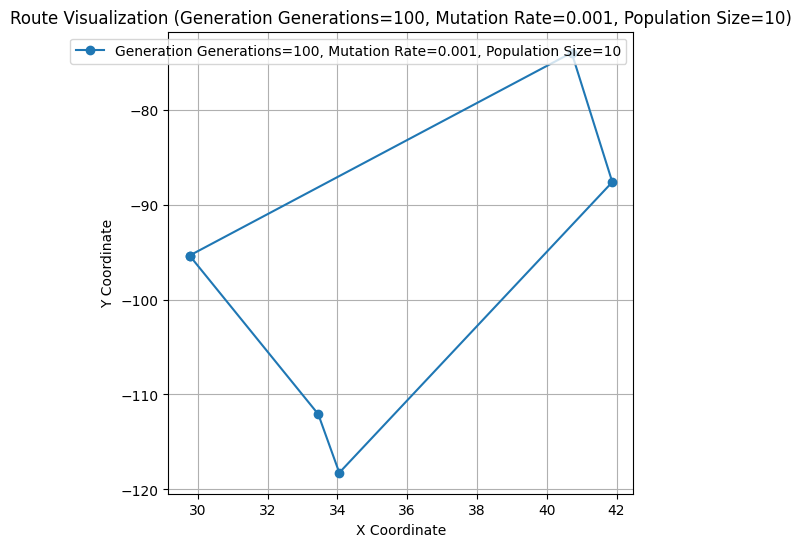

Best Route: [2, 1, 4, 3, 0]
Best Distance: 92.58519307559176


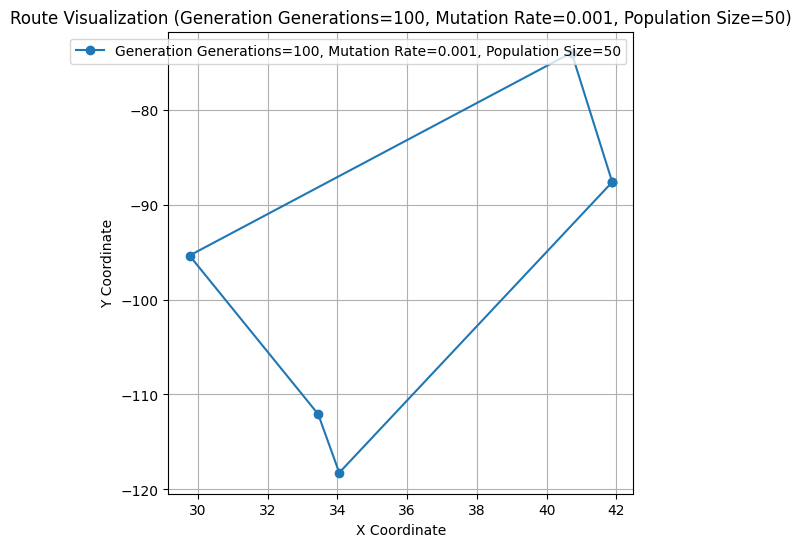

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


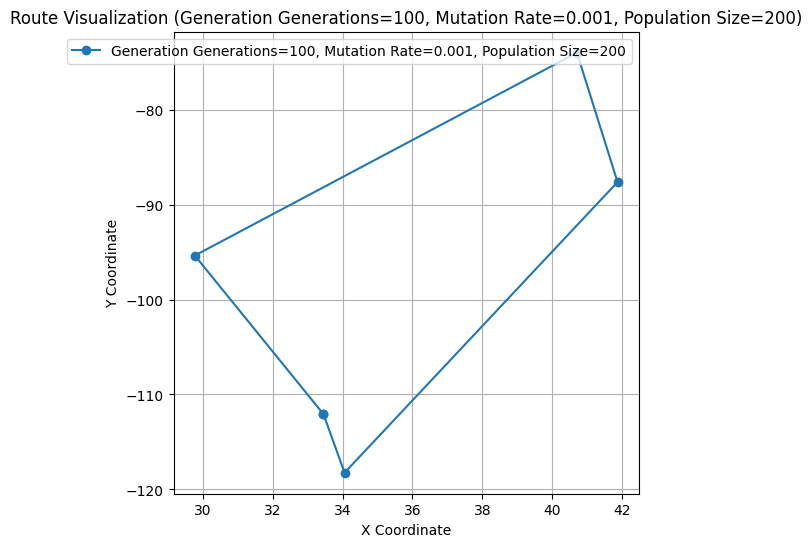

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


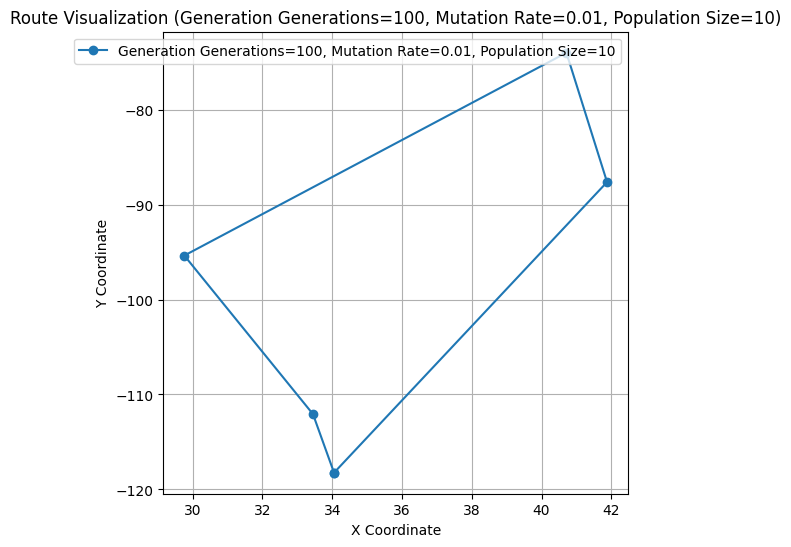

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


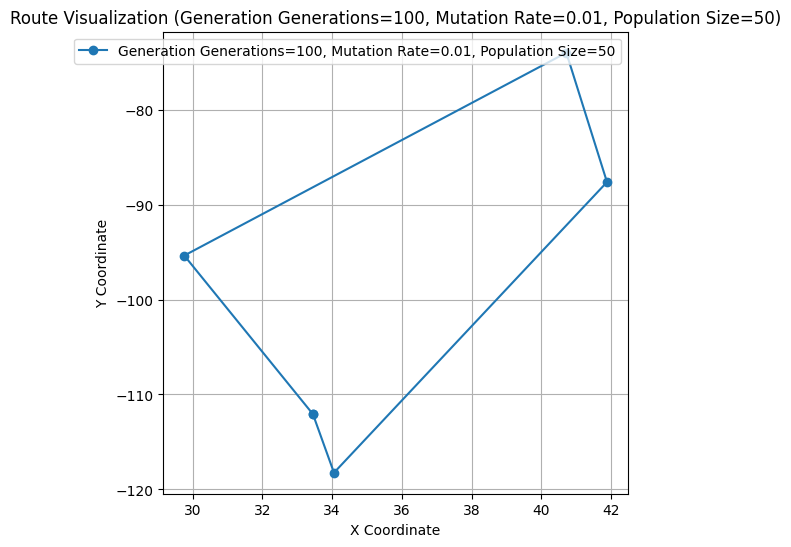

Best Route: [2, 1, 4, 3, 0]
Best Distance: 92.58519307559176


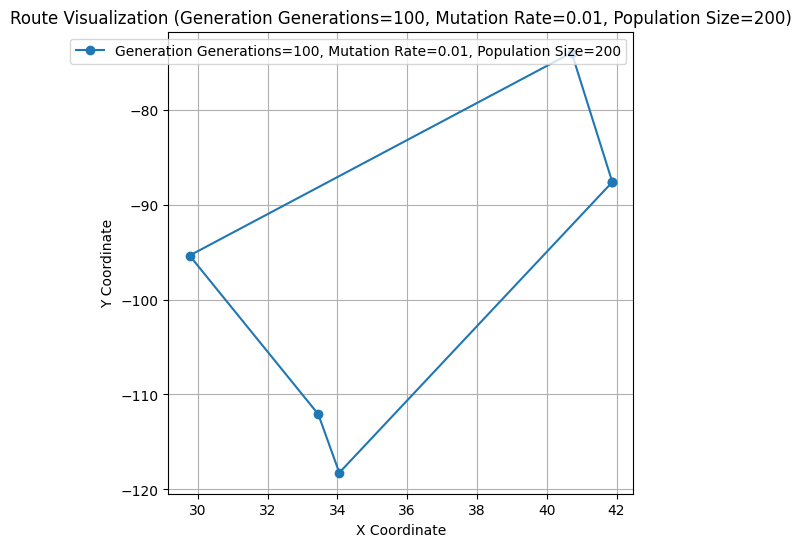

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


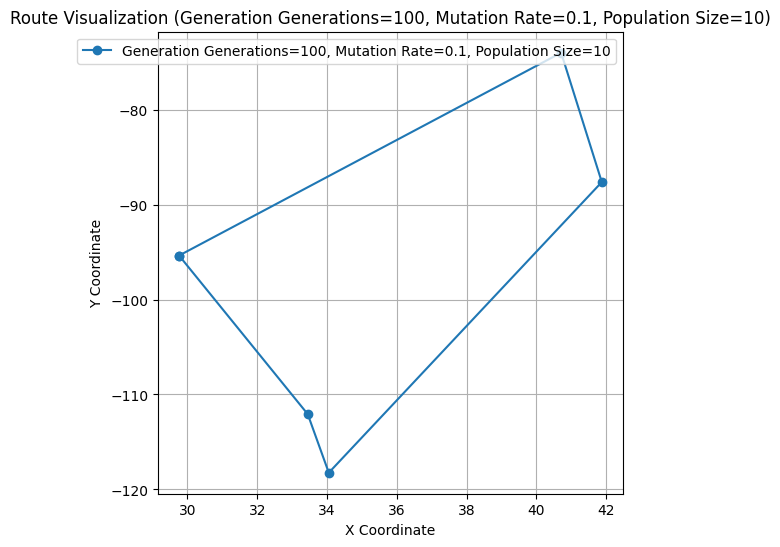

Best Route: [2, 0, 3, 4, 1]
Best Distance: 92.58519307559176


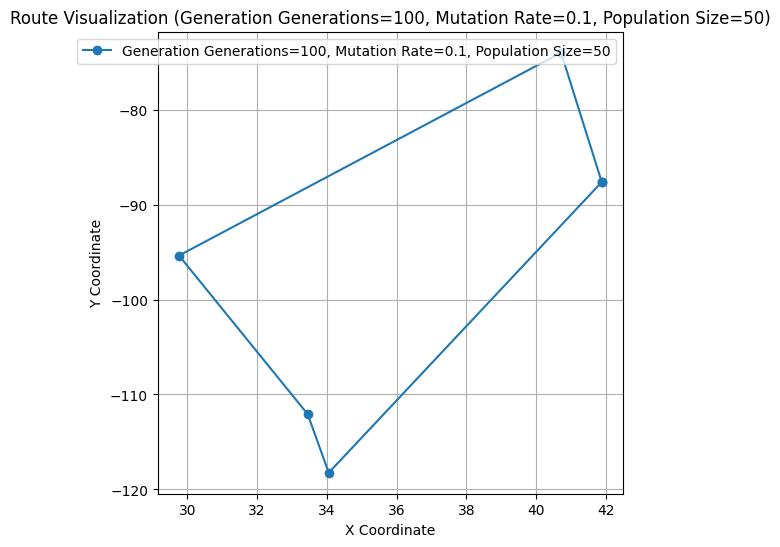

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


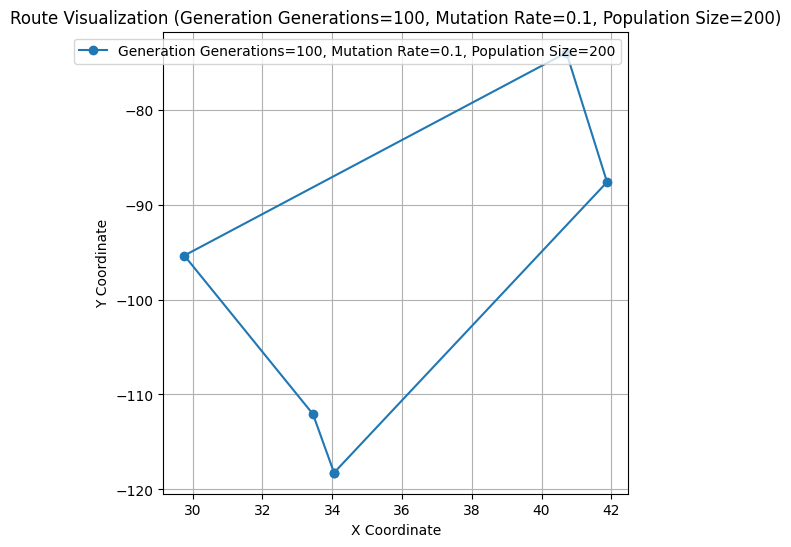

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


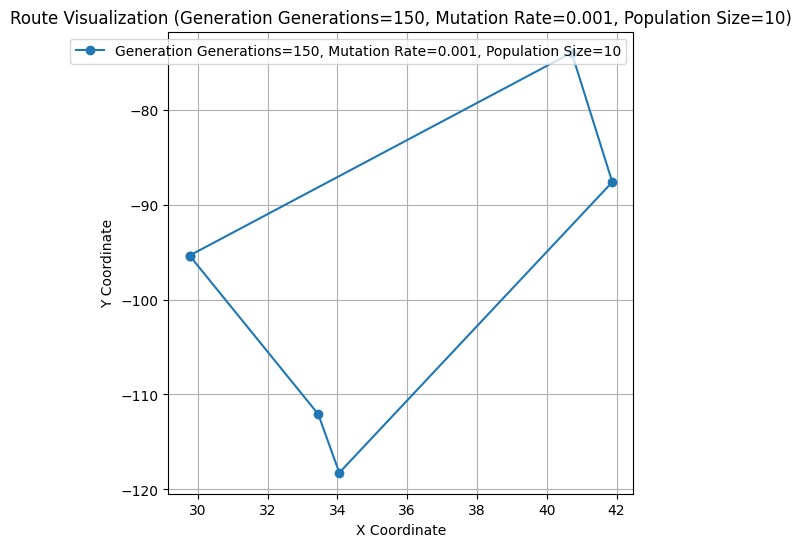

Best Route: [0, 2, 1, 4, 3]
Best Distance: 92.58519307559176


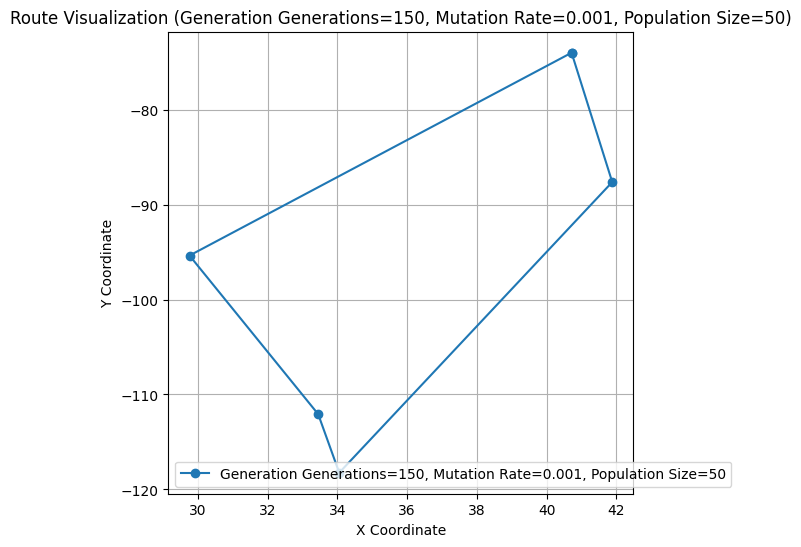

Best Route: [0, 2, 1, 4, 3]
Best Distance: 92.58519307559176


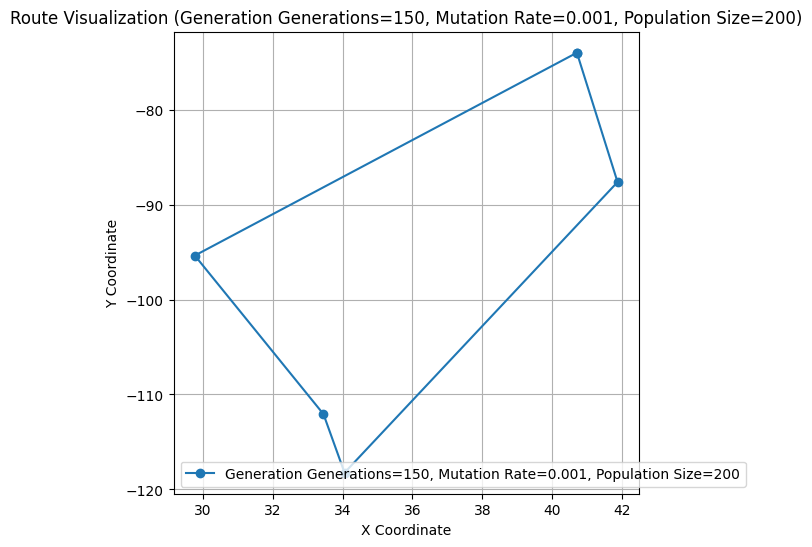

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


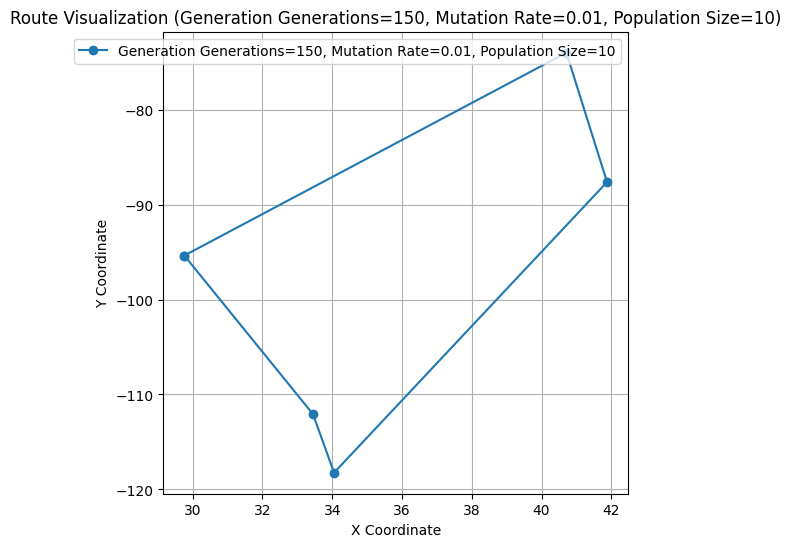

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


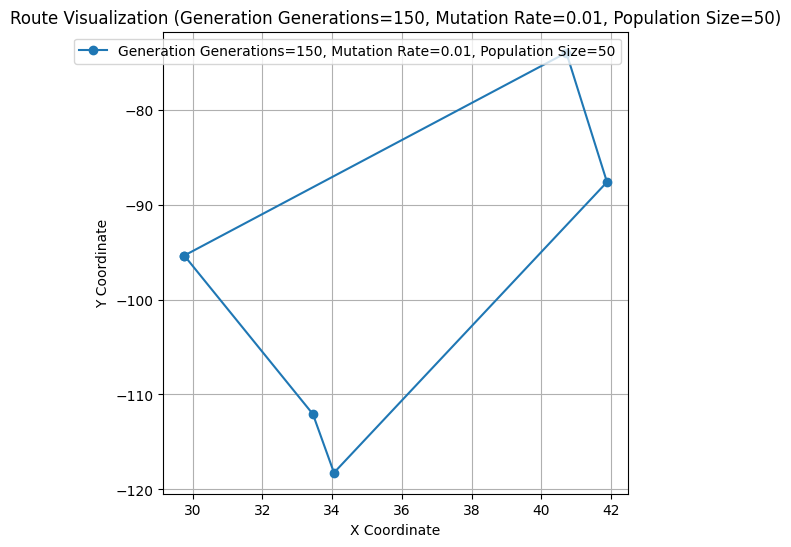

Best Route: [0, 2, 1, 4, 3]
Best Distance: 92.58519307559176


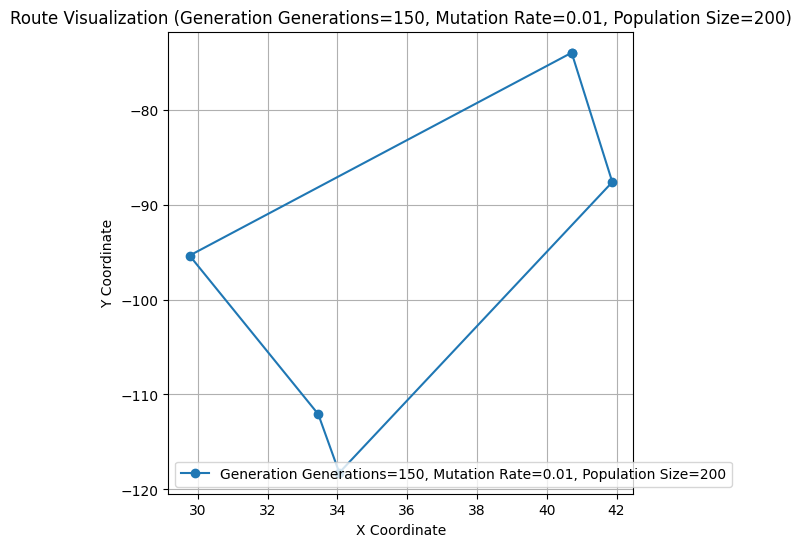

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


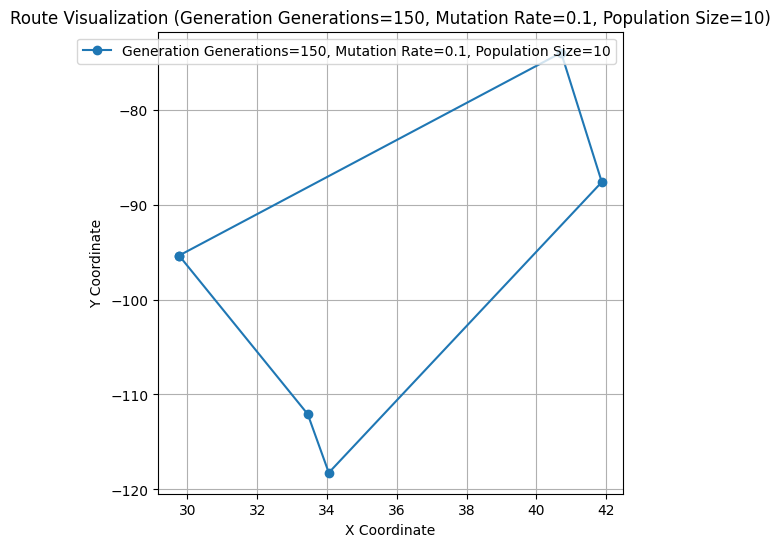

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


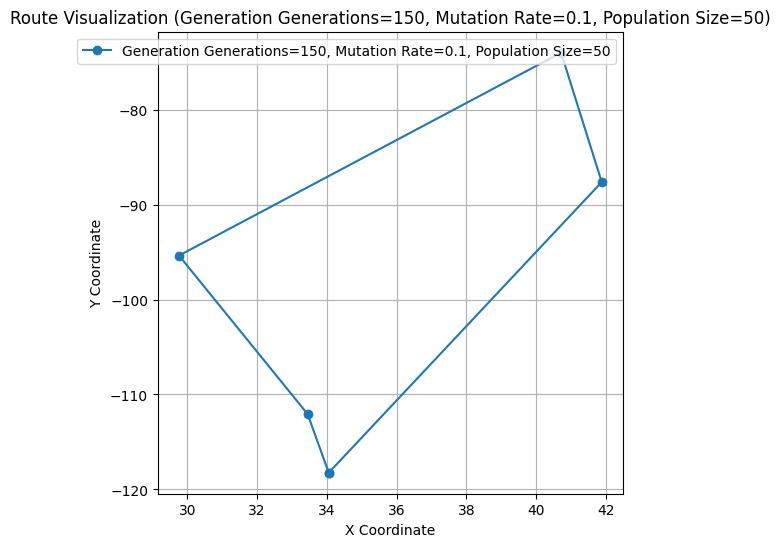

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


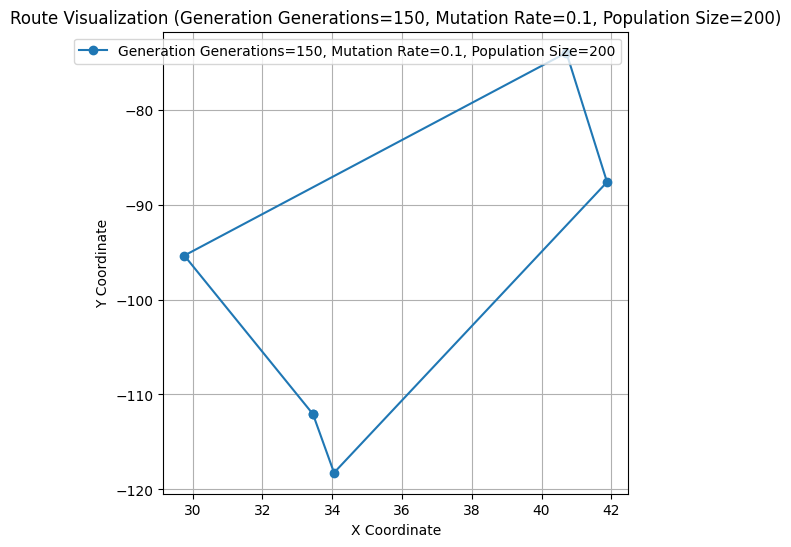

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


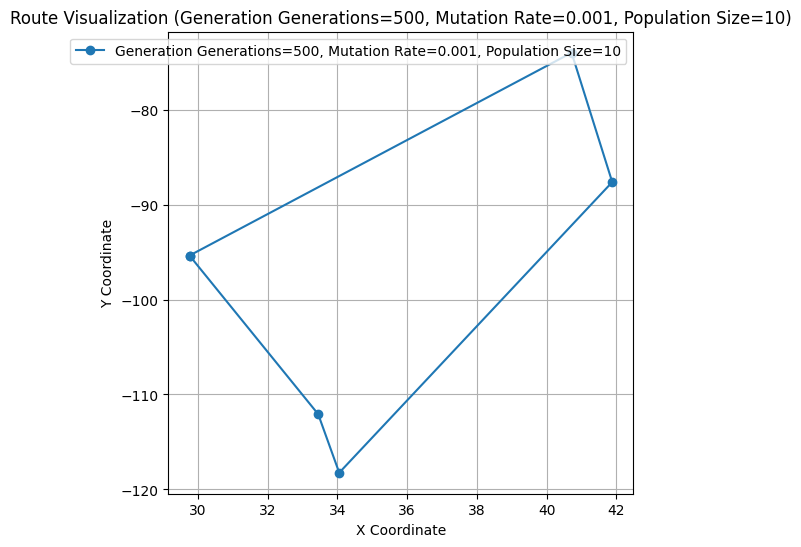

Best Route: [2, 1, 4, 3, 0]
Best Distance: 92.58519307559176


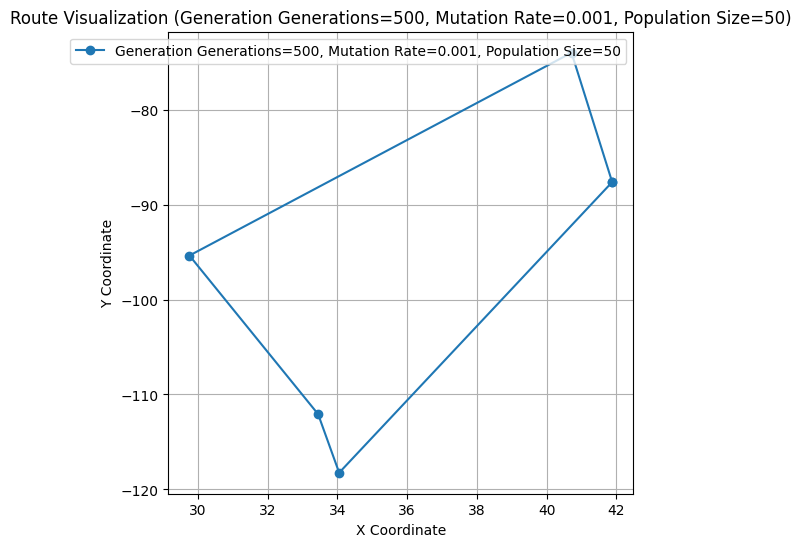

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


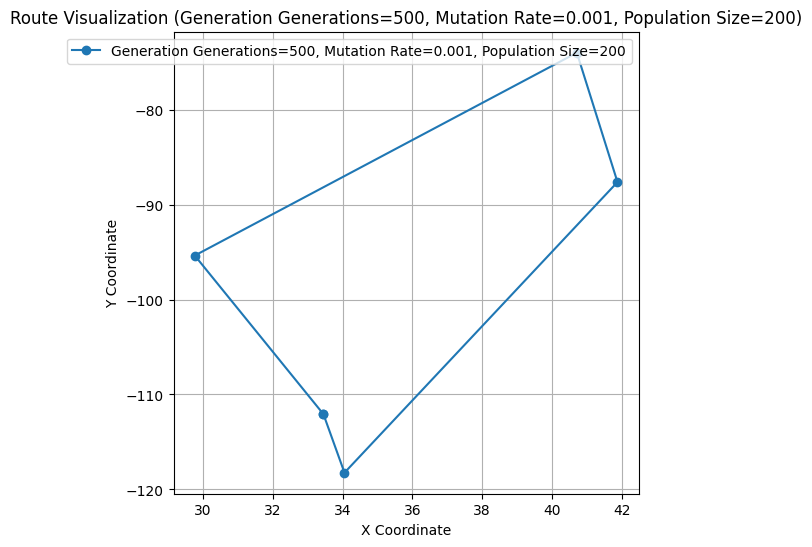

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


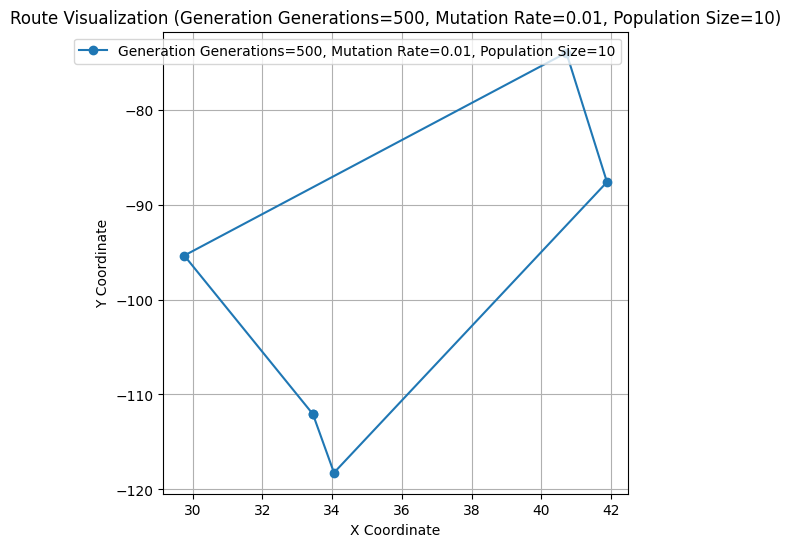

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


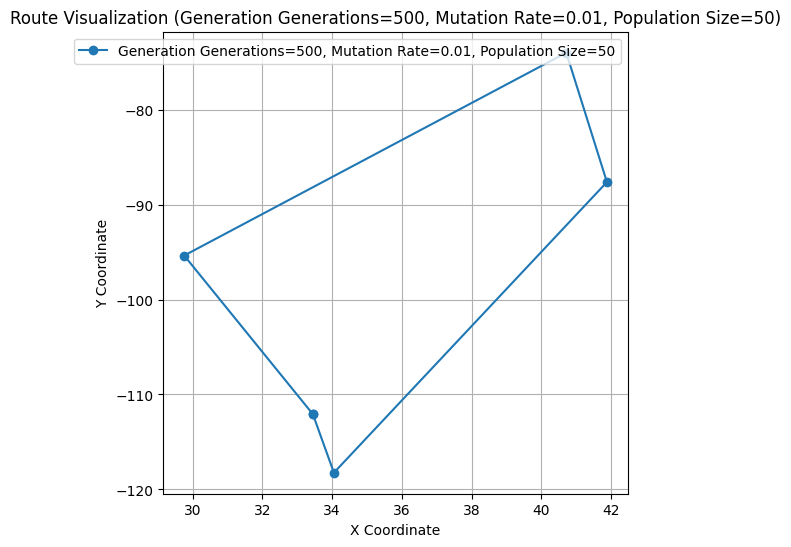

Best Route: [4, 1, 2, 0, 3]
Best Distance: 92.58519307559176


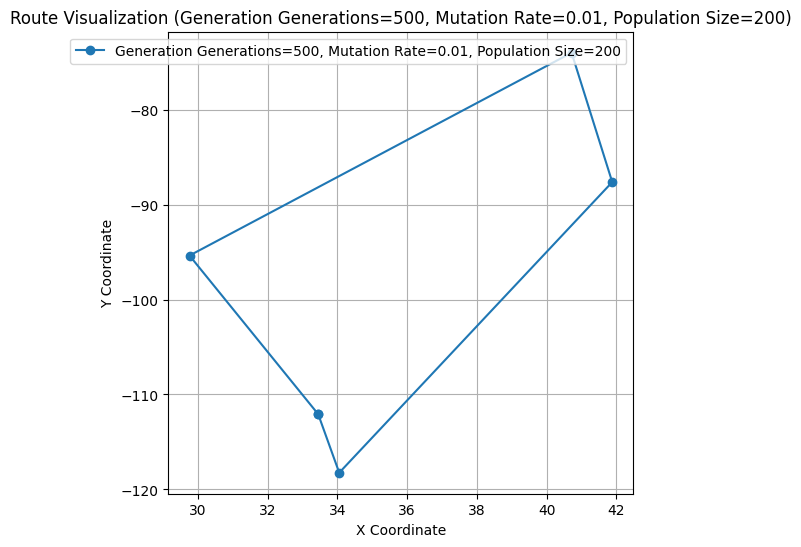

Best Route: [3, 0, 2, 1, 4]
Best Distance: 92.58519307559176


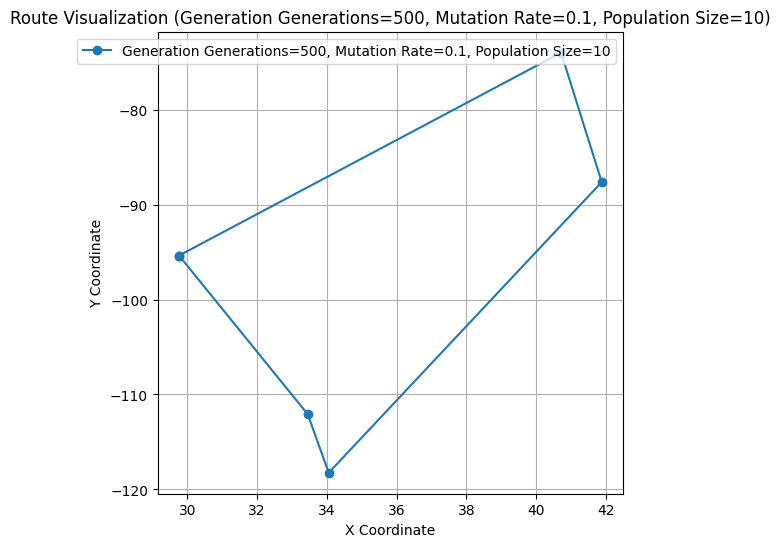

Best Route: [1, 4, 3, 0, 2]
Best Distance: 92.58519307559176


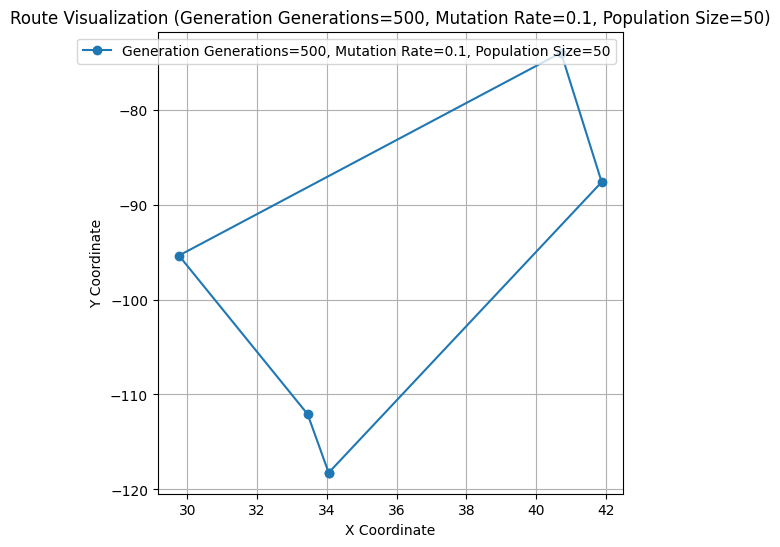

Best Route: [3, 4, 1, 2, 0]
Best Distance: 92.58519307559176


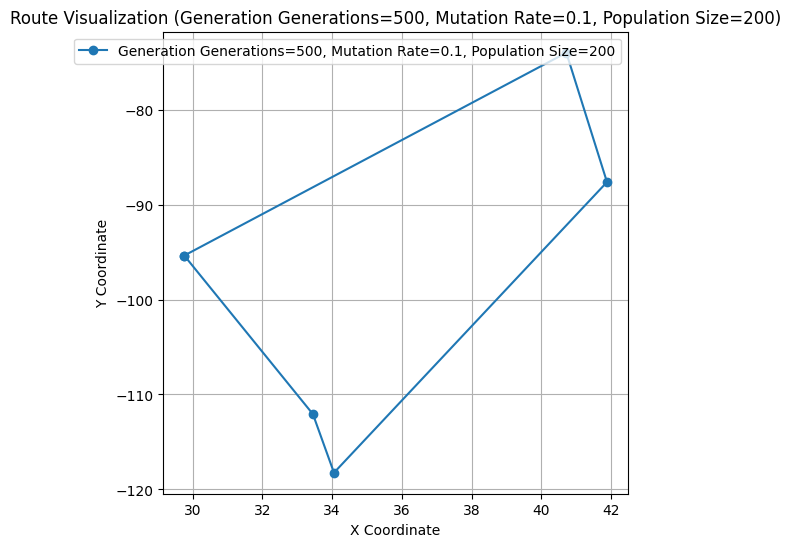

In [10]:
cities = [
    (40.7128, -74.0060),  # New York
    (34.0522, -118.2437),  # Los Angeles
    (41.8781, -87.6298),  # Chicago
    (29.7604, -95.3698),  # Houston
    (33.4484, -112.0740)  # Phoenix
]

for generation in generations:
    for mutation_rate in mutation_rates:
        for population_size in population_sizes:
            # Run the Genetic Algorithm
            best_route, best_distance = genetic_algorithm(cities, generations=generation, population_size=population_size, mutation_rate=mutation_rate, verboze=False)
            print("Best Route:", best_route)
            print("Best Distance:", best_distance)
            visualize_route(best_route, cities, f"Generations={generation}, Mutation Rate={mutation_rate}, Population Size={population_size}")

#### Second

Best Route: [9, 1, 4, 0, 13, 10, 6, 8, 2, 7, 12, 3, 5, 11]
Best Distance: 59.249931671810785


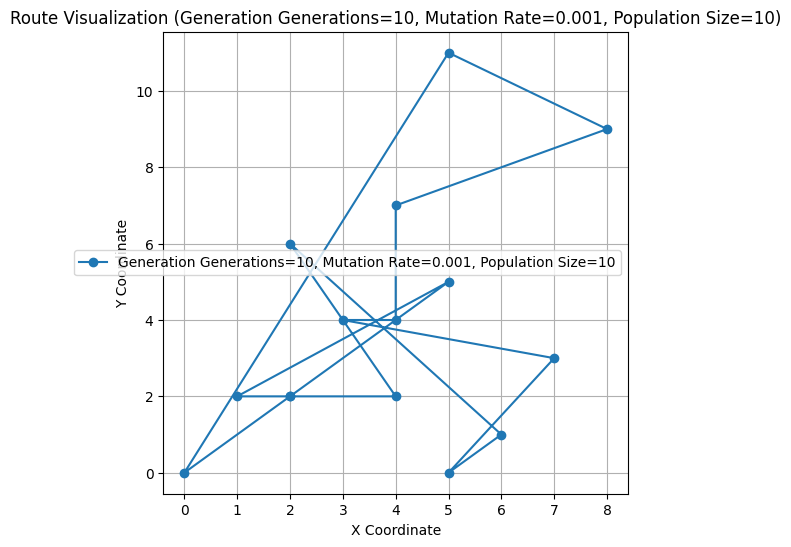

Best Route: [1, 6, 13, 4, 8, 2, 7, 10, 5, 9, 11, 3, 12, 0]
Best Distance: 52.16869268862398


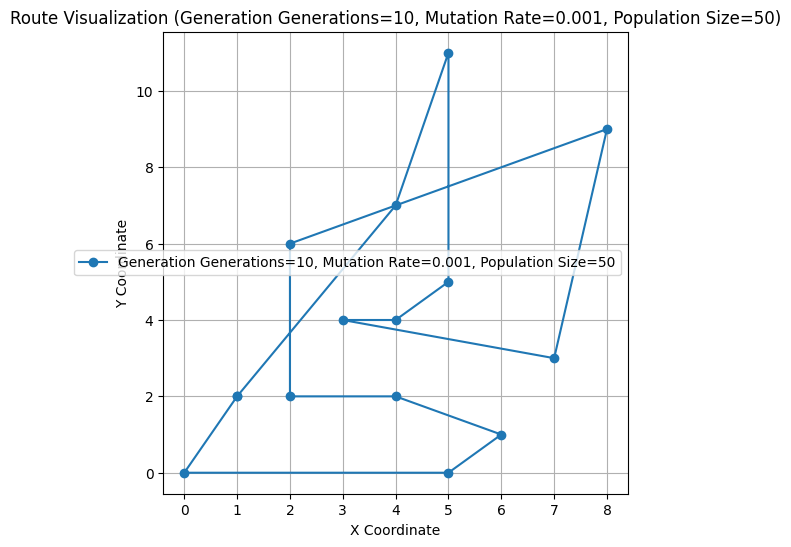

Best Route: [5, 13, 10, 6, 9, 11, 7, 12, 3, 4, 8, 2, 0, 1]
Best Distance: 47.37233922155704


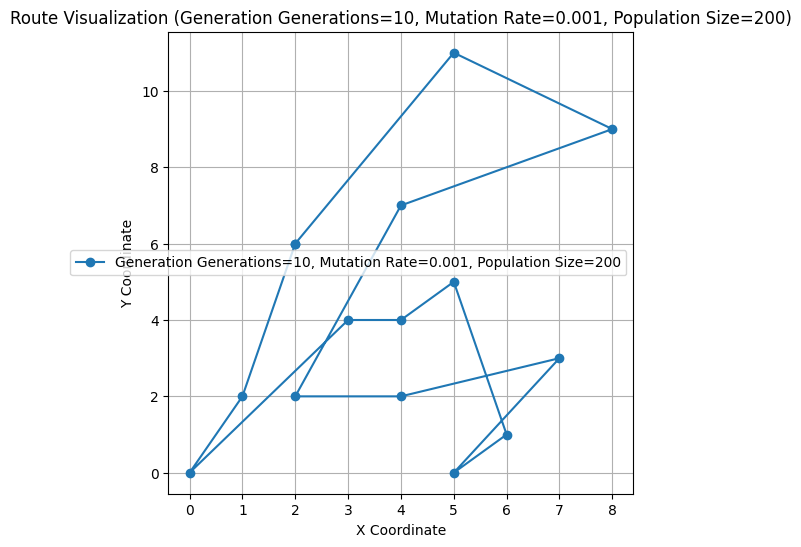

Best Route: [2, 11, 10, 13, 1, 8, 4, 12, 3, 7, 0, 9, 5, 6]
Best Distance: 57.265327049046675


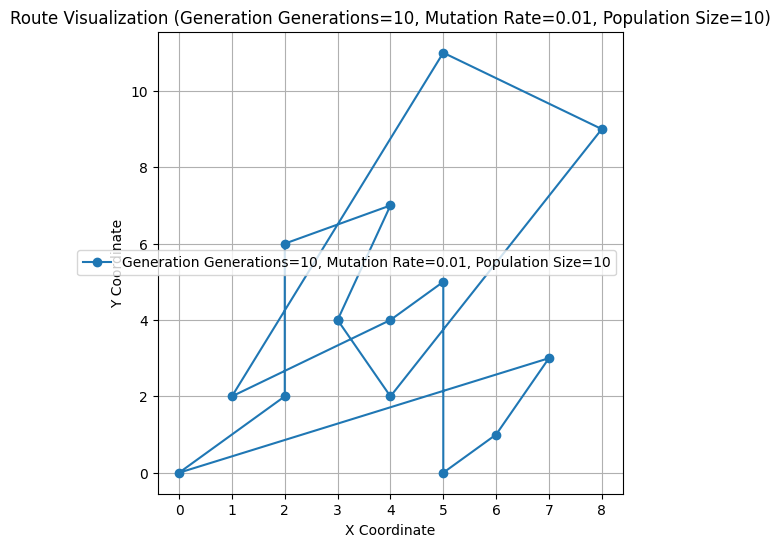

Best Route: [0, 1, 4, 7, 13, 10, 8, 6, 5, 2, 12, 3, 11, 9]
Best Distance: 48.742362440996374


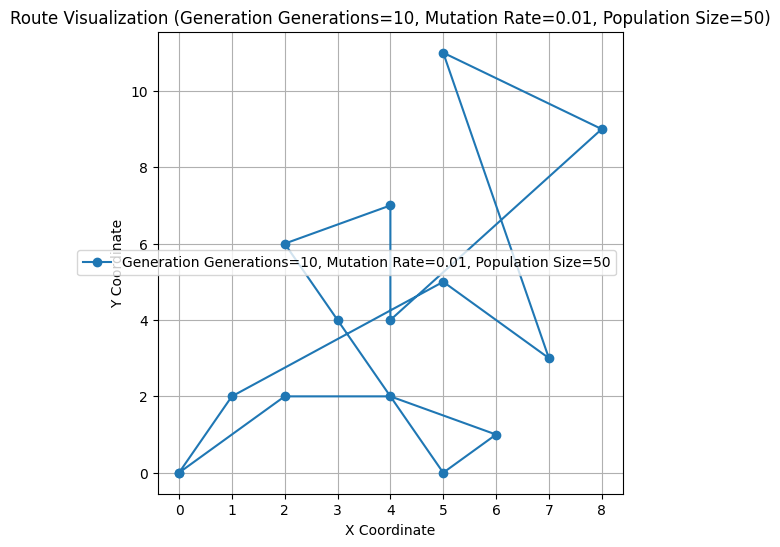

Best Route: [5, 8, 6, 13, 10, 7, 2, 11, 3, 12, 9, 1, 0, 4]
Best Distance: 46.72426642411402


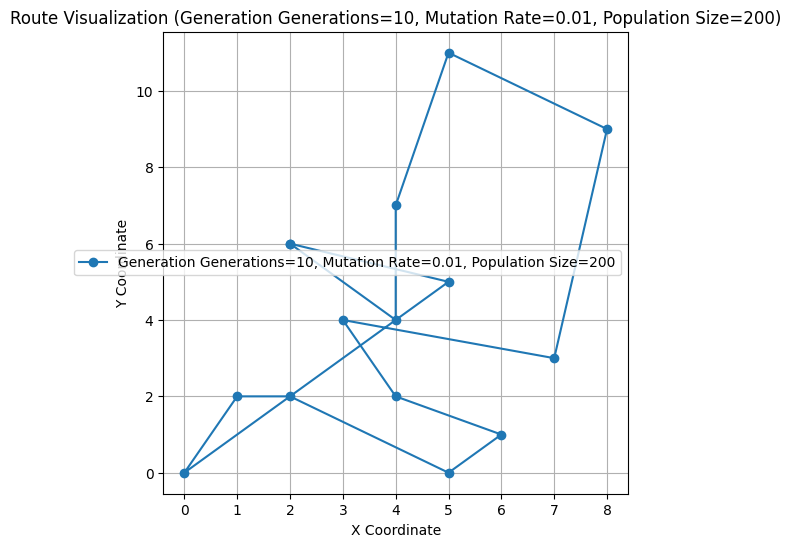

Best Route: [3, 9, 4, 11, 7, 13, 10, 2, 5, 1, 0, 6, 8, 12]
Best Distance: 58.80795048854504


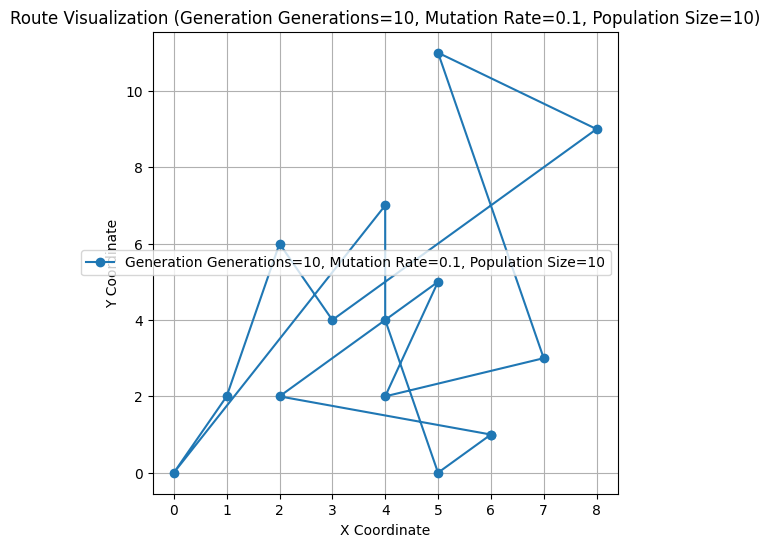

Best Route: [12, 1, 0, 9, 4, 7, 11, 5, 6, 13, 10, 8, 2, 3]
Best Distance: 47.26681584978566


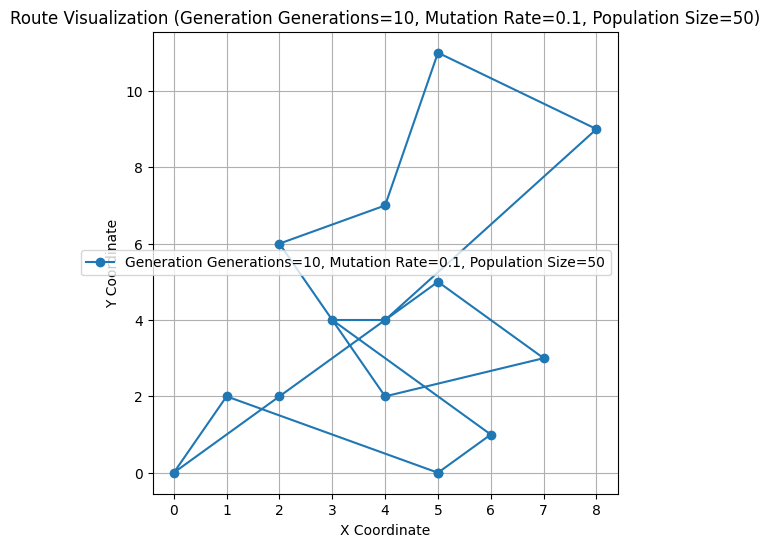

Best Route: [2, 1, 9, 0, 12, 5, 6, 13, 10, 4, 3, 11, 7, 8]
Best Distance: 47.0135119840274


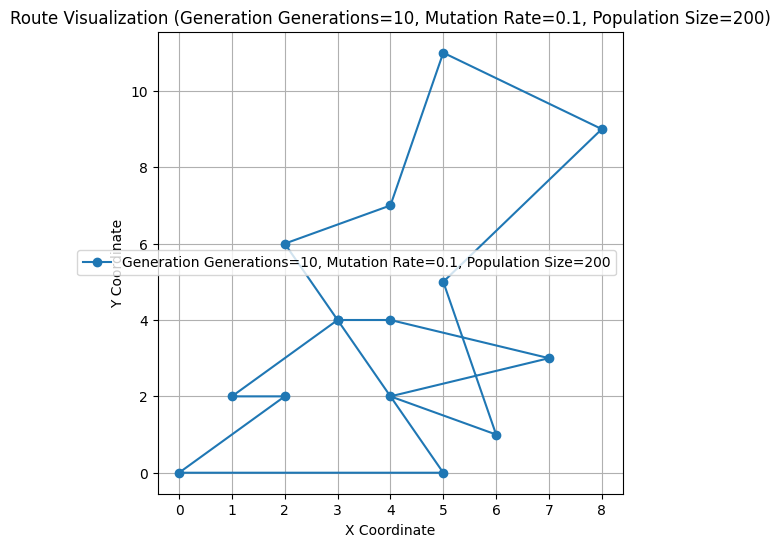

Best Route: [0, 11, 12, 3, 1, 8, 4, 7, 2, 6, 10, 13, 5, 9]
Best Distance: 49.09207850688962


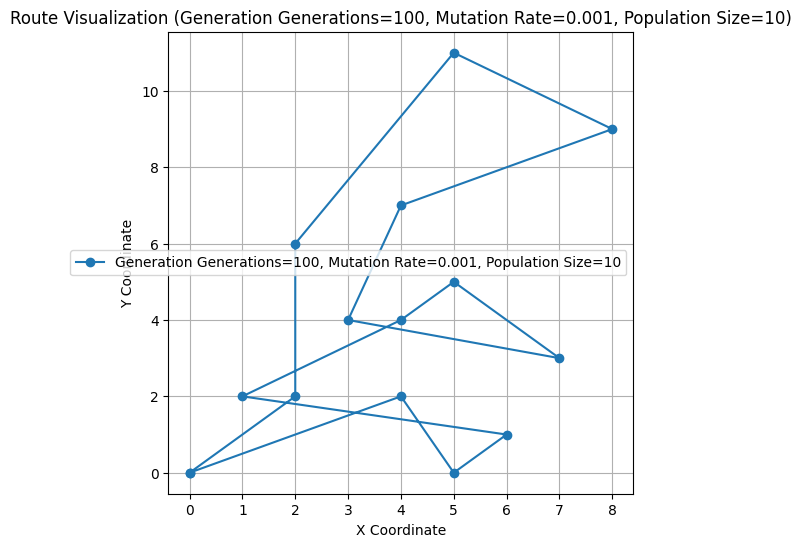

Best Route: [5, 13, 10, 7, 3, 12, 2, 11, 0, 1, 9, 8, 4, 6]
Best Distance: 42.30073174759799


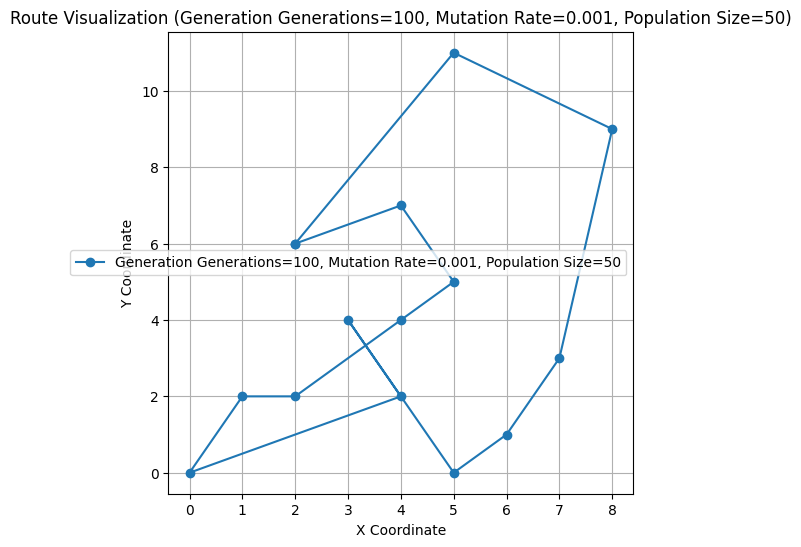

Best Route: [11, 8, 4, 5, 6, 13, 10, 2, 7, 3, 12, 0, 1, 9]
Best Distance: 41.62173905597872


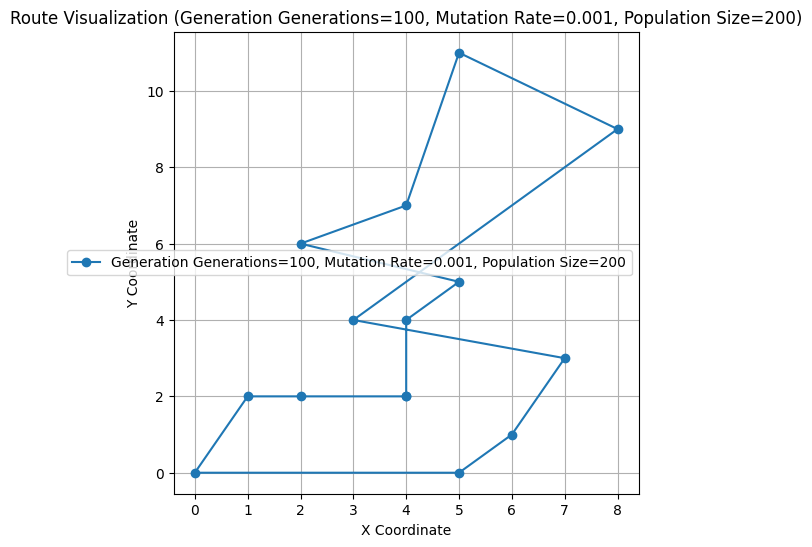

Best Route: [11, 5, 6, 8, 7, 13, 10, 4, 2, 1, 0, 9, 3, 12]
Best Distance: 47.624621489349565


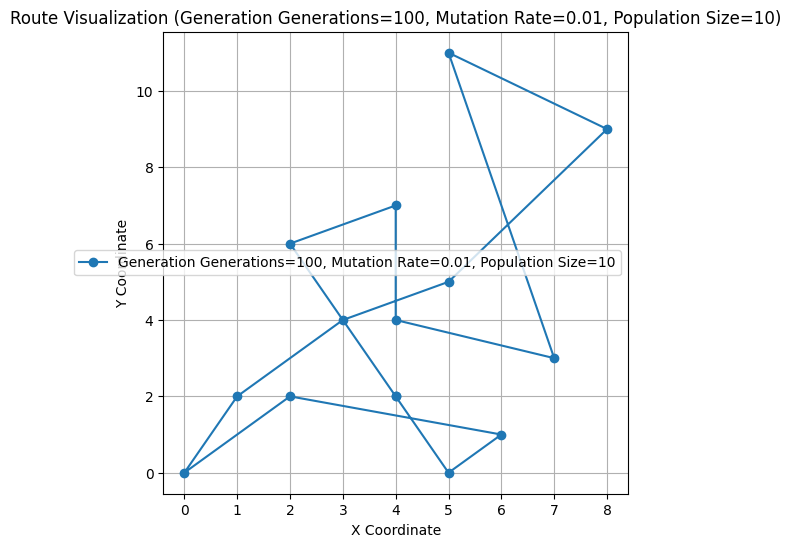

Best Route: [10, 5, 0, 9, 1, 11, 2, 8, 3, 12, 7, 4, 6, 13]
Best Distance: 44.51572247171081


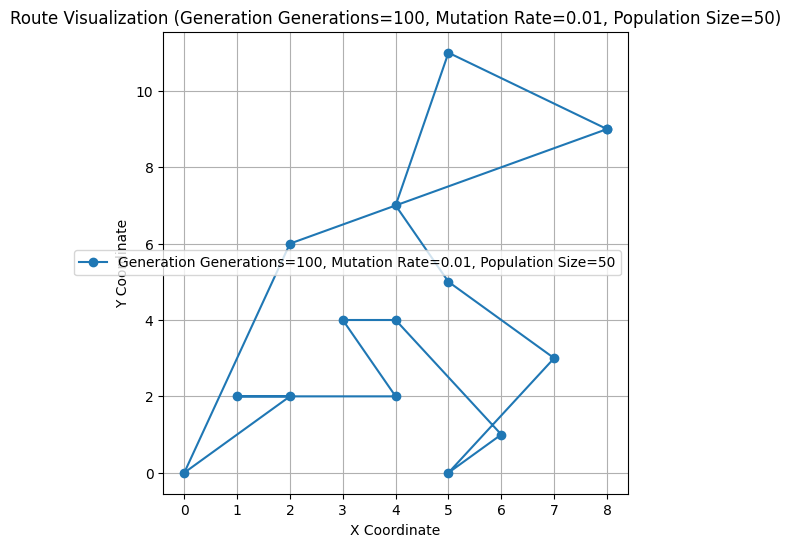

Best Route: [6, 5, 2, 8, 4, 3, 11, 9, 1, 0, 12, 7, 10, 13]
Best Distance: 40.898561804833776


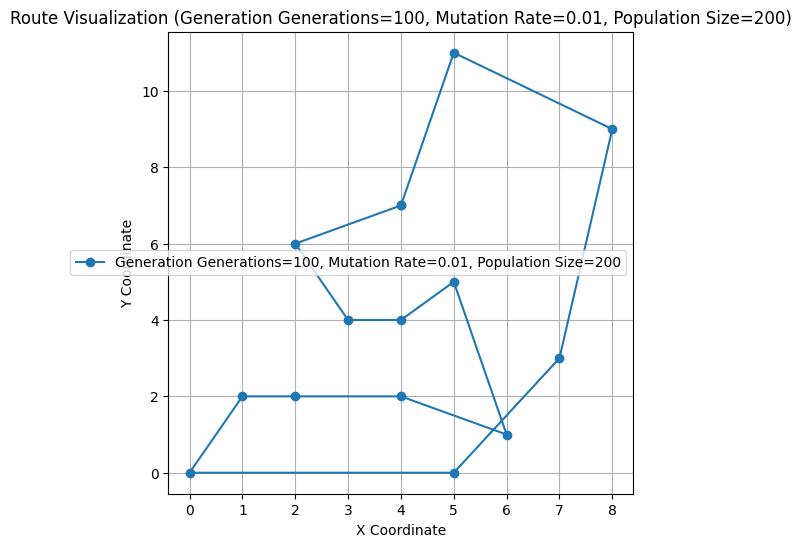

Best Route: [10, 5, 13, 9, 0, 1, 7, 3, 12, 11, 8, 4, 2, 6]
Best Distance: 52.34429111280752


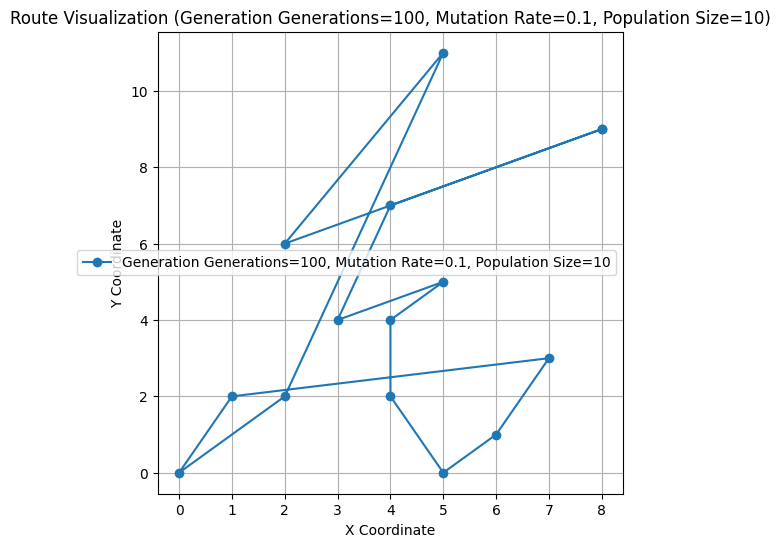

Best Route: [1, 5, 13, 10, 7, 3, 11, 12, 8, 4, 6, 2, 9, 0]
Best Distance: 44.58680316412923


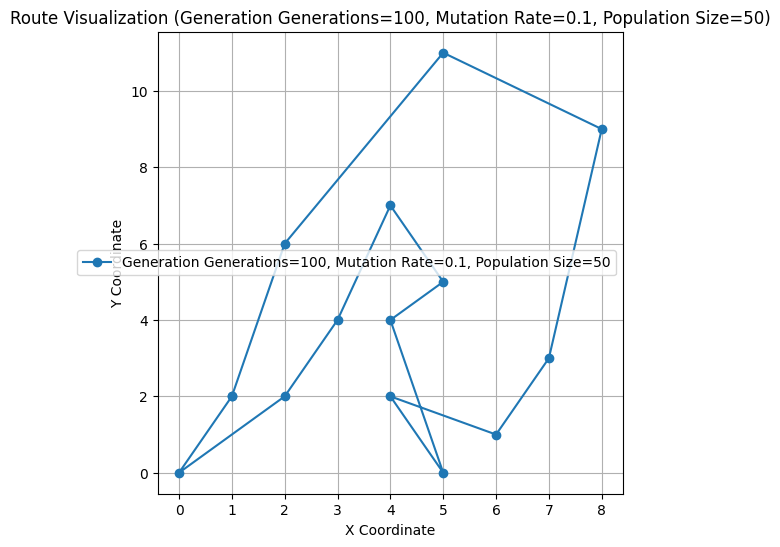

Best Route: [2, 9, 1, 0, 3, 11, 12, 4, 8, 7, 10, 13, 6, 5]
Best Distance: 43.887081049218295


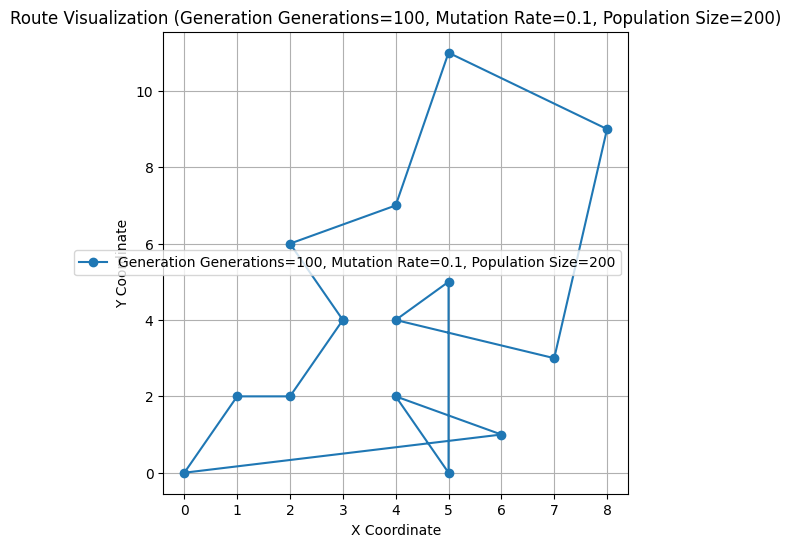

Best Route: [12, 7, 3, 9, 1, 0, 2, 8, 4, 6, 10, 13, 5, 11]
Best Distance: 43.467917453762354


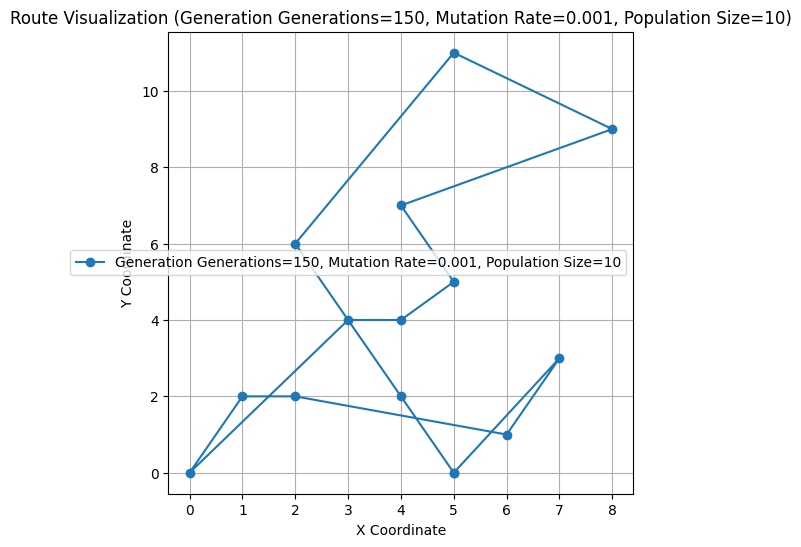

Best Route: [4, 2, 8, 1, 9, 11, 0, 12, 3, 7, 5, 6, 10, 13]
Best Distance: 45.1087438506449


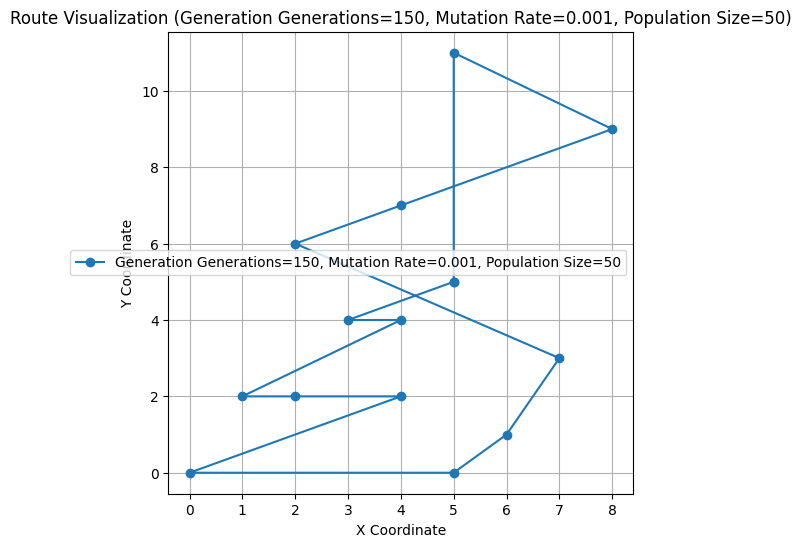

Best Route: [0, 12, 3, 7, 11, 8, 2, 4, 6, 13, 10, 5, 9, 1]
Best Distance: 40.95762396612166


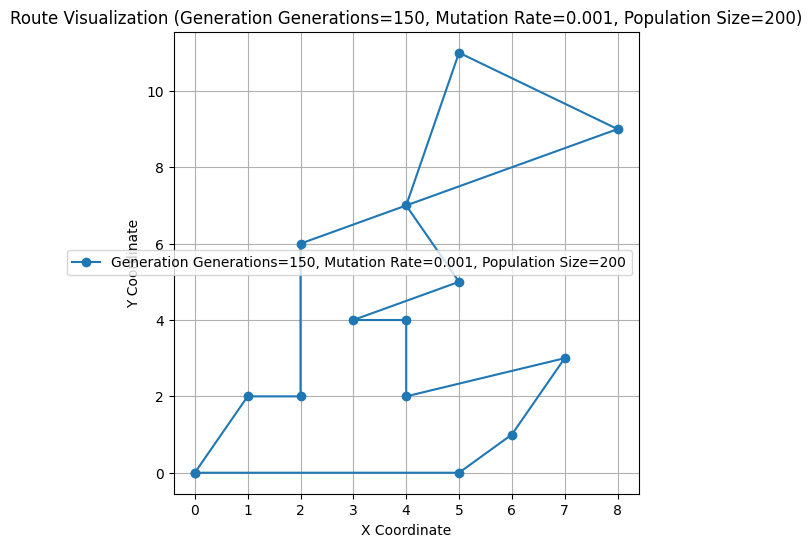

Best Route: [5, 6, 2, 8, 3, 12, 11, 13, 10, 4, 7, 0, 1, 9]
Best Distance: 48.995383074716344


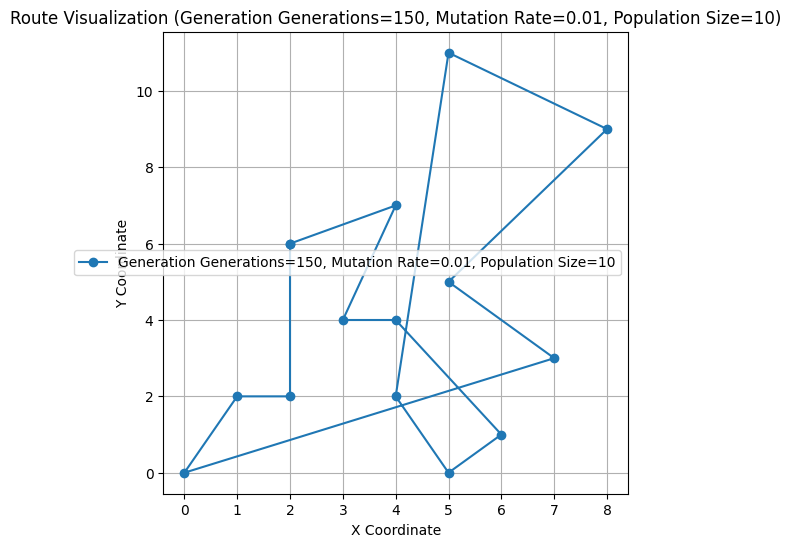

Best Route: [2, 5, 8, 10, 13, 6, 4, 0, 1, 9, 11, 7, 3, 12]
Best Distance: 45.02417516266638


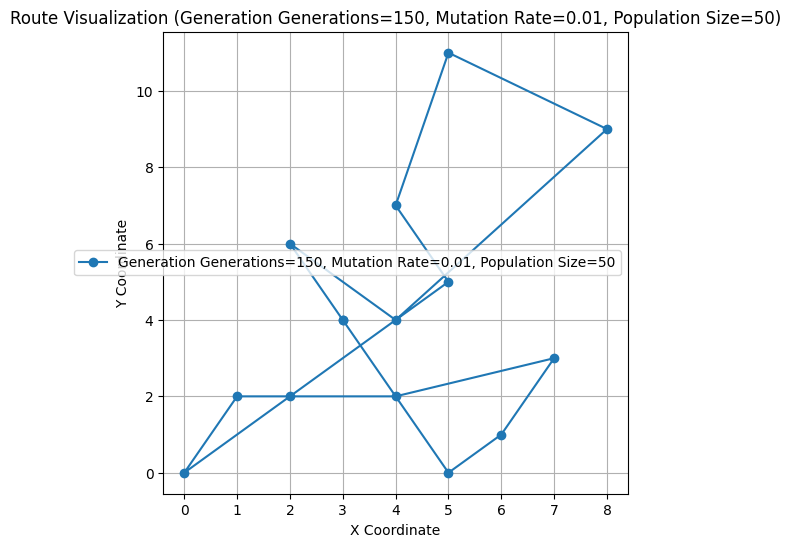

Best Route: [10, 13, 5, 2, 1, 0, 9, 3, 11, 12, 8, 7, 4, 6]
Best Distance: 44.9827492984501


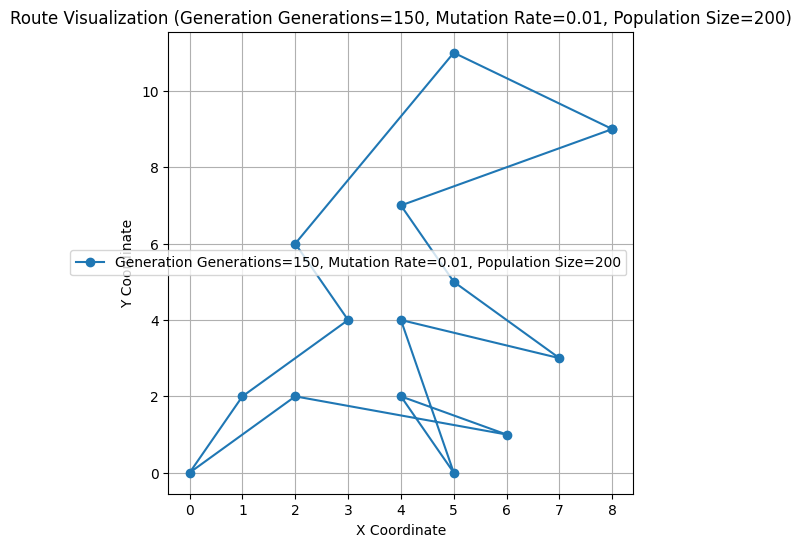

Best Route: [10, 13, 6, 7, 4, 8, 5, 0, 1, 9, 11, 2, 12, 3]
Best Distance: 47.72897675689146


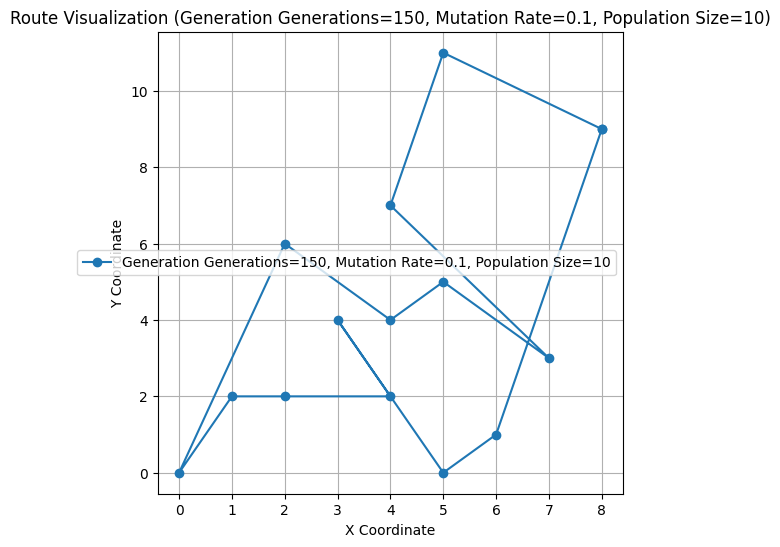

Best Route: [7, 8, 5, 6, 4, 13, 10, 2, 9, 0, 1, 11, 3, 12]
Best Distance: 44.69585572232626


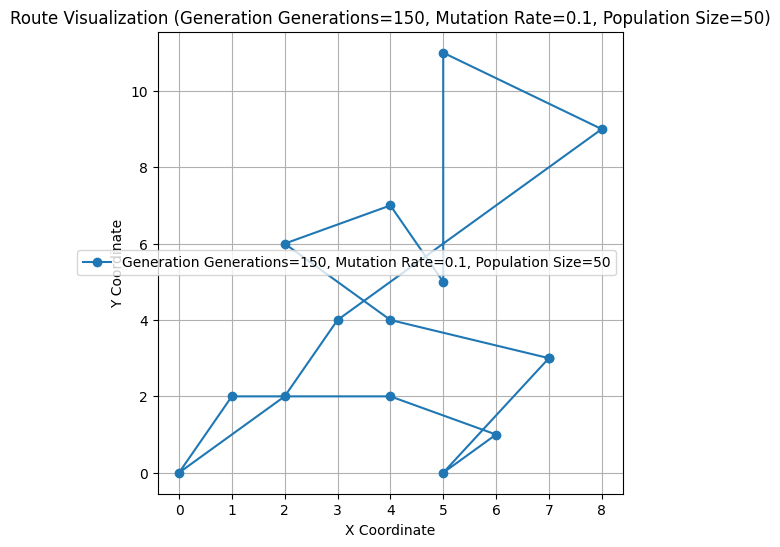

Best Route: [4, 8, 11, 12, 7, 3, 9, 1, 0, 2, 5, 10, 13, 6]
Best Distance: 42.76007118453471


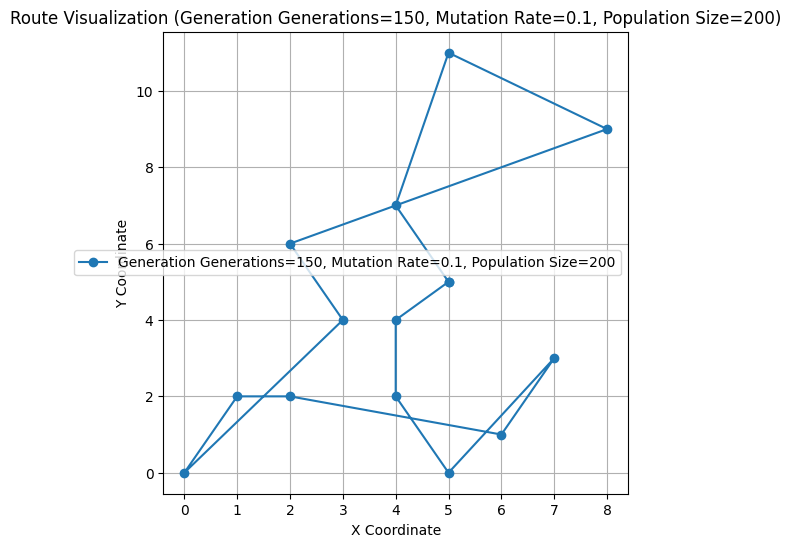

Best Route: [3, 7, 4, 5, 2, 11, 8, 13, 10, 6, 9, 1, 0, 12]
Best Distance: 44.883110106750365


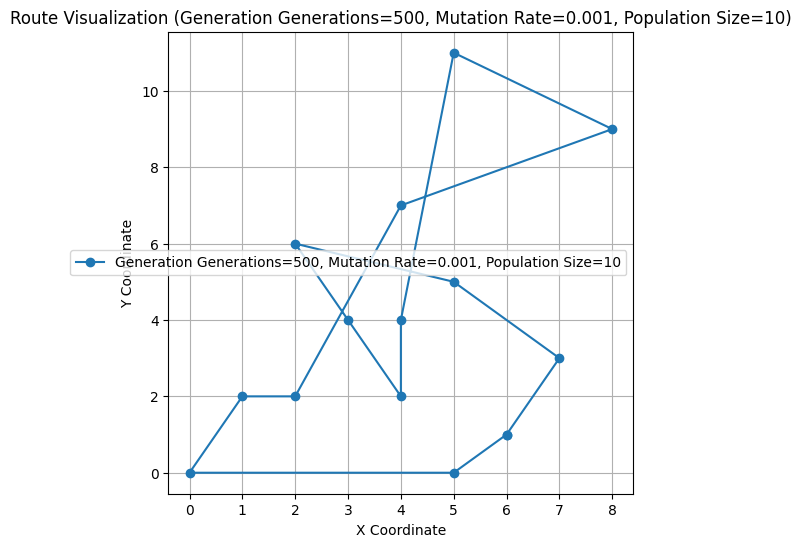

Best Route: [3, 7, 2, 8, 5, 4, 10, 13, 6, 1, 0, 11, 9, 12]
Best Distance: 45.63745595429542


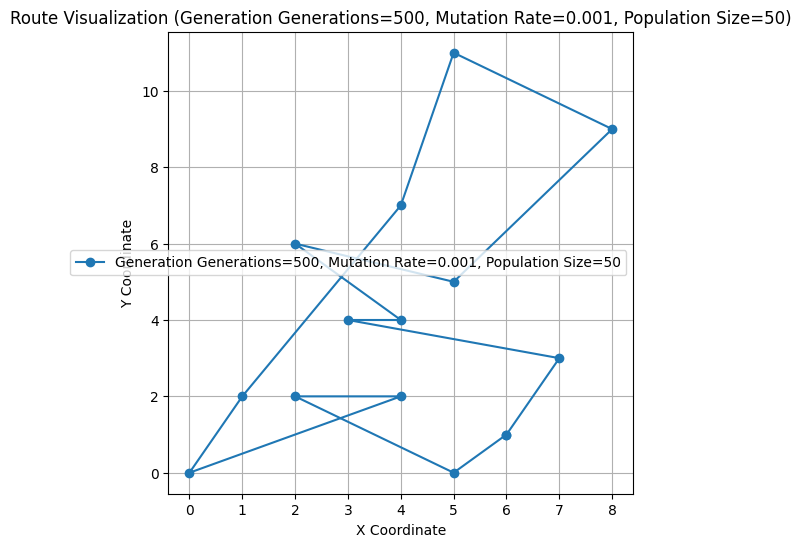

Best Route: [13, 6, 2, 9, 1, 0, 12, 3, 7, 11, 8, 4, 5, 10]
Best Distance: 41.46032487133172


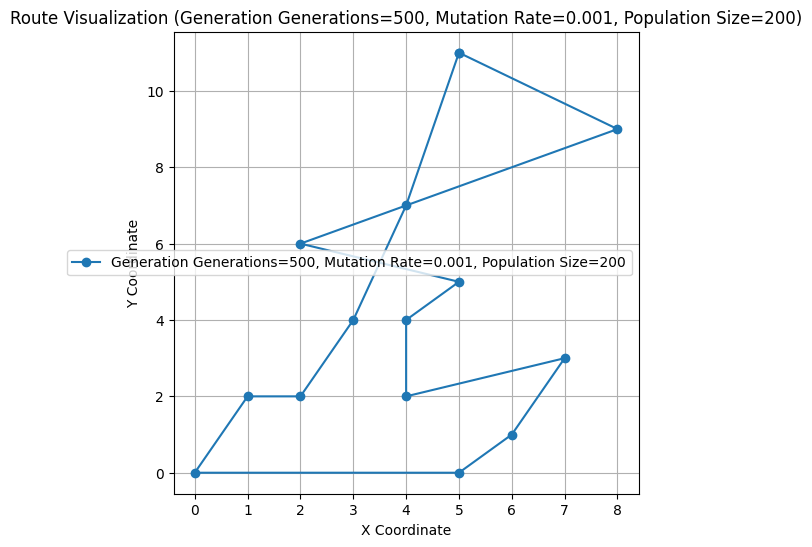

Best Route: [2, 9, 1, 0, 12, 11, 8, 3, 7, 4, 5, 6, 10, 13]
Best Distance: 44.13439306762159


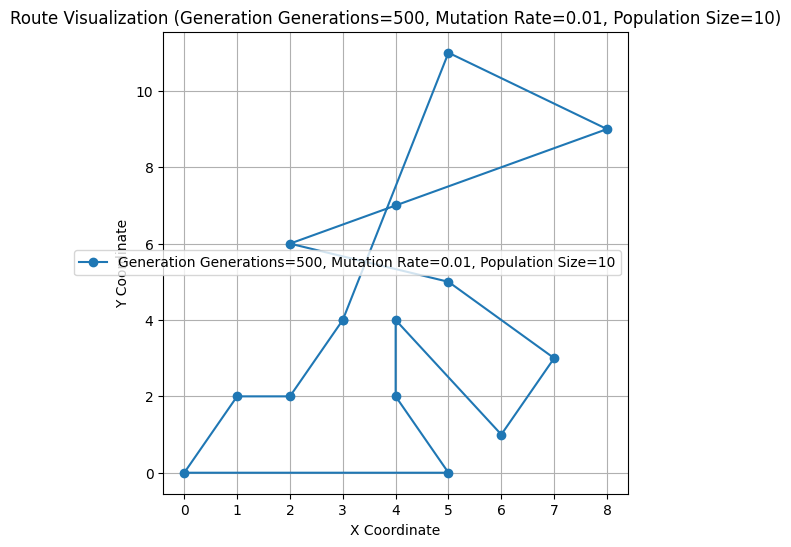

Best Route: [12, 3, 8, 4, 11, 0, 1, 9, 5, 2, 6, 13, 10, 7]
Best Distance: 44.11977633738995


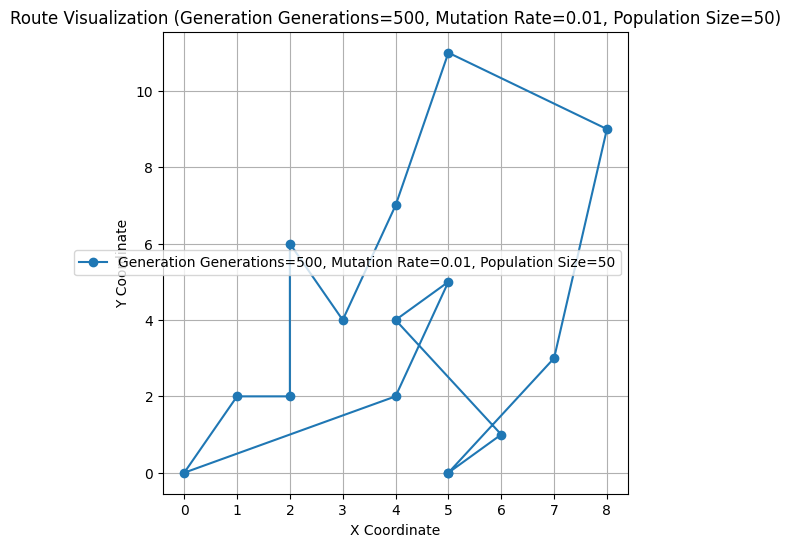

Best Route: [13, 10, 6, 4, 7, 8, 11, 3, 12, 9, 0, 1, 2, 5]
Best Distance: 41.520234907552066


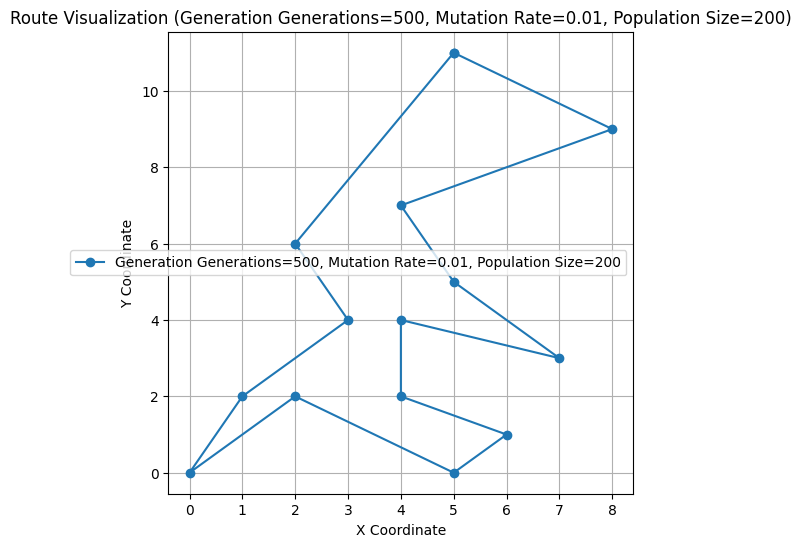

Best Route: [11, 2, 9, 0, 1, 5, 8, 10, 13, 6, 4, 12, 7, 3]
Best Distance: 45.93370015408726


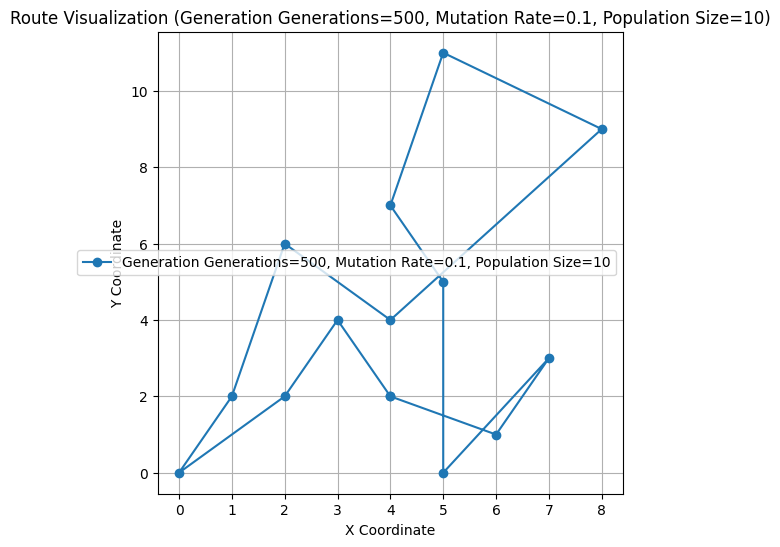

Best Route: [6, 13, 10, 7, 3, 11, 12, 0, 9, 1, 4, 5, 2, 8]
Best Distance: 43.746396126293604


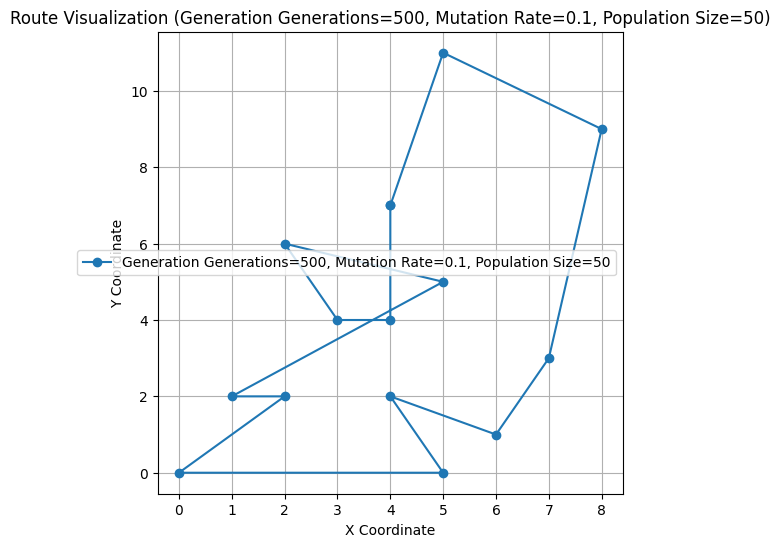

Best Route: [0, 1, 11, 12, 3, 8, 7, 10, 13, 6, 4, 2, 5, 9]
Best Distance: 43.00222894163046


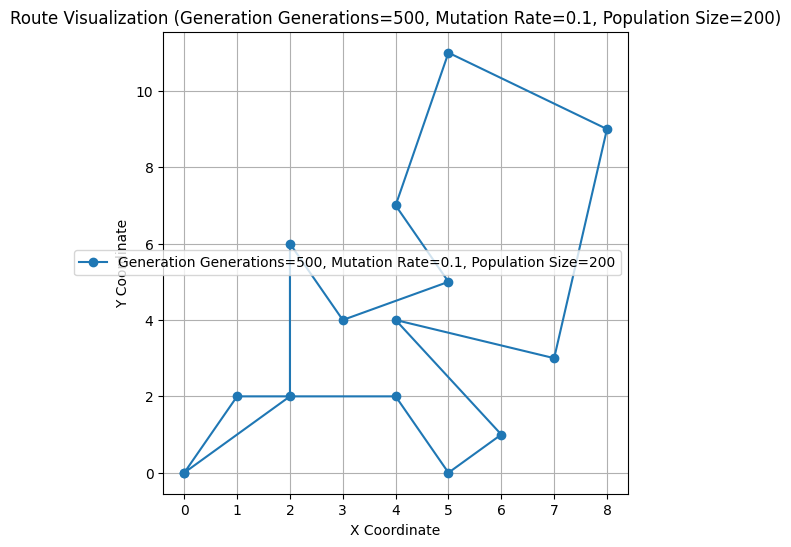

In [11]:
cities = [
    (0, 0), (1, 2), (3, 4), (6, 1), (5, 5), (2, 6), (4, 7), (7, 3), (4, 4), (2, 2), (8, 9), (4, 2), (5, 0), (5, 11),
]

for generation in generations:
    for mutation_rate in mutation_rates:
        for population_size in population_sizes:
            # Run the Genetic Algorithm
            best_route, best_distance = genetic_algorithm(cities, generations=generation, population_size=population_size, mutation_rate=mutation_rate, verboze=False)
            print("Best Route:", best_route)
            print("Best Distance:", best_distance)
            visualize_route(best_route, cities, f"Generations={generation}, Mutation Rate={mutation_rate}, Population Size={population_size}")

Best Route: [1, 8, 22, 6, 20, 12, 21, 7, 0, 3, 4, 17, 9, 2, 13, 14, 5, 18, 11, 10, 23, 16, 24, 15, 19]
Best Distance: 1074.1876138188684


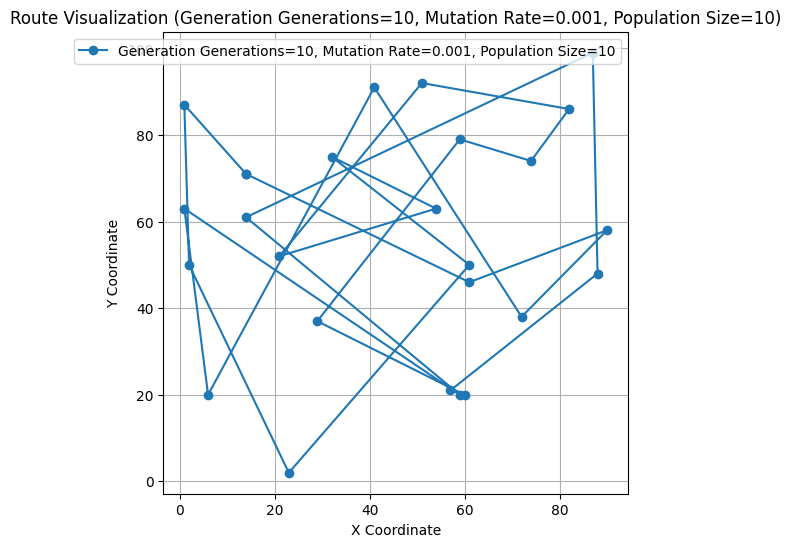

Best Route: [16, 0, 17, 11, 6, 23, 7, 12, 22, 21, 20, 24, 13, 18, 10, 8, 3, 15, 19, 2, 1, 14, 5, 4, 9]
Best Distance: 958.8725542122789


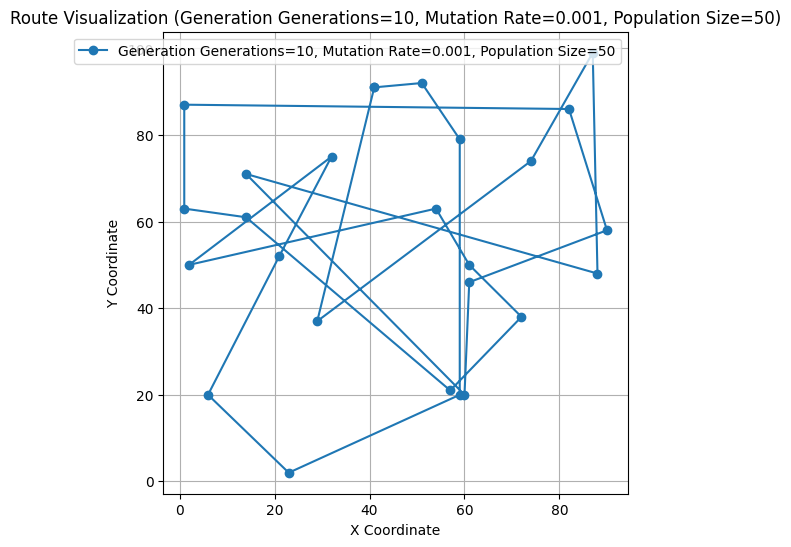

Best Route: [24, 15, 1, 22, 7, 12, 0, 3, 20, 21, 9, 13, 14, 4, 5, 19, 6, 23, 10, 2, 11, 18, 16, 8, 17]
Best Distance: 955.6712615738909


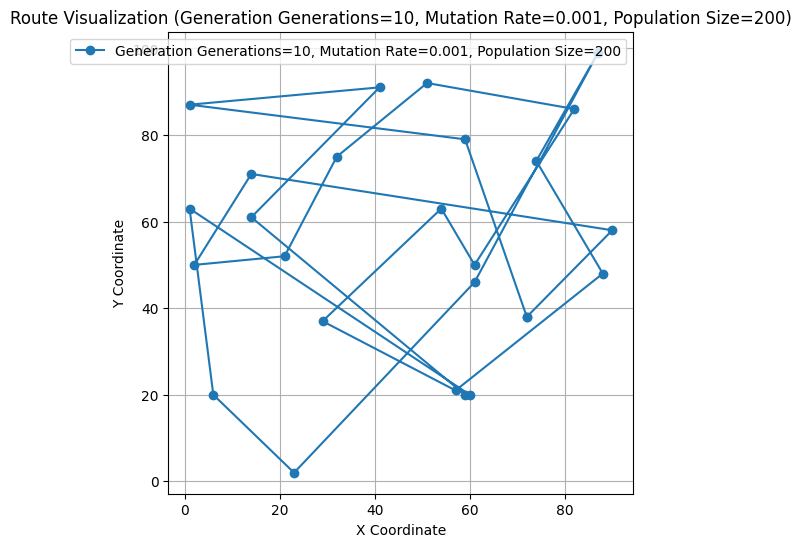

Best Route: [21, 1, 24, 13, 19, 7, 22, 18, 23, 12, 11, 4, 3, 9, 10, 8, 14, 6, 2, 16, 5, 17, 15, 20, 0]
Best Distance: 1110.651211466651


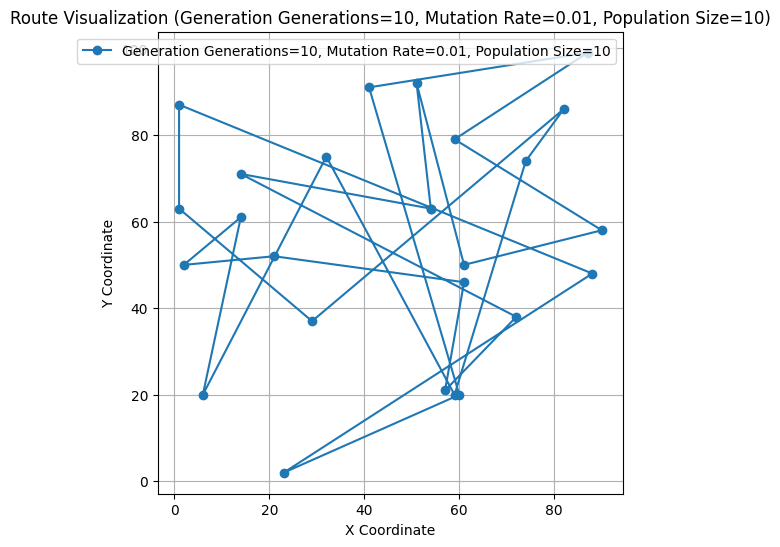

Best Route: [8, 0, 4, 2, 6, 19, 13, 7, 24, 15, 14, 12, 16, 23, 11, 3, 17, 21, 5, 9, 22, 18, 20, 1, 10]
Best Distance: 1039.719170708223


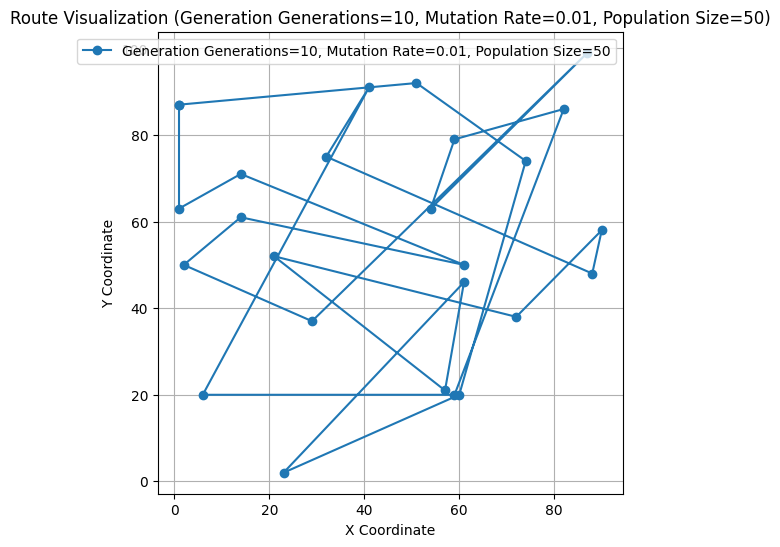

Best Route: [1, 12, 14, 2, 11, 23, 13, 6, 21, 17, 8, 10, 22, 20, 16, 3, 24, 4, 19, 9, 7, 18, 15, 5, 0]
Best Distance: 964.8493789700576


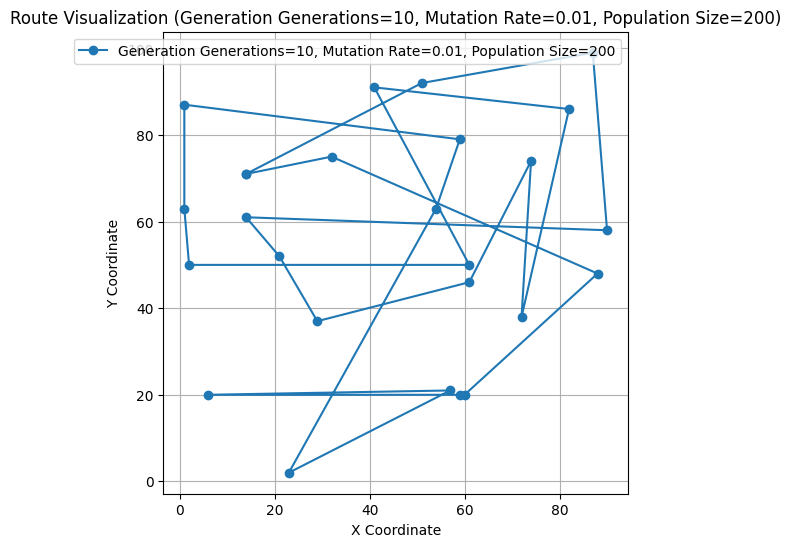

Best Route: [23, 21, 0, 16, 2, 4, 12, 1, 18, 17, 22, 10, 20, 3, 19, 24, 5, 15, 14, 9, 13, 11, 6, 7, 8]
Best Distance: 997.1028228389109


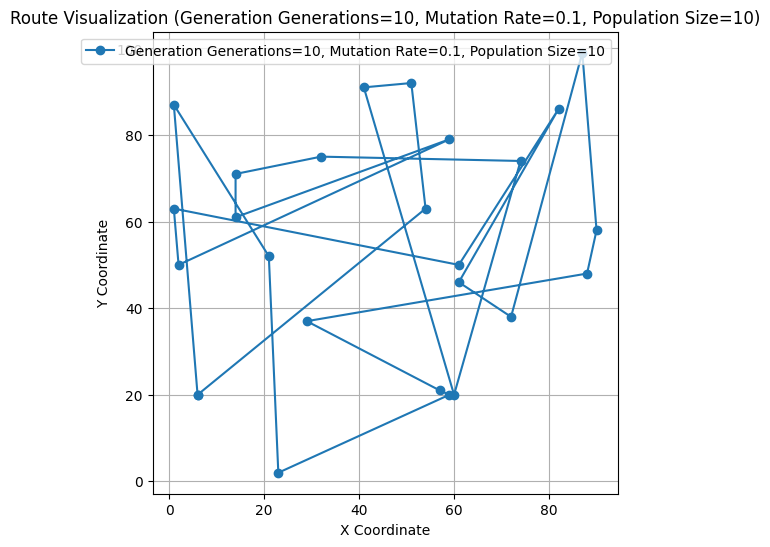

Best Route: [9, 6, 21, 3, 5, 20, 16, 1, 10, 14, 17, 4, 0, 18, 22, 8, 11, 12, 7, 23, 13, 2, 24, 15, 19]
Best Distance: 959.4288465837518


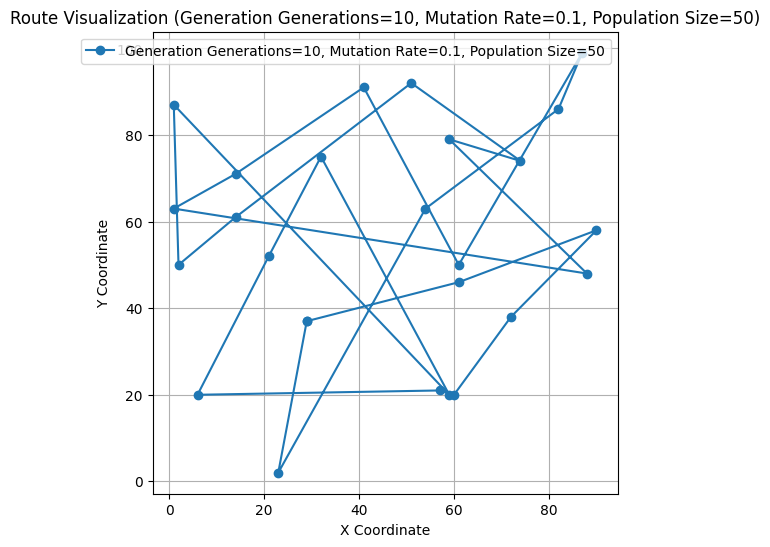

Best Route: [16, 1, 0, 17, 13, 19, 3, 4, 24, 14, 2, 5, 10, 22, 18, 8, 6, 23, 9, 7, 21, 11, 20, 15, 12]
Best Distance: 939.1687433695515


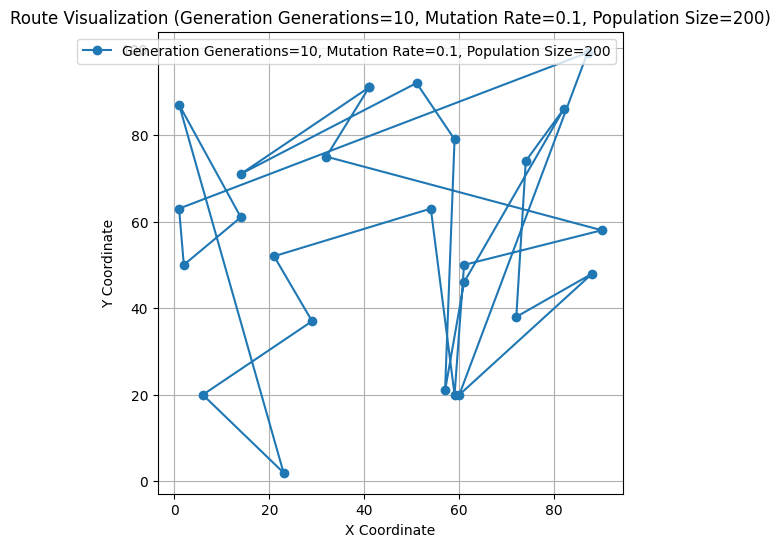

Best Route: [5, 3, 4, 18, 16, 10, 12, 8, 1, 6, 7, 19, 11, 22, 23, 14, 13, 2, 24, 15, 0, 21, 20, 9, 17]
Best Distance: 942.5390332776714


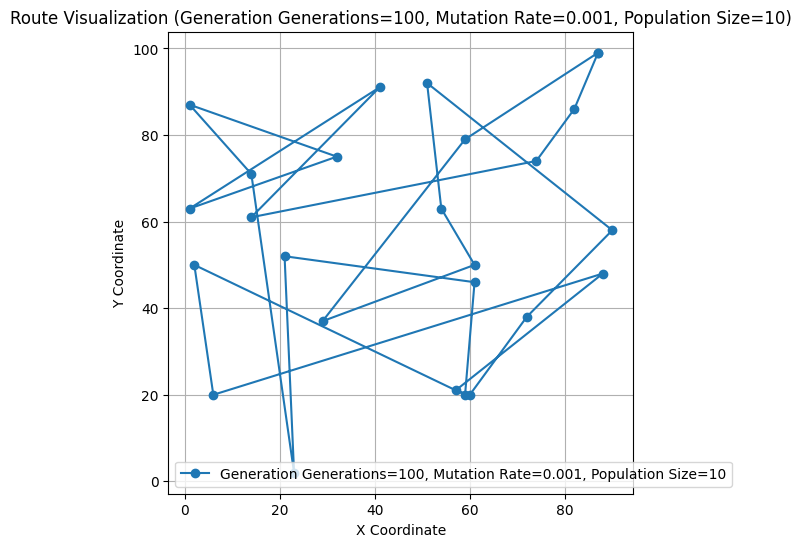

Best Route: [17, 4, 14, 5, 16, 0, 3, 21, 11, 7, 15, 12, 1, 8, 18, 22, 10, 20, 24, 2, 19, 13, 23, 6, 9]
Best Distance: 854.5463450595095


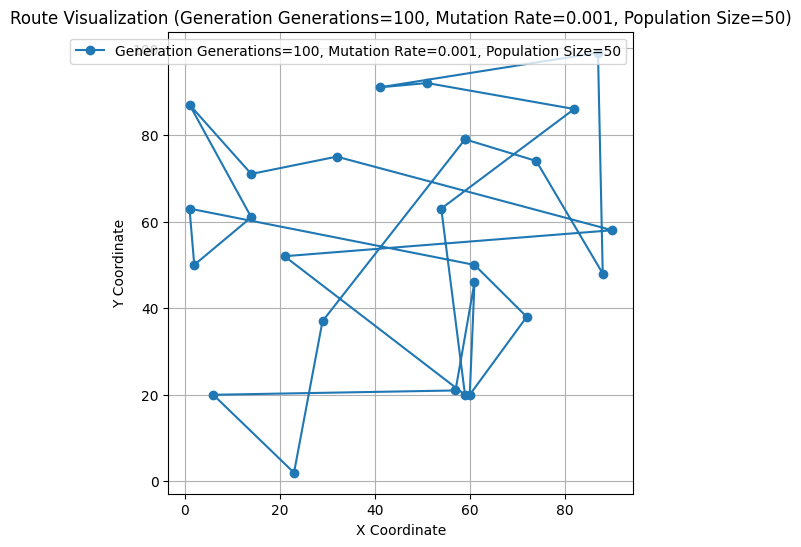

Best Route: [6, 2, 11, 14, 19, 13, 1, 24, 12, 16, 0, 3, 15, 4, 5, 8, 7, 18, 17, 21, 20, 9, 23, 10, 22]
Best Distance: 852.3261893411666


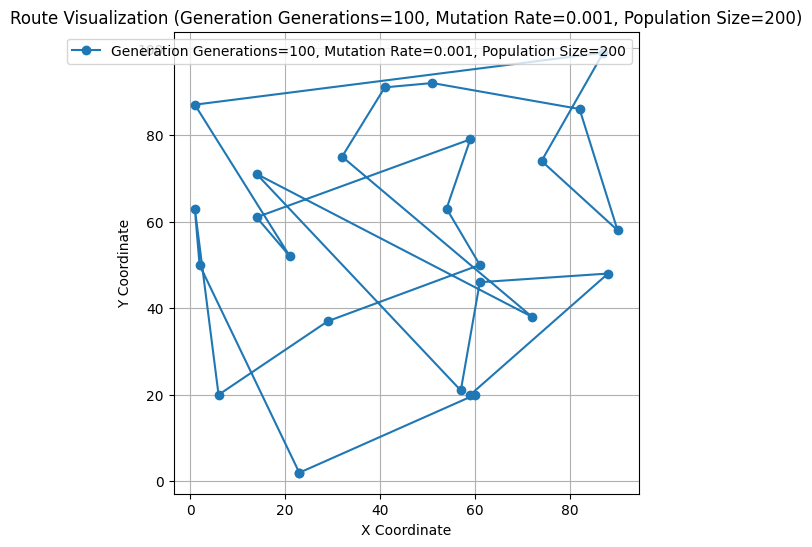

Best Route: [11, 9, 14, 0, 16, 17, 4, 1, 19, 21, 12, 10, 6, 24, 20, 3, 18, 8, 7, 13, 5, 15, 2, 22, 23]
Best Distance: 1084.081518600052


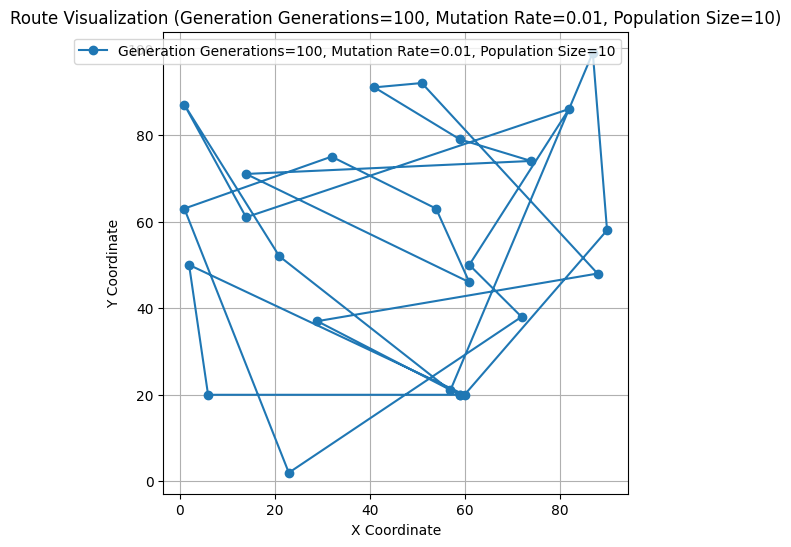

Best Route: [19, 21, 14, 24, 17, 3, 15, 2, 13, 6, 18, 4, 9, 16, 5, 0, 11, 7, 12, 10, 8, 1, 22, 23, 20]
Best Distance: 925.7050813421257


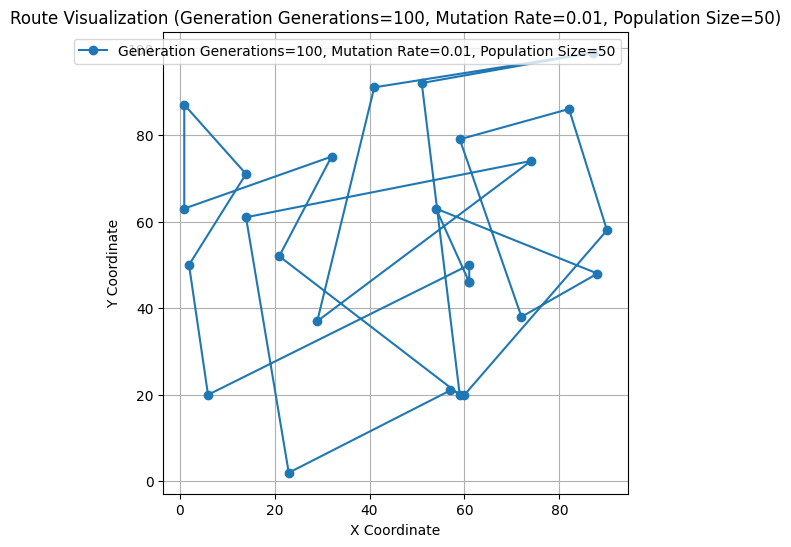

Best Route: [22, 1, 7, 9, 18, 8, 21, 3, 19, 2, 6, 11, 24, 20, 14, 15, 16, 0, 4, 5, 17, 12, 13, 23, 10]
Best Distance: 796.6270316528523


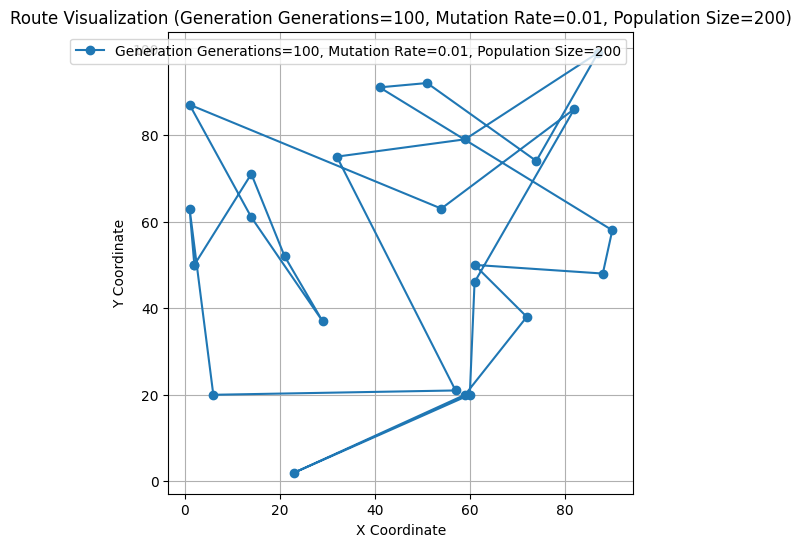

Best Route: [7, 4, 5, 3, 18, 9, 15, 17, 16, 0, 6, 23, 24, 1, 8, 12, 10, 22, 21, 11, 13, 20, 19, 2, 14]
Best Distance: 953.3124020712827


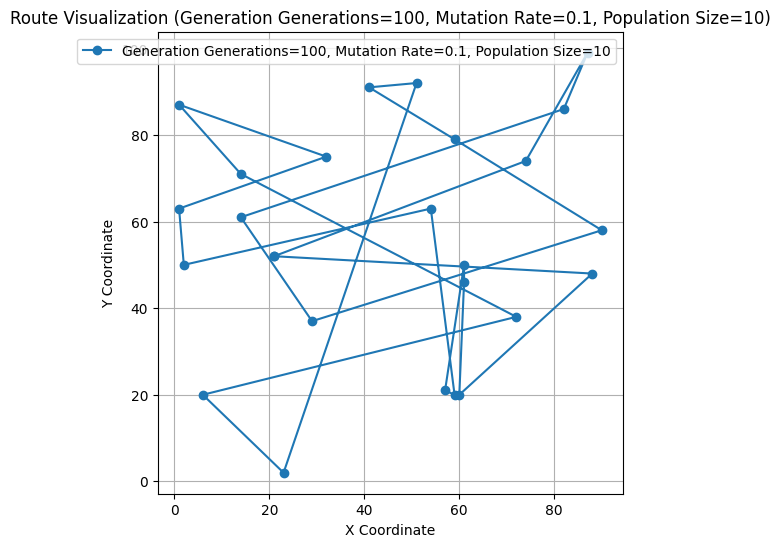

Best Route: [23, 9, 12, 16, 0, 24, 20, 17, 19, 5, 3, 11, 2, 14, 15, 4, 8, 18, 7, 13, 21, 1, 10, 22, 6]
Best Distance: 798.2332590386653


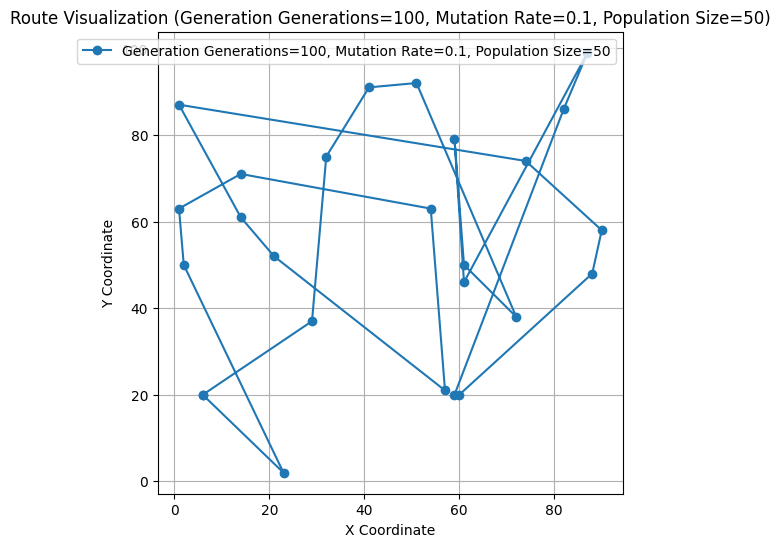

Best Route: [13, 24, 21, 0, 3, 4, 12, 1, 8, 10, 7, 9, 6, 17, 15, 14, 19, 5, 16, 23, 20, 18, 22, 11, 2]
Best Distance: 849.4036439463266


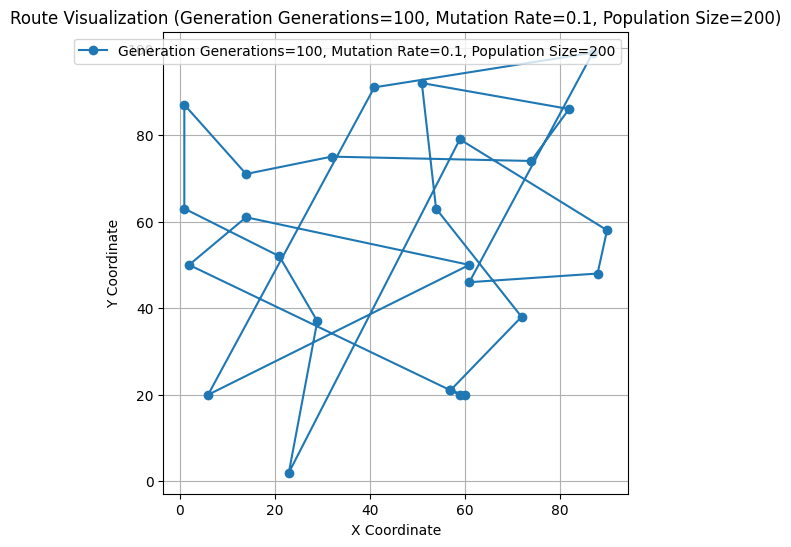

Best Route: [8, 7, 22, 9, 18, 10, 5, 14, 20, 24, 19, 11, 13, 1, 12, 16, 4, 17, 0, 3, 15, 6, 2, 23, 21]
Best Distance: 897.0739860630116


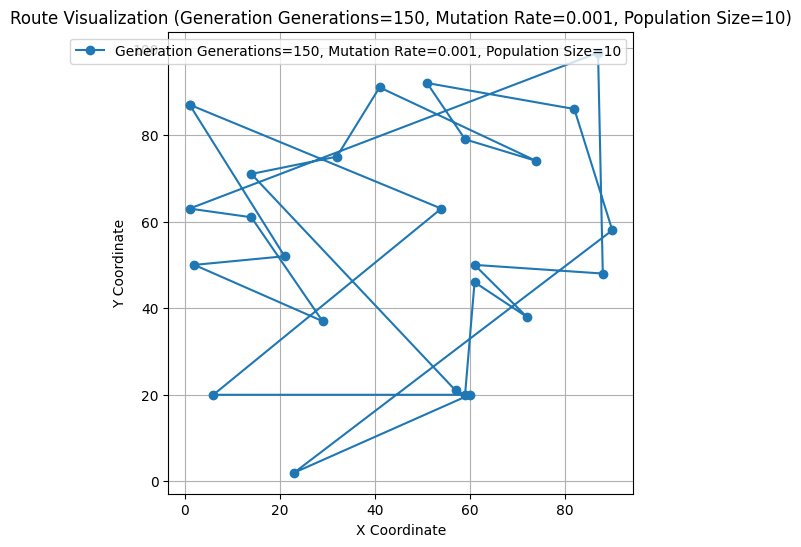

Best Route: [17, 23, 1, 24, 14, 5, 8, 18, 22, 10, 0, 4, 3, 15, 21, 16, 12, 13, 11, 2, 9, 6, 7, 20, 19]
Best Distance: 889.6437967823011


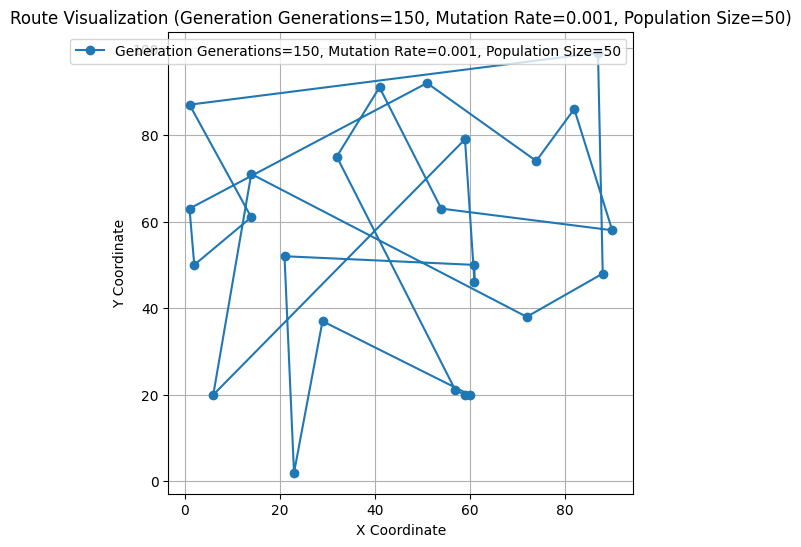

Best Route: [0, 14, 24, 20, 9, 23, 6, 18, 22, 7, 21, 8, 5, 3, 13, 11, 2, 15, 4, 16, 17, 19, 10, 1, 12]
Best Distance: 826.6248881886023


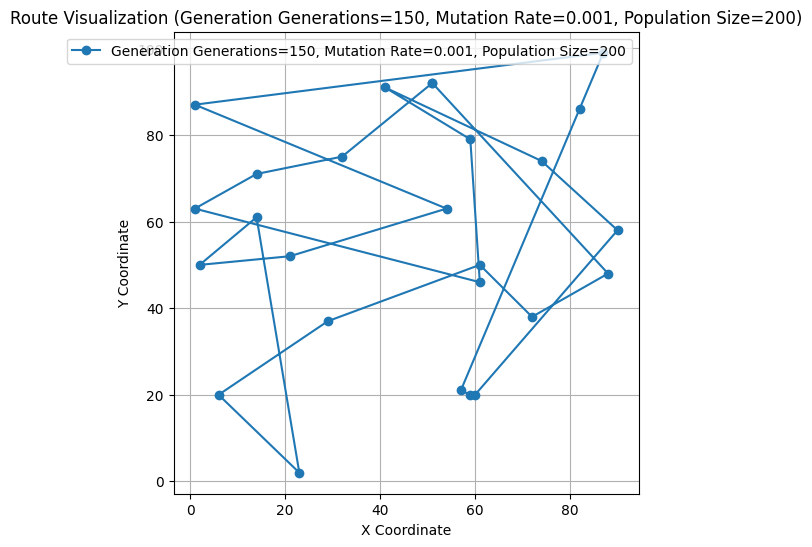

Best Route: [23, 0, 1, 10, 8, 6, 12, 16, 4, 3, 5, 14, 9, 17, 19, 18, 13, 11, 2, 7, 22, 21, 15, 24, 20]
Best Distance: 984.2330538877611


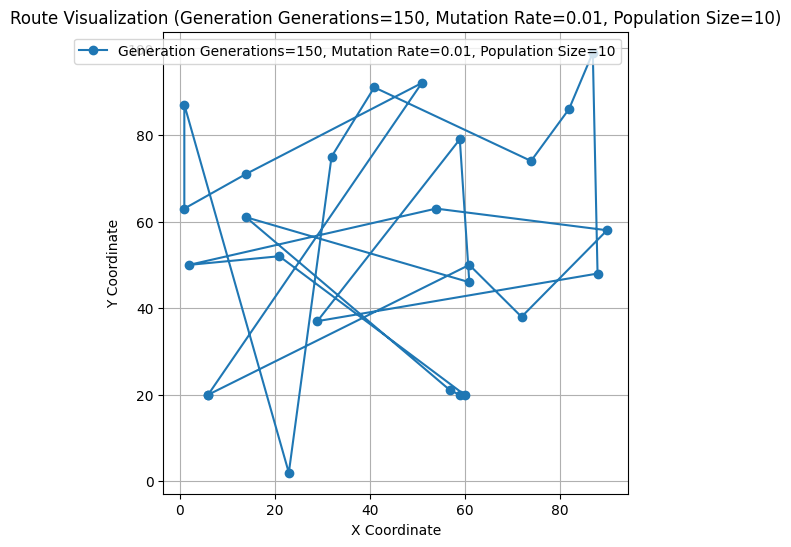

Best Route: [18, 10, 22, 7, 6, 23, 20, 19, 24, 14, 17, 9, 4, 5, 15, 11, 2, 13, 21, 12, 16, 3, 8, 1, 0]
Best Distance: 813.2911758177263


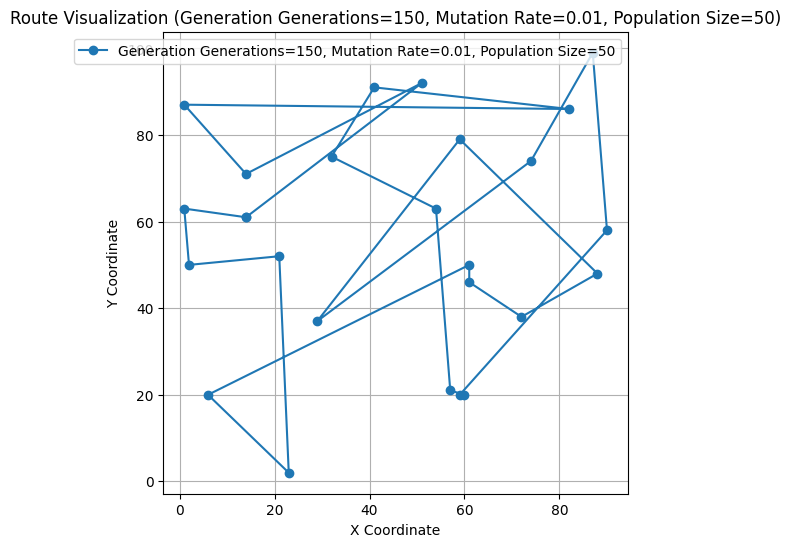

Best Route: [1, 21, 9, 4, 5, 19, 24, 11, 6, 23, 22, 20, 14, 15, 8, 18, 10, 7, 13, 2, 12, 0, 3, 17, 16]
Best Distance: 857.068128444047


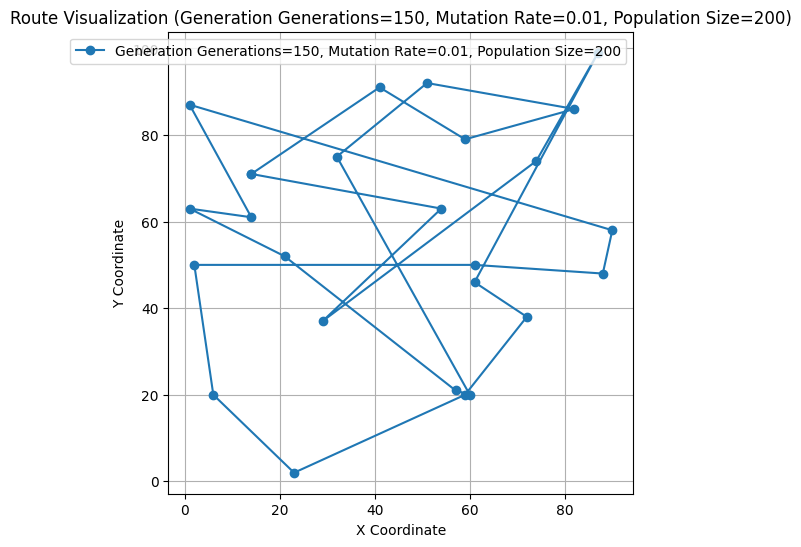

Best Route: [6, 2, 13, 9, 0, 8, 3, 15, 14, 19, 20, 23, 22, 17, 21, 18, 1, 16, 5, 4, 12, 10, 7, 11, 24]
Best Distance: 900.3571202384609


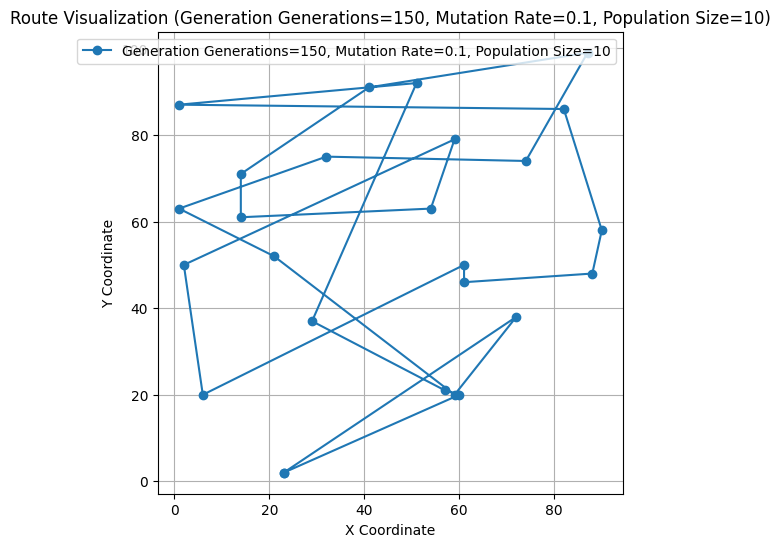

Best Route: [16, 0, 5, 20, 9, 7, 10, 23, 1, 8, 12, 22, 18, 24, 14, 19, 3, 4, 13, 21, 15, 2, 11, 6, 17]
Best Distance: 879.0057172652205


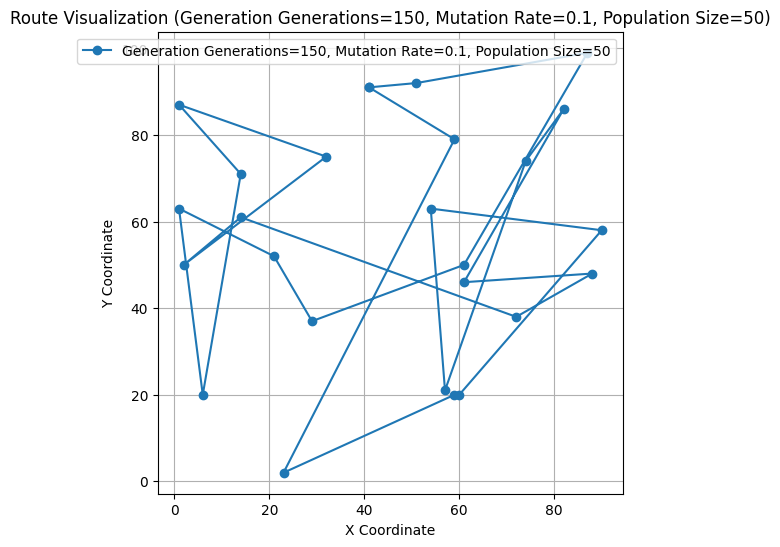

Best Route: [24, 20, 17, 14, 13, 2, 11, 1, 8, 5, 0, 10, 18, 21, 3, 4, 19, 16, 23, 6, 9, 22, 7, 12, 15]
Best Distance: 888.325531128744


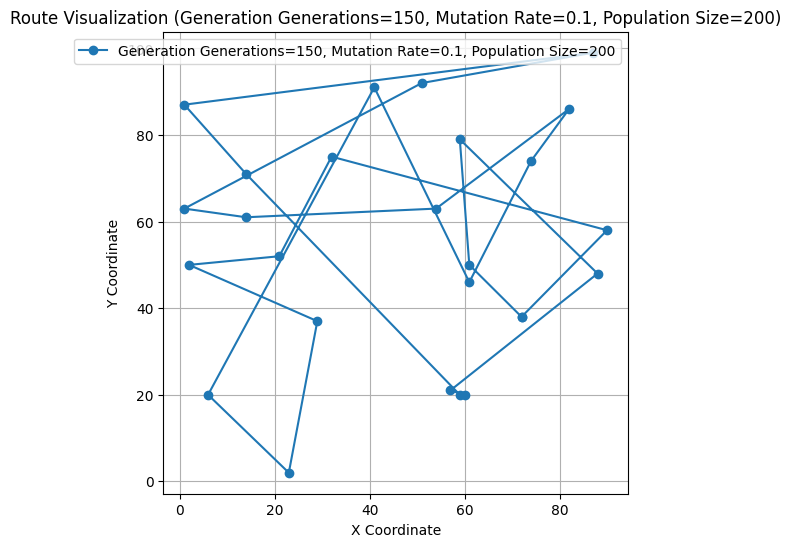

Best Route: [20, 11, 2, 21, 12, 8, 10, 9, 22, 7, 24, 1, 18, 14, 5, 15, 23, 6, 16, 17, 3, 4, 0, 19, 13]
Best Distance: 939.6628370148991


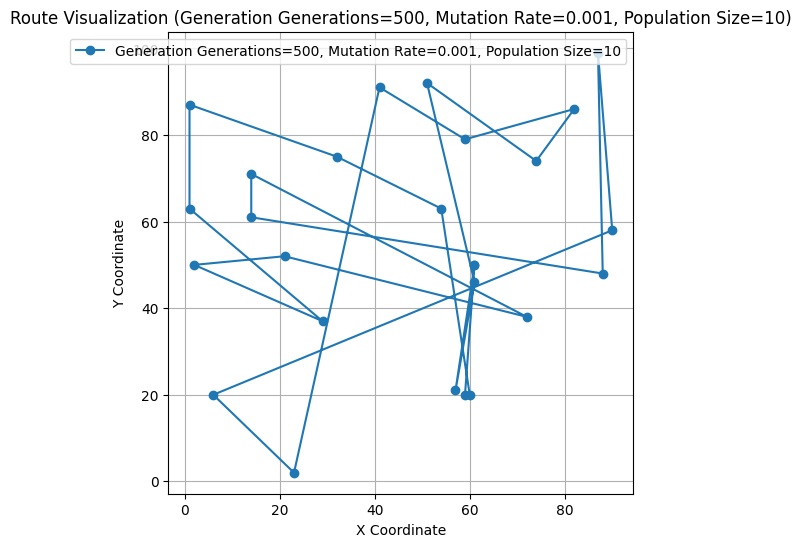

Best Route: [6, 2, 22, 0, 24, 20, 19, 4, 14, 15, 11, 13, 9, 23, 17, 16, 5, 3, 21, 8, 18, 1, 12, 7, 10]
Best Distance: 858.57787540808


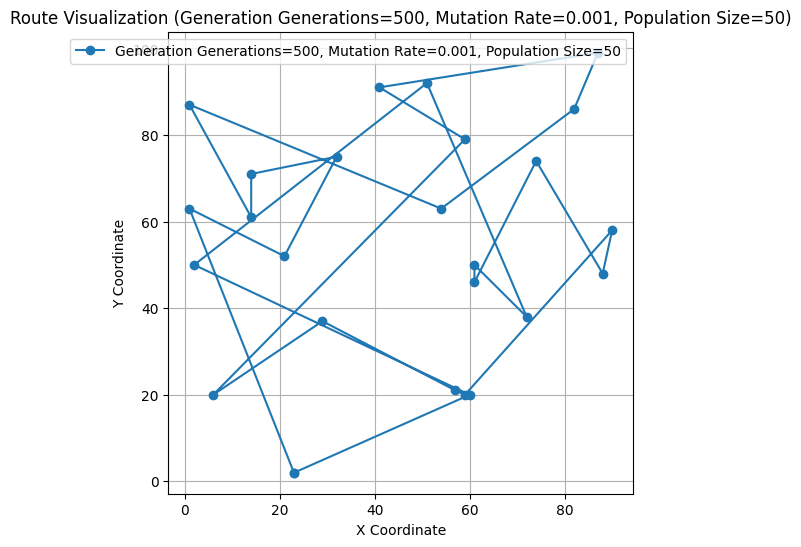

Best Route: [16, 0, 13, 2, 11, 9, 6, 24, 17, 15, 14, 5, 3, 19, 4, 10, 18, 22, 12, 8, 1, 7, 23, 20, 21]
Best Distance: 807.9390896162806


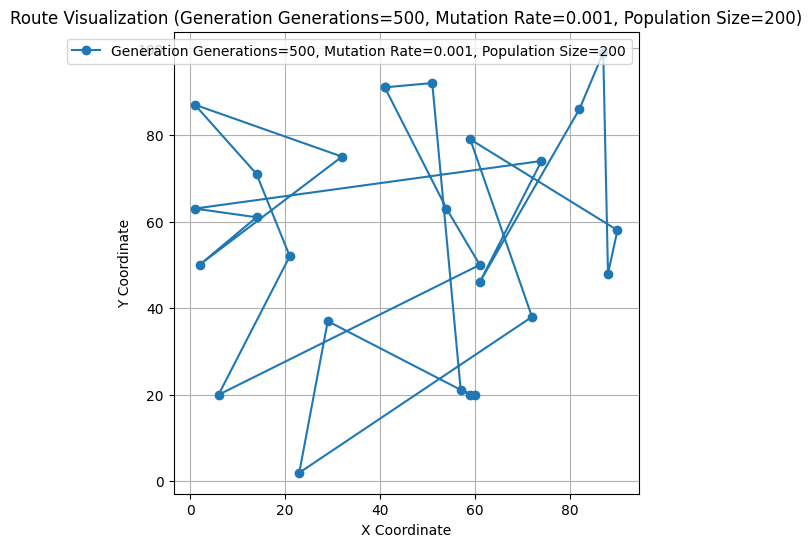

Best Route: [7, 1, 15, 3, 21, 17, 0, 16, 5, 8, 18, 4, 23, 9, 22, 10, 6, 19, 14, 2, 13, 11, 24, 20, 12]
Best Distance: 884.5289045551556


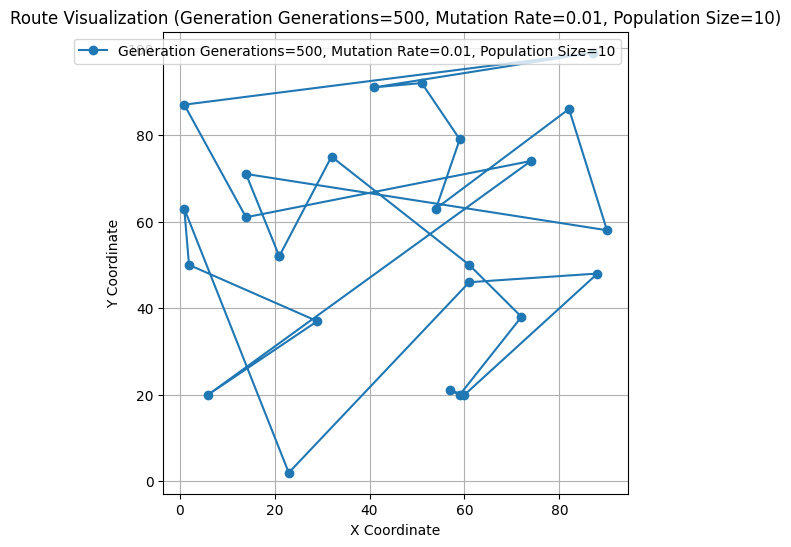

Best Route: [15, 3, 5, 1, 8, 16, 10, 22, 7, 11, 2, 13, 19, 14, 23, 6, 24, 12, 21, 18, 9, 20, 4, 0, 17]
Best Distance: 833.1115294561603


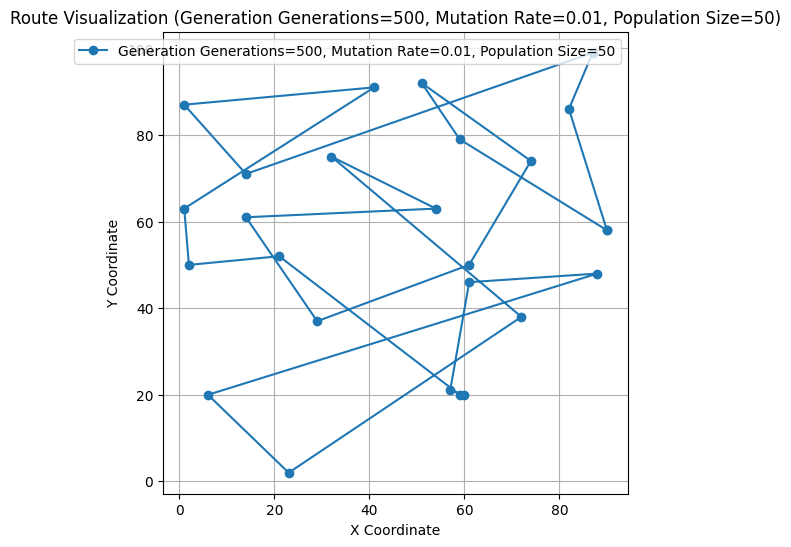

Best Route: [3, 5, 21, 16, 1, 8, 23, 6, 11, 7, 10, 18, 22, 13, 2, 9, 20, 19, 24, 4, 15, 14, 17, 0, 12]
Best Distance: 738.1043637879965


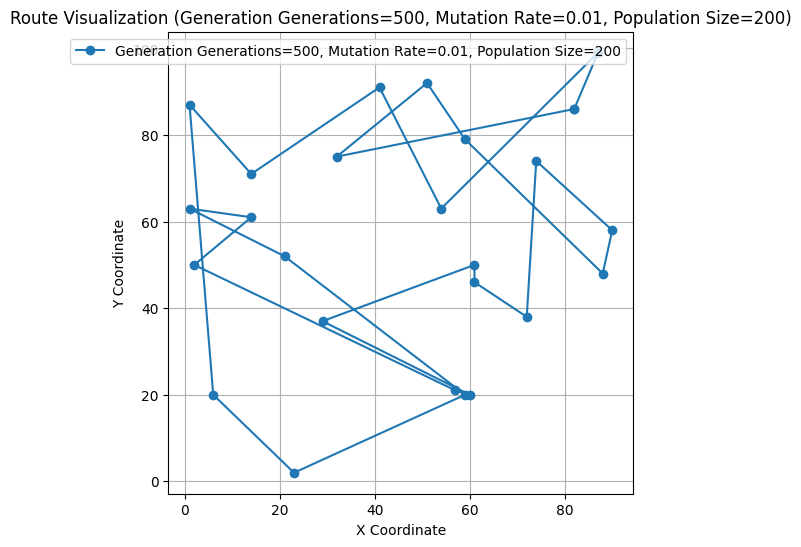

Best Route: [1, 4, 15, 5, 3, 0, 18, 7, 12, 20, 24, 23, 8, 6, 9, 11, 19, 14, 2, 13, 22, 17, 21, 16, 10]
Best Distance: 936.2056126439333


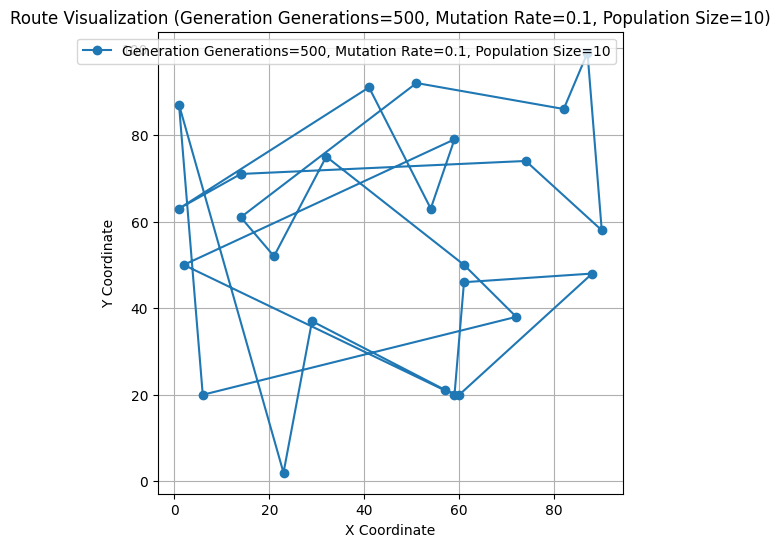

Best Route: [14, 1, 2, 13, 11, 6, 9, 7, 23, 10, 8, 22, 16, 0, 17, 21, 24, 5, 4, 20, 18, 12, 19, 15, 3]
Best Distance: 842.7958225100183


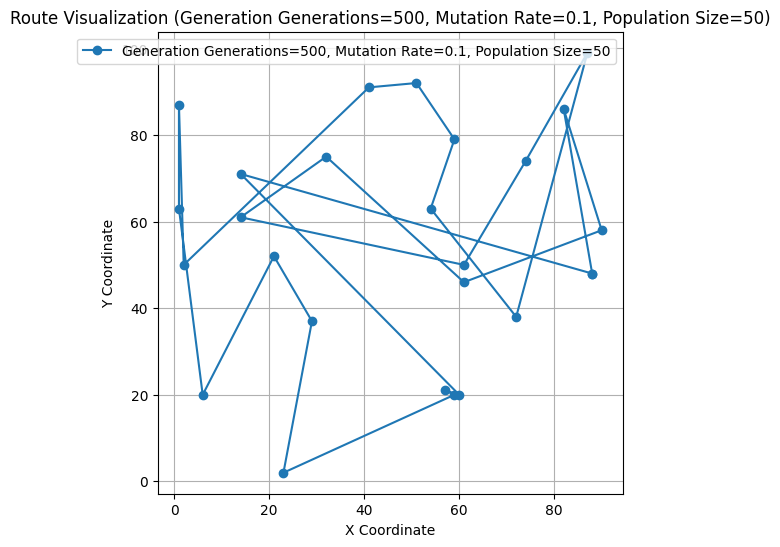

Best Route: [15, 5, 17, 4, 20, 24, 2, 18, 7, 1, 14, 21, 16, 0, 9, 11, 6, 23, 22, 10, 8, 12, 13, 19, 3]
Best Distance: 823.7757825470161


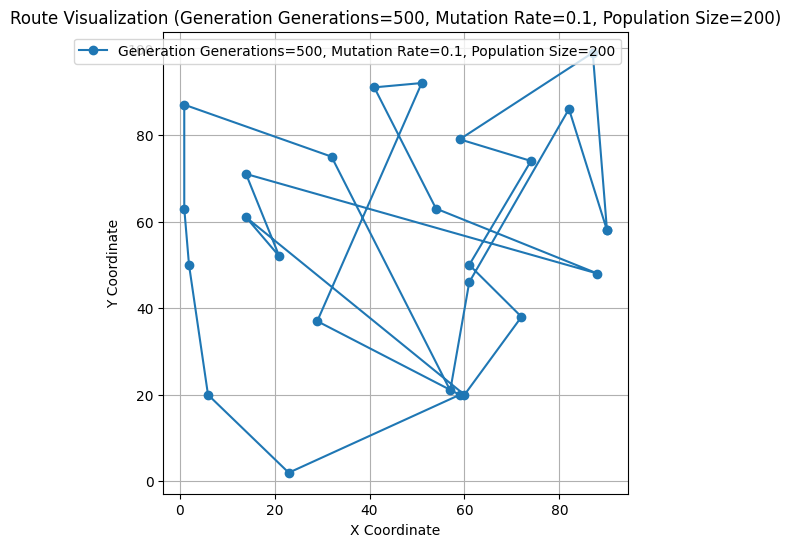

In [12]:
np.random.seed(42)  # For reproducibility
cities = [(np.random.randint(0, 100), np.random.randint(0, 100)) for _ in range(25)]

for generation in generations:
    for mutation_rate in mutation_rates:
        for population_size in population_sizes:
            # Run the Genetic Algorithm
            best_route, best_distance = genetic_algorithm(cities, generations=generation, population_size=population_size, mutation_rate=mutation_rate, verboze=False)
            print("Best Route:", best_route)
            print("Best Distance:", best_distance)
            visualize_route(best_route, cities, f"Generations={generation}, Mutation Rate={mutation_rate}, Population Size={population_size}")